## Define the Convolutional Neural Network

After you've looked at the data you're working with and, in this case, know the shapes of the images and of the keypoints, you are ready to define a convolutional neural network that can *learn* from this data.

In this notebook and in `models.py`, you will:
1. Define a CNN with images as input and keypoints as output
2. Construct the transformed FaceKeypointsDataset, just as before
3. Train the CNN on the training data, tracking loss
4. See how the trained model performs on test data
5. If necessary, modify the CNN structure and model hyperparameters, so that it performs *well* **\***

**\*** What does *well* mean?

"Well" means that the model's loss decreases during training **and**, when applied to test image data, the model produces keypoints that closely match the true keypoints of each face. And you'll see examples of this later in the notebook.

---


## CNN Architecture

Recall that CNN's are defined by a few types of layers:
* Convolutional layers
* Maxpooling layers
* Fully-connected layers

You are required to use the above layers and encouraged to add multiple convolutional layers and things like dropout layers that may prevent overfitting. You are also encouraged to look at literature on keypoint detection, such as [this paper](https://arxiv.org/pdf/1710.00977.pdf), to help you determine the structure of your network.


### TODO: Define your model in the provided file `models.py` file

This file is mostly empty but contains the expected name and some TODO's for creating your model.

---

## PyTorch Neural Nets

To define a neural network in PyTorch, you define the layers of a model in the function `__init__` and define the feedforward behavior of a network that employs those initialized layers in the function `forward`, which takes in an input image tensor, `x`. The structure of this Net class is shown below and left for you to fill in.

Note: During training, PyTorch will be able to perform backpropagation by keeping track of the network's feedforward behavior and using autograd to calculate the update to the weights in the network.

#### Define the Layers in ` __init__`
As a reminder, a conv/pool layer may be defined like this (in `__init__`):
```
# 1 input image channel (for grayscale images), 32 output channels/feature maps, 3x3 square convolution kernel
self.conv1 = nn.Conv2d(1, 32, 3)

# maxpool that uses a square window of kernel_size=2, stride=2
self.pool = nn.MaxPool2d(2, 2)      
```

#### Refer to Layers in `forward`
Then referred to in the `forward` function like this, in which the conv1 layer has a ReLu activation applied to it before maxpooling is applied:
```
x = self.pool(F.relu(self.conv1(x)))
```

Best practice is to place any layers whose weights will change during the training process in `__init__` and refer to them in the `forward` function; any layers or functions that always behave in the same way, such as a pre-defined activation function, should appear *only* in the `forward` function.

#### Why models.py

You are tasked with defining the network in the `models.py` file so that any models you define can be saved and loaded by name in different notebooks in this project directory. For example, by defining a CNN class called `Net` in `models.py`, you can then create that same architecture in this and other notebooks by simply importing the class and instantiating a model:
```
    from models import Net
    net = Net()
```

In [1]:
# load the data if you need to; if you have already loaded the data, you may comment this cell out
# -- DO NOT CHANGE THIS CELL -- #
!mkdir /data
!wget -P /data/ https://s3.amazonaws.com/video.udacity-data.com/topher/2018/May/5aea1b91_train-test-data/train-test-data.zip
!unzip -n /data/train-test-data.zip -d /data

mkdir: cannot create directory ‘/data’: File exists
--2020-12-23 04:57:45--  https://s3.amazonaws.com/video.udacity-data.com/topher/2018/May/5aea1b91_train-test-data/train-test-data.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.109.246
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.109.246|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 338613624 (323M) [application/zip]
Saving to: ‘/data/train-test-data.zip.2’

train-test-data.zip 100%[===================>] 322.93M  80.0MB/s    in 4.1s    

2020-12-23 04:57:49 (79.0 MB/s) - ‘/data/train-test-data.zip.2’ saved [338613624/338613624]

Archive:  /data/train-test-data.zip


<div class="alert alert-info">**Note:** Workspaces automatically close connections after 30 minutes of inactivity (including inactivity while training!). Use the code snippet below to keep your workspace alive during training. (The active_session context manager is imported below.)
</div>
```
from workspace_utils import active_session

with active_session():
    train_model(num_epochs)
```


In [2]:
# import the usual resources
import matplotlib.pyplot as plt
import numpy as np

# import utilities to keep workspaces alive during model training
from workspace_utils import active_session

# watch for any changes in model.py, if it changes, re-load it automatically
%load_ext autoreload
%autoreload 2

In [3]:
## TODO: Define the Net in models.py

import torch
import torch.nn as nn
import torch.nn.functional as F

## TODO: Once you've define the network, you can instantiate it
# one example conv layer has been provided for you
from models import Net

net = Net()
print(net)

Net(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1))
  (conv1_drop): Dropout(p=0.5)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=80000, out_features=1000, bias=True)
  (fc1_drop): Dropout(p=0.4)
  (fc2): Linear(in_features=1000, out_features=136, bias=True)
)


## Transform the dataset 

To prepare for training, create a transformed dataset of images and keypoints.

### TODO: Define a data transform

In PyTorch, a convolutional neural network expects a torch image of a consistent size as input. For efficient training, and so your model's loss does not blow up during training, it is also suggested that you normalize the input images and keypoints. The necessary transforms have been defined in `data_load.py` and you **do not** need to modify these; take a look at this file (you'll see the same transforms that were defined and applied in Notebook 1).

To define the data transform below, use a [composition](http://pytorch.org/tutorials/beginner/data_loading_tutorial.html#compose-transforms) of:
1. Rescaling and/or cropping the data, such that you are left with a square image (the suggested size is 224x224px)
2. Normalizing the images and keypoints; turning each RGB image into a grayscale image with a color range of [0, 1] and transforming the given keypoints into a range of [-1, 1]
3. Turning these images and keypoints into Tensors

These transformations have been defined in `data_load.py`, but it's up to you to call them and create a `data_transform` below. **This transform will be applied to the training data and, later, the test data**. It will change how you go about displaying these images and keypoints, but these steps are essential for efficient training.

As a note, should you want to perform data augmentation (which is optional in this project), and randomly rotate or shift these images, a square image size will be useful; rotating a 224x224 image by 90 degrees will result in the same shape of output.

In [4]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

# the dataset we created in Notebook 1 is copied in the helper file `data_load.py`
from data_load import FacialKeypointsDataset
# the transforms we defined in Notebook 1 are in the helper file `data_load.py`
from data_load import Rescale, RandomCrop, Normalize, ToTensor


## TODO: define the data_transform using transforms.Compose([all tx's, . , .])
# order matters! i.e. rescaling should come before a smaller crop
data_transform = transforms.Compose([Rescale(250),
                                     RandomCrop(224),
                                     Normalize(),
                                     ToTensor()])

# testing that you've defined a transform
assert(data_transform is not None), 'Define a data_transform'

In [5]:
# create the transformed dataset
transformed_dataset = FacialKeypointsDataset(csv_file='/data/training_frames_keypoints.csv',
                                             root_dir='/data/training/',
                                             transform=data_transform)


print('Number of images: ', len(transformed_dataset))

# iterate through the transformed dataset and print some stats about the first few samples
for i in range(4):
    sample = transformed_dataset[i]
    print(i, sample['image'].size(), sample['keypoints'].size())

Number of images:  3462
0 torch.Size([1, 224, 224]) torch.Size([68, 2])
1 torch.Size([1, 224, 224]) torch.Size([68, 2])
2 torch.Size([1, 224, 224]) torch.Size([68, 2])
3 torch.Size([1, 224, 224]) torch.Size([68, 2])


/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


## Batching and loading data

Next, having defined the transformed dataset, we can use PyTorch's DataLoader class to load the training data in batches of whatever size as well as to shuffle the data for training the model. You can read more about the parameters of the DataLoader, in [this documentation](http://pytorch.org/docs/master/data.html).

#### Batch size
Decide on a good batch size for training your model. Try both small and large batch sizes and note how the loss decreases as the model trains. Too large a batch size may cause your model to crash and/or run out of memory while training.

**Note for Windows users**: Please change the `num_workers` to 0 or you may face some issues with your DataLoader failing.

In [6]:
# load training data in batches
batch_size = 10

train_loader = DataLoader(transformed_dataset, 
                          batch_size=batch_size,
                          shuffle=True, 
                          num_workers=4)


## Before training

Take a look at how this model performs before it trains. You should see that the keypoints it predicts start off in one spot and don't match the keypoints on a face at all! It's interesting to visualize this behavior so that you can compare it to the model after training and see how the model has improved.

#### Load in the test dataset

The test dataset is one that this model has *not* seen before, meaning it has not trained with these images. We'll load in this test data and before and after training, see how your model performs on this set!

To visualize this test data, we have to go through some un-transformation steps to turn our images into python images from tensors and to turn our keypoints back into a recognizable range. 

In [7]:
# load in the test data, using the dataset class
# AND apply the data_transform you defined above

# create the test dataset
test_dataset = FacialKeypointsDataset(csv_file='/data/test_frames_keypoints.csv',
                                             root_dir='/data/test/',
                                             transform=data_transform)


In [8]:
# load test data in batches

test_loader = DataLoader(test_dataset, 
                          batch_size=batch_size,
                          shuffle=True, 
                          num_workers=4)

## Apply the model on a test sample

To test the model on a test sample of data, you have to follow these steps:
1. Extract the image and ground truth keypoints from a sample
2. Wrap the image in a Variable, so that the net can process it as input and track how it changes as the image moves through the network.
3. Make sure the image is a FloatTensor, which the model expects.
4. Forward pass the image through the net to get the predicted, output keypoints.

This function test how the network performs on the first batch of test data. It returns the images, the transformed images, the predicted keypoints (produced by the model), and the ground truth keypoints.

In [9]:
# test the model on a batch of test images

def net_sample_output():
    # iterate through the test dataset
    for i, sample in enumerate(test_loader):
        # get sample data: images and ground truth keypoints
        images = sample['image']
        key_pts = sample['keypoints']
        # convert images to FloatTensors
        images = images.type(torch.FloatTensor)

        # forward pass to get net output
        output_pts = net(images)
        
        # reshape to batch_size x 68 x 2 pts
        output_pts = output_pts.view(output_pts.size()[0], 68, -1)
        
        # break after first image is tested
        if i == 0:
            return images, output_pts, key_pts
            

#### Debugging tips

If you get a size or dimension error here, make sure that your network outputs the expected number of keypoints! Or if you get a Tensor type error, look into changing the above code that casts the data into float types: `images = images.type(torch.FloatTensor)`.

In [10]:

# call the above function
# returns: test images, test predicted keypoints, test ground truth keypoints
test_images, test_outputs, gt_pts = net_sample_output()

# print out the dimensions of the data to see if they make sense
print('test_images.data.size()', test_images.data.size())
print('test_outputs.data.size()', test_outputs.data.size())
print('gt_pts.size()', gt_pts.size())

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


test_images.data.size() torch.Size([10, 1, 224, 224])
test_outputs.data.size() torch.Size([10, 68, 2])
gt_pts.size() torch.Size([10, 68, 2])


## Visualize the predicted keypoints

Once we've had the model produce some predicted output keypoints, we can visualize these points in a way that's similar to how we've displayed this data before, only this time, we have to "un-transform" the image/keypoint data to display it.

Note that I've defined a *new* function, `show_all_keypoints` that displays a grayscale image, its predicted keypoints and its ground truth keypoints (if provided).

In [11]:
def show_all_keypoints(image, predicted_key_pts, gt_pts=None):
    """Show image with predicted keypoints"""
    # image is grayscale
    plt.imshow(image, cmap='gray')
    plt.scatter(predicted_key_pts[:, 0], predicted_key_pts[:, 1], s=20, marker='.', c='m')
    # plot ground truth points as green pts
    if gt_pts is not None:
        plt.scatter(gt_pts[:, 0], gt_pts[:, 1], s=20, marker='.', c='g')


#### Un-transformation

Next, you'll see a helper function. `visualize_output` that takes in a batch of images, predicted keypoints, and ground truth keypoints and displays a set of those images and their true/predicted keypoints.

This function's main role is to take batches of image and keypoint data (the input and output of your CNN), and transform them into numpy images and un-normalized keypoints (x, y) for normal display. The un-transformation process turns keypoints and images into numpy arrays from Tensors *and* it undoes the keypoint normalization done in the Normalize() transform; it's assumed that you applied these transformations when you loaded your test data.

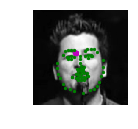

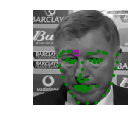

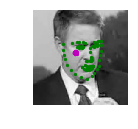

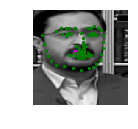

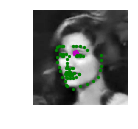

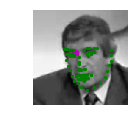

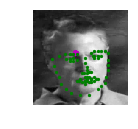

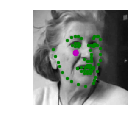

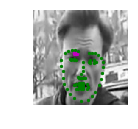

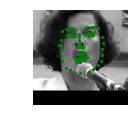

In [12]:
# visualize the output
# by default this shows a batch of 10 images
def visualize_output(test_images, test_outputs, gt_pts=None, batch_size=10):

    for i in range(batch_size):
        plt.figure(figsize=(20,10))
        ax = plt.subplot(1, batch_size, i+1)

        # un-transform the image data
        image = test_images[i].data   # get the image from it's Variable wrapper
        image = image.numpy()   # convert to numpy array from a Tensor
        image = np.transpose(image, (1, 2, 0))   # transpose to go from torch to numpy image

        # un-transform the predicted key_pts data
        predicted_key_pts = test_outputs[i].data
        predicted_key_pts = predicted_key_pts.numpy()
        # undo normalization of keypoints  
        predicted_key_pts = predicted_key_pts*50.0+100
        
        # plot ground truth points for comparison, if they exist
        ground_truth_pts = None
        if gt_pts is not None:
            ground_truth_pts = gt_pts[i]         
            ground_truth_pts = ground_truth_pts*50.0+100
        
        # call show_all_keypoints
        show_all_keypoints(np.squeeze(image), predicted_key_pts, ground_truth_pts)
            
        plt.axis('off')

    plt.show()
    
# call it
visualize_output(test_images, test_outputs, gt_pts)

## Training

#### Loss function
Training a network to predict keypoints is different than training a network to predict a class; instead of outputting a distribution of classes and using cross entropy loss, you may want to choose a loss function that is suited for regression, which directly compares a predicted value and target value. Read about the various kinds of loss functions (like MSE or L1/SmoothL1 loss) in [this documentation](http://pytorch.org/docs/master/_modules/torch/nn/modules/loss.html).

### TODO: Define the loss and optimization

Next, you'll define how the model will train by deciding on the loss function and optimizer.

---

In [13]:
# http://cs.wellesley.edu/~vision/slides/Qianli_summary_deep_face_models.pdf
## TODO: Define the loss and optimization
import torch.optim as optim

# criterion = nn.MSELoss()
# criterion = nn.L1Loss()
criterion = nn.SmoothL1Loss()
learning_rate = 1e-4
# learning_rate = 1e-3
optimizer = optim.Adam(net.parameters(), lr=learning_rate)

## Training and Initial Observation

Now, you'll train on your batched training data from `train_loader` for a number of epochs. 

To quickly observe how your model is training and decide on whether or not you should modify it's structure or hyperparameters, you're encouraged to start off with just one or two epochs at first. As you train, note how your the model's loss behaves over time: does it decrease quickly at first and then slow down? Does it take a while to decrease in the first place? What happens if you change the batch size of your training data or modify your loss function? etc. 

Use these initial observations to make changes to your model and decide on the best architecture before you train for many epochs and create a final model.

In [14]:
import time

def train_net(n_epochs):
    loss_over_time = [] # to track the loss as the network trains

    # prepare the net for training
    net.train()

    for epoch in range(n_epochs):  # loop over the dataset multiple times
        
        running_loss = 0.0
        start = time.time()

        # train on batches of data, assumes you already have train_loader
        for batch_i, data in enumerate(train_loader):
            # get the input images and their corresponding labels
            images = data['image']
            key_pts = data['keypoints']

            # flatten pts
            key_pts = key_pts.view(key_pts.size(0), -1)

            # convert variables to floats for regression loss
            key_pts = key_pts.type(torch.FloatTensor)
            images = images.type(torch.FloatTensor)

            # forward pass to get outputs
            output_pts = net(images)

            # calculate the loss between predicted and target keypoints
            loss = criterion(output_pts, key_pts)

            # zero the parameter (weight) gradients
            optimizer.zero_grad()
            
            # backward pass to calculate the weight gradients
            loss.backward()

            # update the weights
            optimizer.step()

            # print loss statistics
            running_loss += loss.item()
            if batch_i % 10 == 9:    # print every 10 batches
                avg_loss = running_loss/10
                loss_over_time.append(avg_loss)
                print('Epoch: {}, Batch: {}, Avg. Loss: {}'.format(epoch + 1, batch_i+1, avg_loss))
                print(time.time() - start)
                start = time.time()
                running_loss = 0.0
                # visualize the loss as the network trained
                plt.plot(loss_over_time)
                plt.xlabel('1000\'s of batches')
                plt.ylabel('loss')
#                 plt.ylim(0, 2.5) # consistent scale
                plt.show()

    print('Finished Training')
    return loss_over_time


/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 1, Batch: 10, Avg. Loss: 0.17331588864326478
32.127257347106934


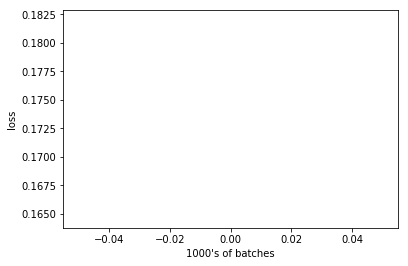

Epoch: 1, Batch: 20, Avg. Loss: 0.15037655010819434
30.173120260238647


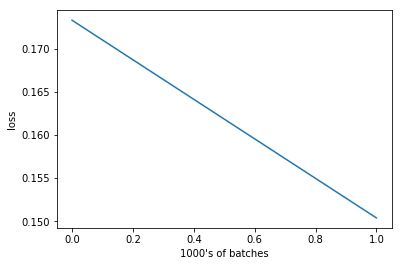

Epoch: 1, Batch: 30, Avg. Loss: 0.12933756038546562
28.339378356933594


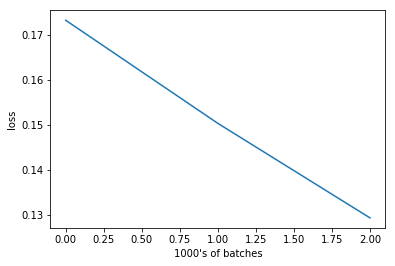

Epoch: 1, Batch: 40, Avg. Loss: 0.10896979570388794
28.575181245803833


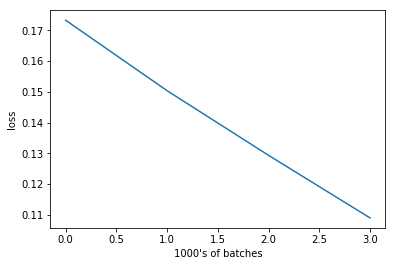

Epoch: 1, Batch: 50, Avg. Loss: 0.10639569014310837
28.365265130996704


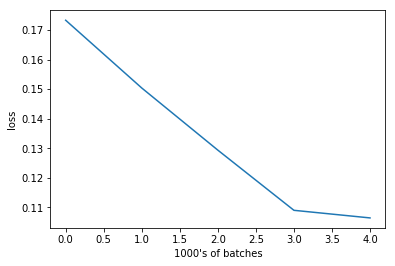

Epoch: 1, Batch: 60, Avg. Loss: 0.09501604661345482
28.440388202667236


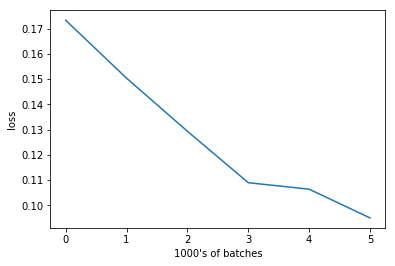

Epoch: 1, Batch: 70, Avg. Loss: 0.10358091741800309
32.36890935897827


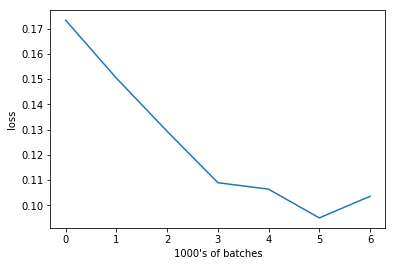

Epoch: 1, Batch: 80, Avg. Loss: 0.10990378558635712
28.082886219024658


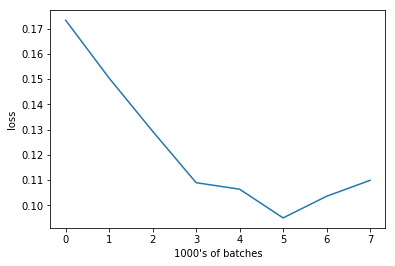

Epoch: 1, Batch: 90, Avg. Loss: 0.11589581221342087
28.6179518699646


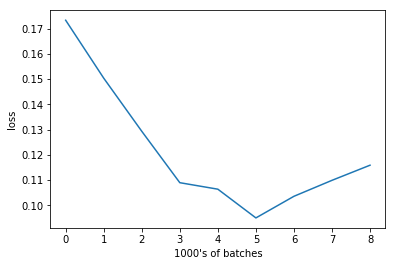

Epoch: 1, Batch: 100, Avg. Loss: 0.09335737377405166
28.08810329437256


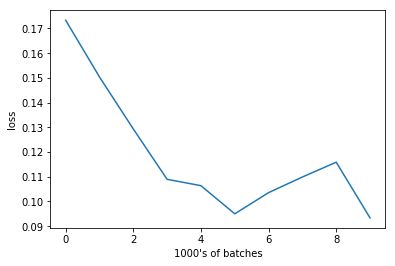

Epoch: 1, Batch: 110, Avg. Loss: 0.11076724231243133
28.202204704284668


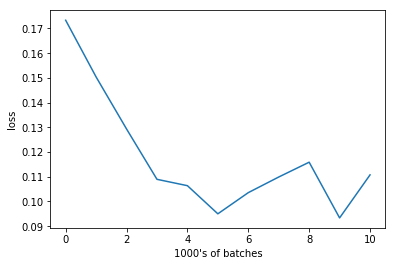

Epoch: 1, Batch: 120, Avg. Loss: 0.10581794902682304
28.088210582733154


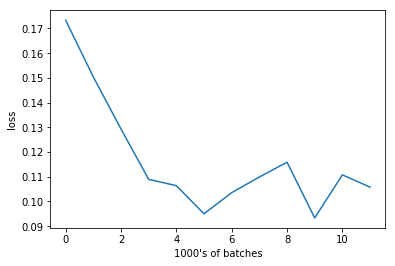

Epoch: 1, Batch: 130, Avg. Loss: 0.0812079232186079
28.045226335525513


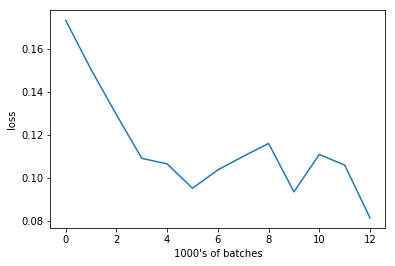

Epoch: 1, Batch: 140, Avg. Loss: 0.10773534849286079
27.998504161834717


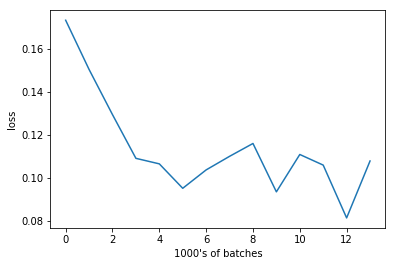

Epoch: 1, Batch: 150, Avg. Loss: 0.09480461701750756
27.95676279067993


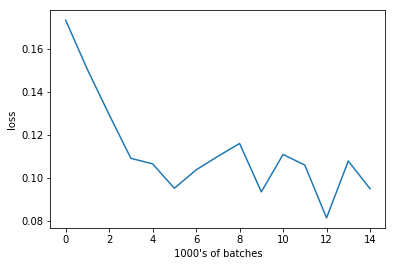

Epoch: 1, Batch: 160, Avg. Loss: 0.07814470902085305
28.111204147338867


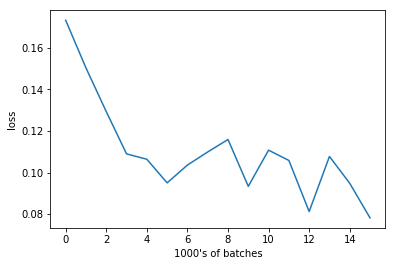

Epoch: 1, Batch: 170, Avg. Loss: 0.09677575640380383
28.614614963531494


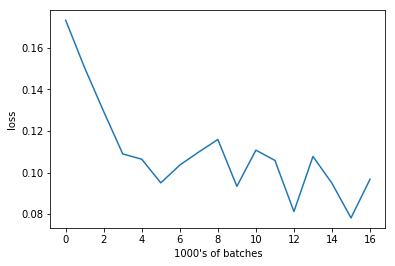

Epoch: 1, Batch: 180, Avg. Loss: 0.08444799520075322
28.306844472885132


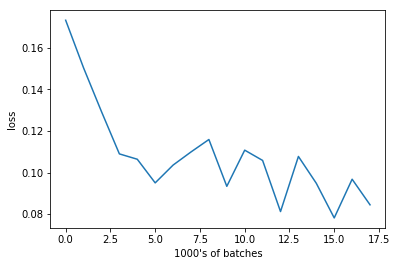

Epoch: 1, Batch: 190, Avg. Loss: 0.0910439569503069
28.5124773979187


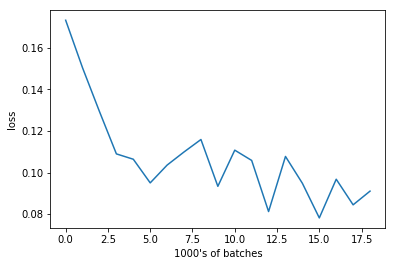

Epoch: 1, Batch: 200, Avg. Loss: 0.11718721389770508
28.0099880695343


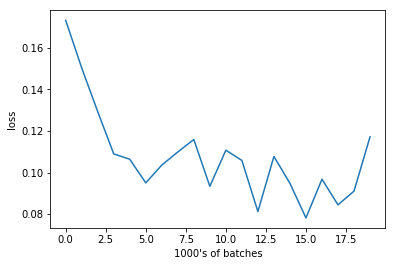

Epoch: 1, Batch: 210, Avg. Loss: 0.09244840070605279
27.96722412109375


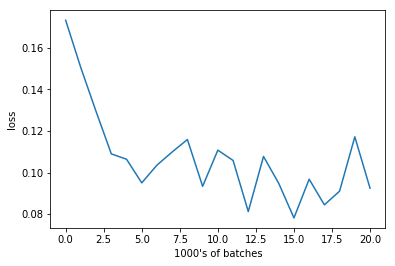

Epoch: 1, Batch: 220, Avg. Loss: 0.09304183200001717
28.035354137420654


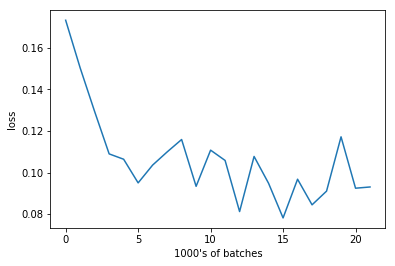

Epoch: 1, Batch: 230, Avg. Loss: 0.11380187012255191
28.170950889587402


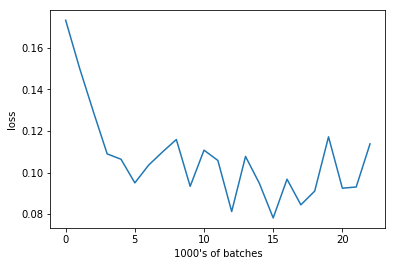

Epoch: 1, Batch: 240, Avg. Loss: 0.09325438514351844
28.267688035964966


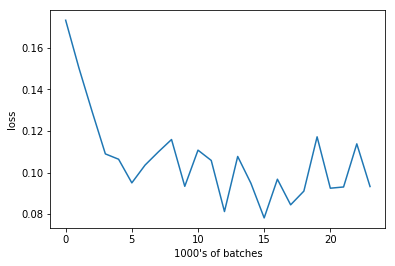

Epoch: 1, Batch: 250, Avg. Loss: 0.08103319294750691
28.06683659553528


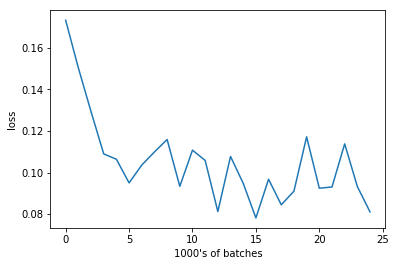

Epoch: 1, Batch: 260, Avg. Loss: 0.08079313337802888
28.90764546394348


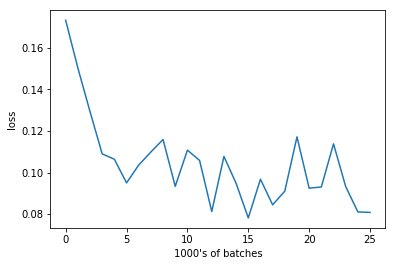

Epoch: 1, Batch: 270, Avg. Loss: 0.07602614872157573
28.11980128288269


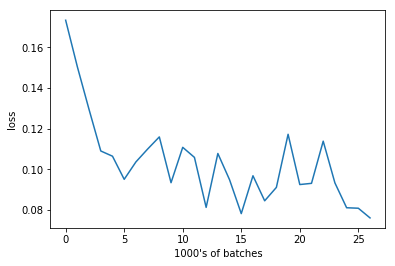

Epoch: 1, Batch: 280, Avg. Loss: 0.08093848899006843
28.097882986068726


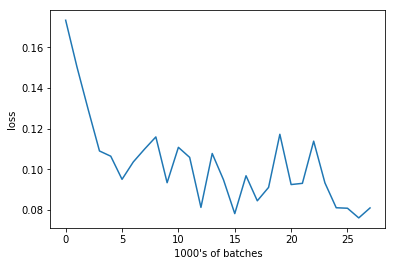

Epoch: 1, Batch: 290, Avg. Loss: 0.11659277230501175
28.13857126235962


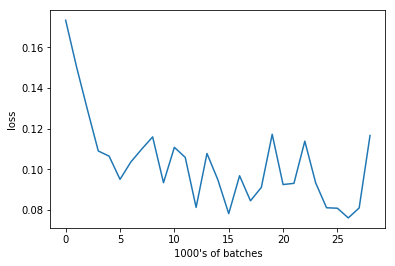

Epoch: 1, Batch: 300, Avg. Loss: 0.0740761686116457
27.885056734085083


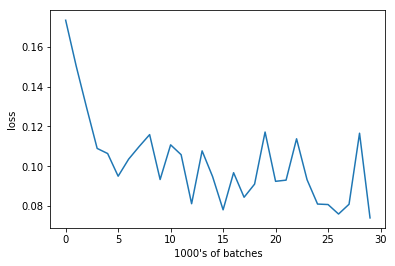

Epoch: 1, Batch: 310, Avg. Loss: 0.0965639553964138
28.301992654800415


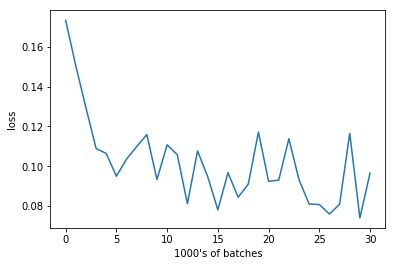

Epoch: 1, Batch: 320, Avg. Loss: 0.07965903617441654
27.987272024154663


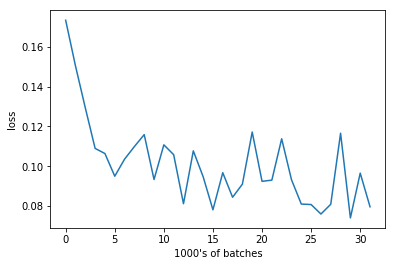

Epoch: 1, Batch: 330, Avg. Loss: 0.08189034759998322
27.896445512771606


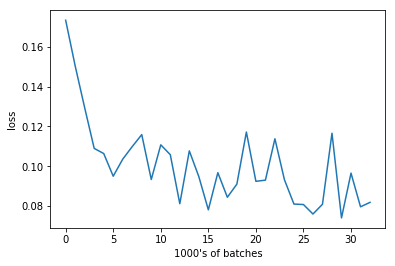

Epoch: 1, Batch: 340, Avg. Loss: 0.08784613870084286
28.49612832069397


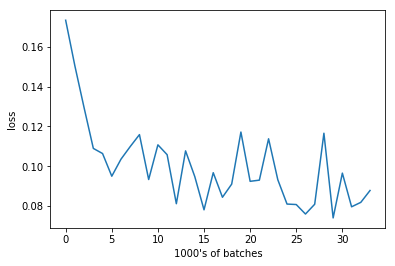

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 2, Batch: 10, Avg. Loss: 0.07116975001990795
43.902124881744385


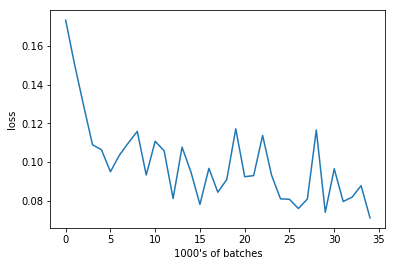

Epoch: 2, Batch: 20, Avg. Loss: 0.07877960987389088
28.65684485435486


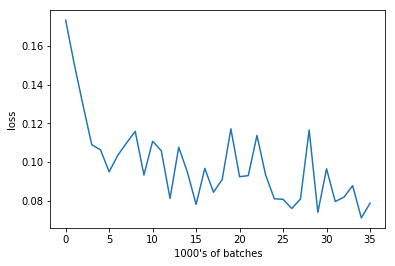

Epoch: 2, Batch: 30, Avg. Loss: 0.07517992407083511
28.50019359588623


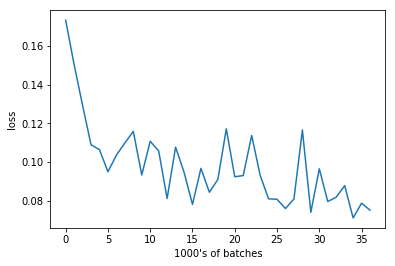

Epoch: 2, Batch: 40, Avg. Loss: 0.07600818686187268
28.117024183273315


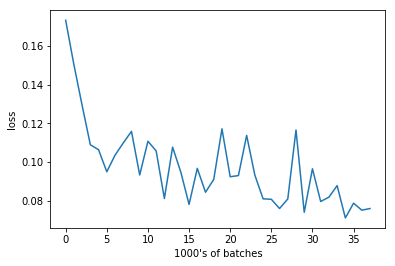

Epoch: 2, Batch: 50, Avg. Loss: 0.07516251318156719
28.140647649765015


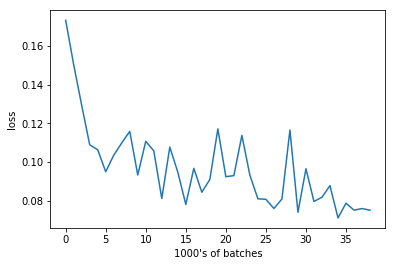

Epoch: 2, Batch: 60, Avg. Loss: 0.07580142319202424
28.53114891052246


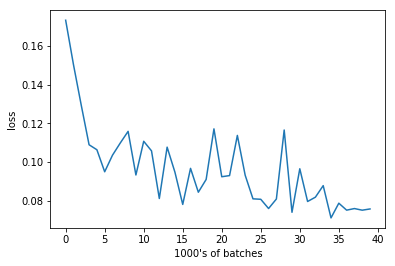

Epoch: 2, Batch: 70, Avg. Loss: 0.07476904541254044
29.081815242767334


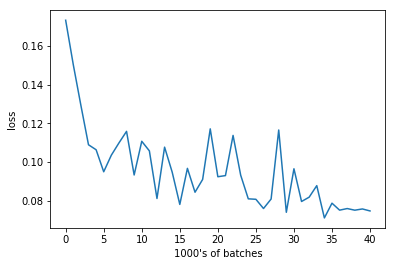

Epoch: 2, Batch: 80, Avg. Loss: 0.09931875318288803
28.20953130722046


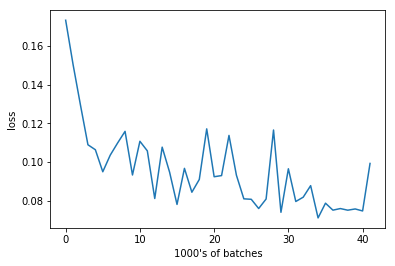

Epoch: 2, Batch: 90, Avg. Loss: 0.07969066873192787
27.80497646331787


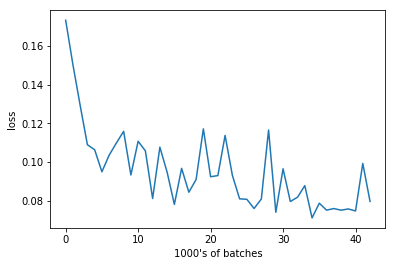

Epoch: 2, Batch: 100, Avg. Loss: 0.08956336341798306
28.255652904510498


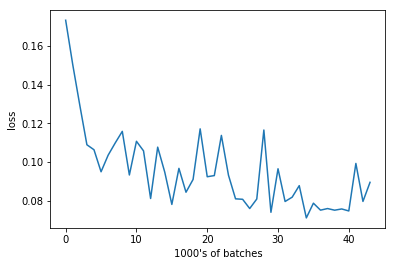

Epoch: 2, Batch: 110, Avg. Loss: 0.06903340294957161
28.191213846206665


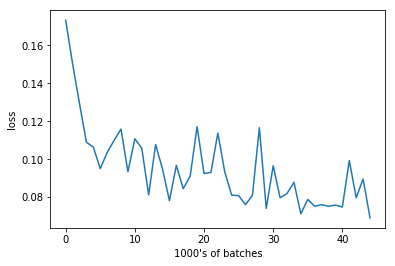

Epoch: 2, Batch: 120, Avg. Loss: 0.08055402487516403
28.498326063156128


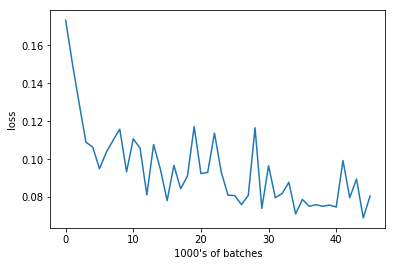

Epoch: 2, Batch: 130, Avg. Loss: 0.07092154882848263
28.26031255722046


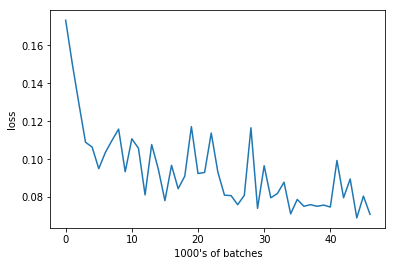

Epoch: 2, Batch: 140, Avg. Loss: 0.07898968942463398
27.989654541015625


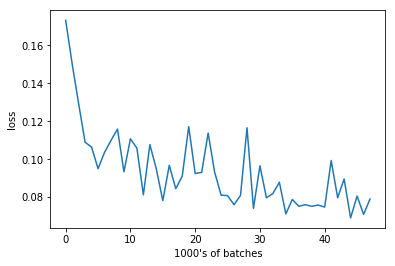

Epoch: 2, Batch: 150, Avg. Loss: 0.06909965500235557
28.182941198349


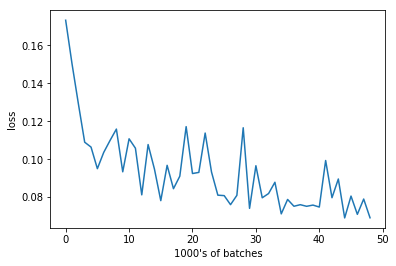

Epoch: 2, Batch: 160, Avg. Loss: 0.06845141164958476
28.490813493728638


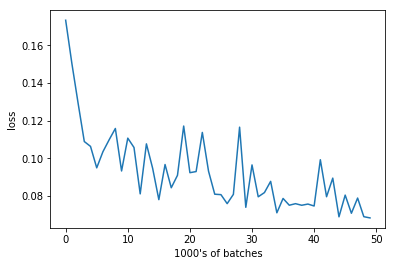

Epoch: 2, Batch: 170, Avg. Loss: 0.08708411082625389
27.81911039352417


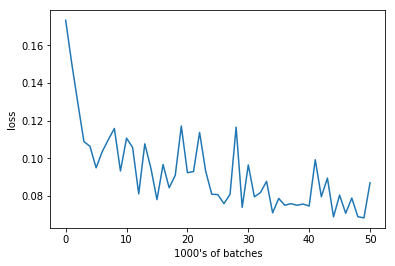

Epoch: 2, Batch: 180, Avg. Loss: 0.07287710644304753
28.237112045288086


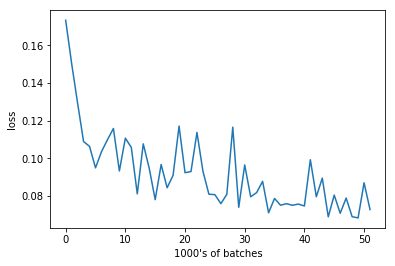

Epoch: 2, Batch: 190, Avg. Loss: 0.07090609967708587
27.89061951637268


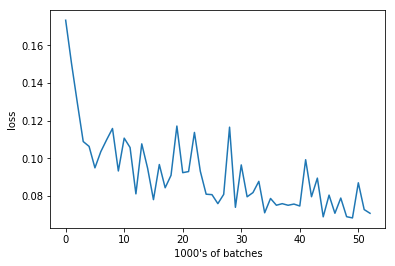

Epoch: 2, Batch: 200, Avg. Loss: 0.07223166972398758
28.345247745513916


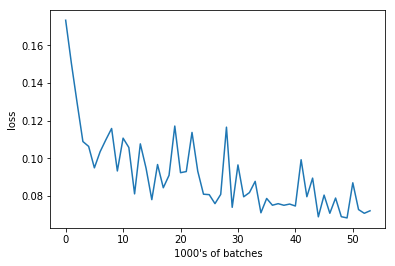

Epoch: 2, Batch: 210, Avg. Loss: 0.07331702150404454
28.30019187927246


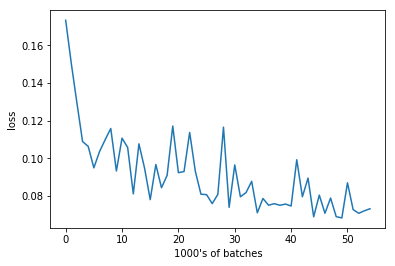

Epoch: 2, Batch: 220, Avg. Loss: 0.08858710564672947
28.273670434951782


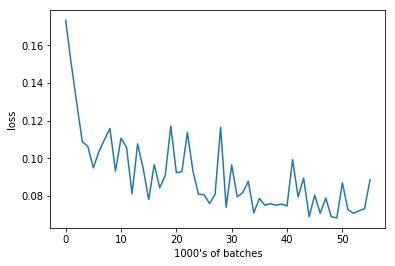

Epoch: 2, Batch: 230, Avg. Loss: 0.07237051166594029
28.949039459228516


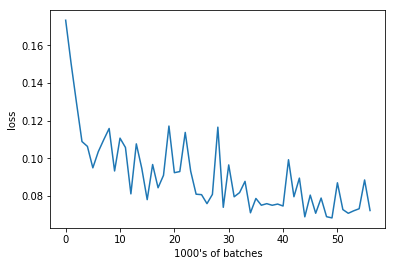

Epoch: 2, Batch: 240, Avg. Loss: 0.07108563855290413
30.32948613166809


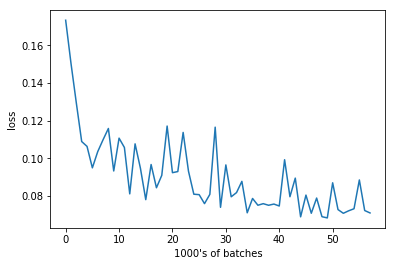

Epoch: 2, Batch: 250, Avg. Loss: 0.07279482074081897
31.8221538066864


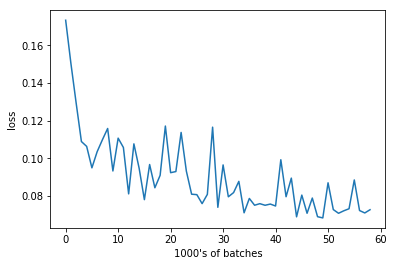

Epoch: 2, Batch: 260, Avg. Loss: 0.06745662130415439
33.47827386856079


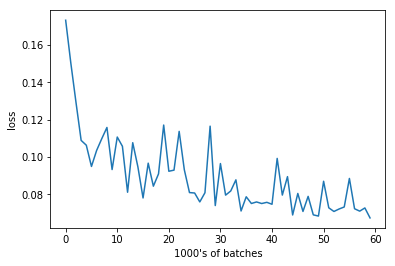

Epoch: 2, Batch: 270, Avg. Loss: 0.07459961101412774
35.717270374298096


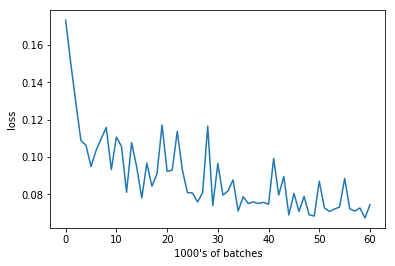

Epoch: 2, Batch: 280, Avg. Loss: 0.06826800443232059
37.68443536758423


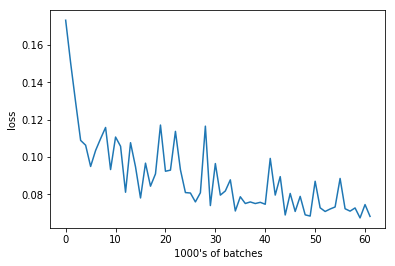

Epoch: 2, Batch: 290, Avg. Loss: 0.06727461293339729
39.154170989990234


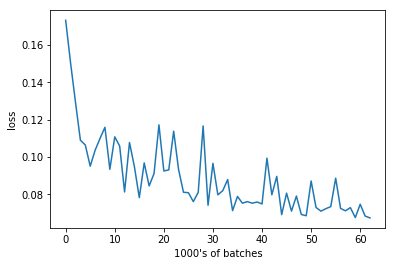

Epoch: 2, Batch: 300, Avg. Loss: 0.05873255580663681
39.85808038711548


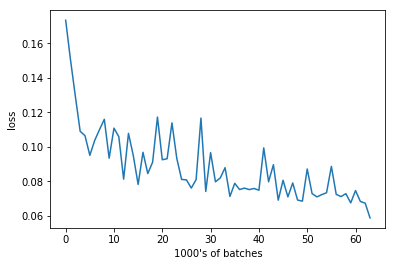

Epoch: 2, Batch: 310, Avg. Loss: 0.07316131703555584
41.13976979255676


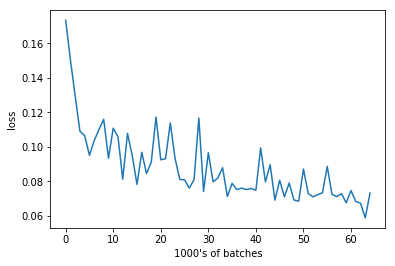

Epoch: 2, Batch: 320, Avg. Loss: 0.07692904956638813
40.78488850593567


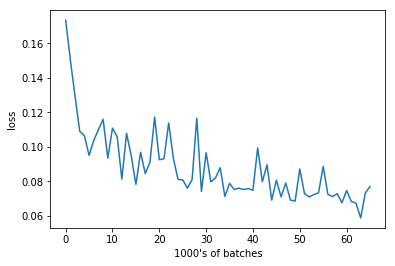

Epoch: 2, Batch: 330, Avg. Loss: 0.07673174776136875
41.838077545166016


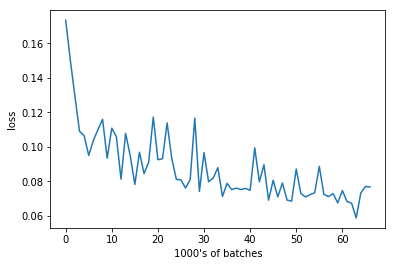

Epoch: 2, Batch: 340, Avg. Loss: 0.06678720898926258
41.947144985198975


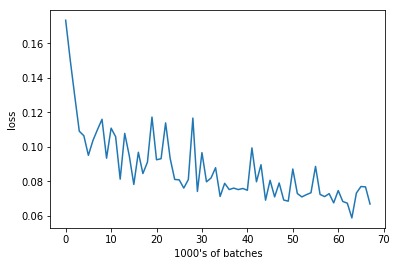

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 3, Batch: 10, Avg. Loss: 0.06271881982684135
48.66136193275452


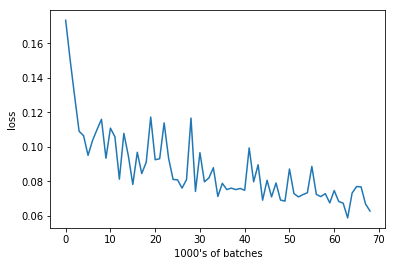

Epoch: 3, Batch: 20, Avg. Loss: 0.06599799059331417
45.70591473579407


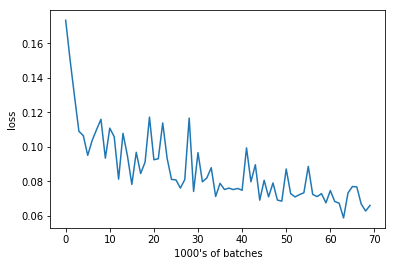

Epoch: 3, Batch: 30, Avg. Loss: 0.07597947269678115
45.196375131607056


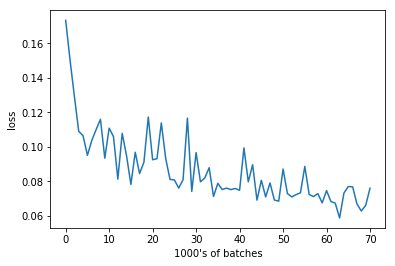

Epoch: 3, Batch: 40, Avg. Loss: 0.07821846343576908
45.47417855262756


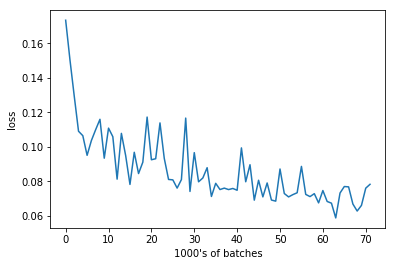

Epoch: 3, Batch: 50, Avg. Loss: 0.0694883070886135
45.47768950462341


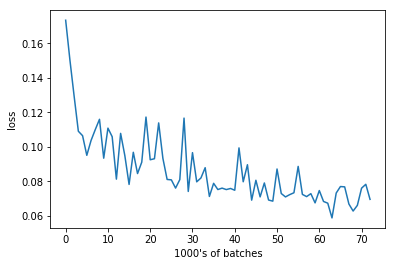

Epoch: 3, Batch: 60, Avg. Loss: 0.06687932871282101
45.34665870666504


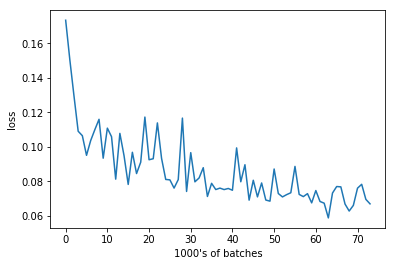

Epoch: 3, Batch: 70, Avg. Loss: 0.0810489472001791
45.02684688568115


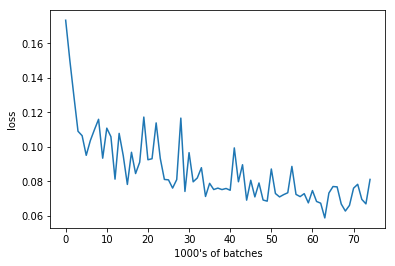

Epoch: 3, Batch: 80, Avg. Loss: 0.06498874723911285
43.64539909362793


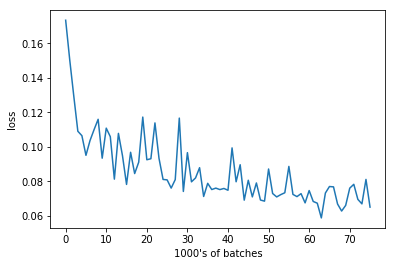

Epoch: 3, Batch: 90, Avg. Loss: 0.0775564294308424
44.6972770690918


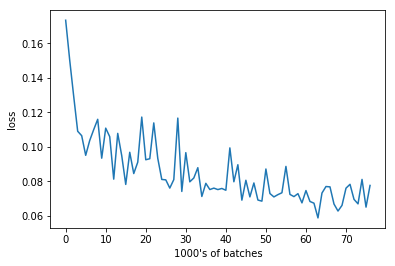

Epoch: 3, Batch: 100, Avg. Loss: 0.0721914816647768
40.67131805419922


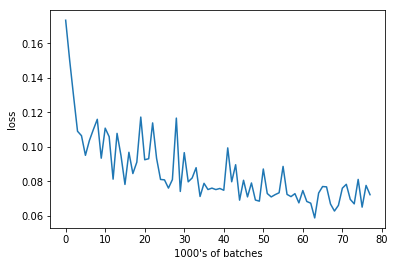

Epoch: 3, Batch: 110, Avg. Loss: 0.07066798321902752
40.18112587928772


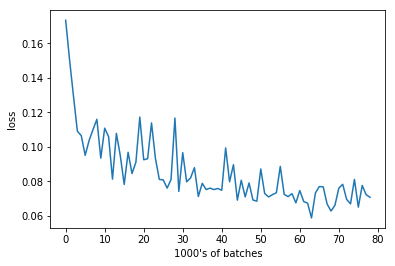

Epoch: 3, Batch: 120, Avg. Loss: 0.05139951631426811
40.11055016517639


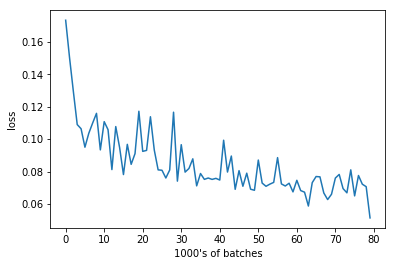

Epoch: 3, Batch: 130, Avg. Loss: 0.05389161482453346
39.77930021286011


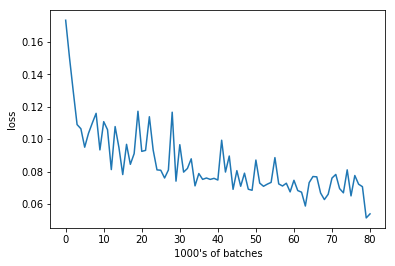

Epoch: 3, Batch: 140, Avg. Loss: 0.07735898494720458
39.60865640640259


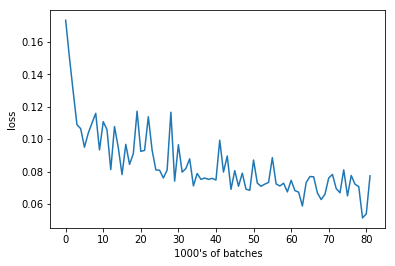

Epoch: 3, Batch: 150, Avg. Loss: 0.06374382078647614
40.415061235427856


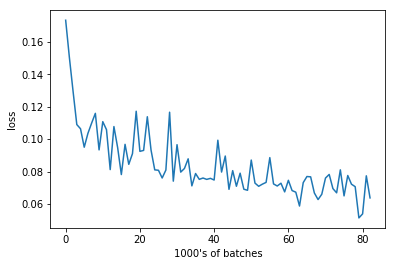

Epoch: 3, Batch: 160, Avg. Loss: 0.062246065214276315
40.09481763839722


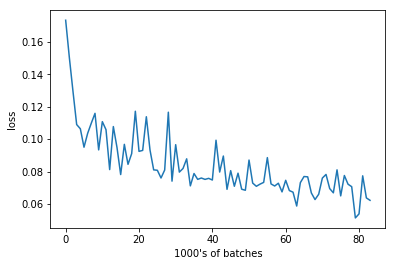

Epoch: 3, Batch: 170, Avg. Loss: 0.07623431999236345
40.29139685630798


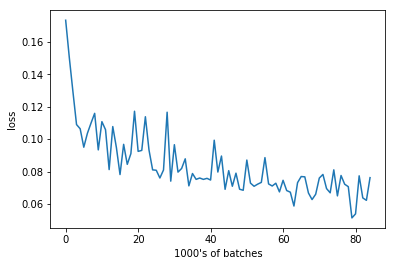

Epoch: 3, Batch: 180, Avg. Loss: 0.0883860606700182
39.92424178123474


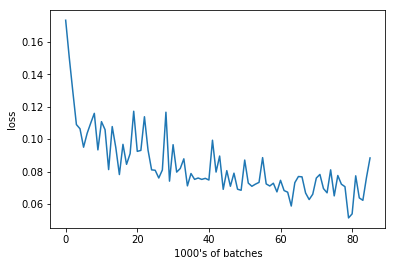

Epoch: 3, Batch: 190, Avg. Loss: 0.050644337013363835
40.1461341381073


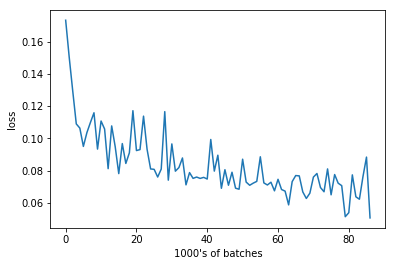

Epoch: 3, Batch: 200, Avg. Loss: 0.05746763199567795
40.1151065826416


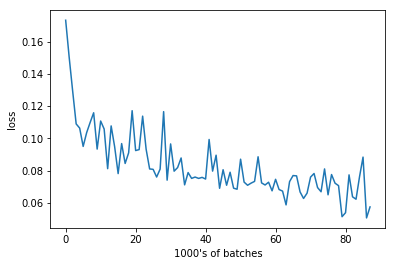

Epoch: 3, Batch: 210, Avg. Loss: 0.05434967614710331
39.45343375205994


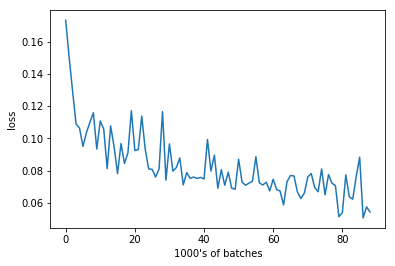

Epoch: 3, Batch: 220, Avg. Loss: 0.08306642435491085
39.70379185676575


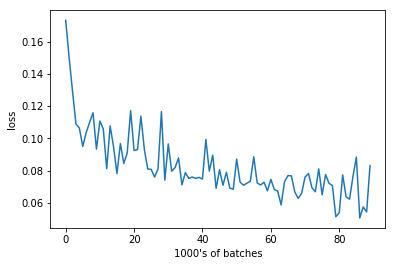

Epoch: 3, Batch: 230, Avg. Loss: 0.05973945967853069
39.71459078788757


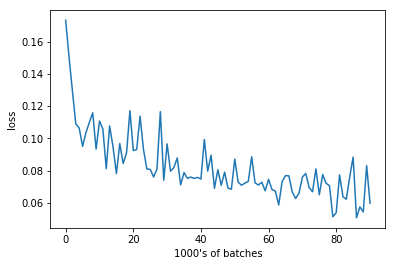

Epoch: 3, Batch: 240, Avg. Loss: 0.05934067517518997
39.75499629974365


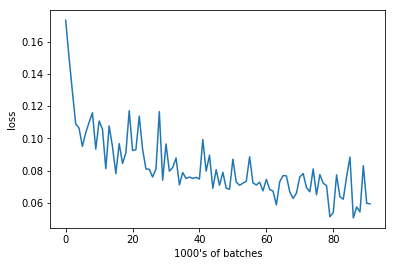

Epoch: 3, Batch: 250, Avg. Loss: 0.06453602425754071
40.210983753204346


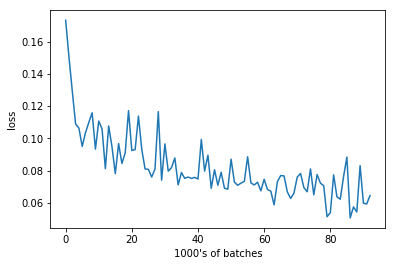

Epoch: 3, Batch: 260, Avg. Loss: 0.060491135343909264
39.680288791656494


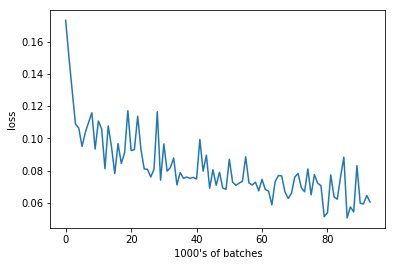

Epoch: 3, Batch: 270, Avg. Loss: 0.07579678185284137
39.87454056739807


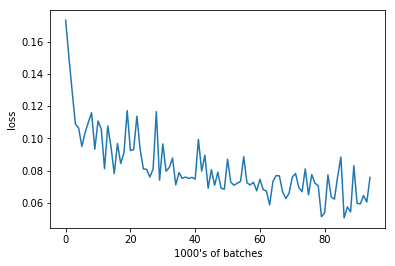

Epoch: 3, Batch: 280, Avg. Loss: 0.057016408443450926
40.314940452575684


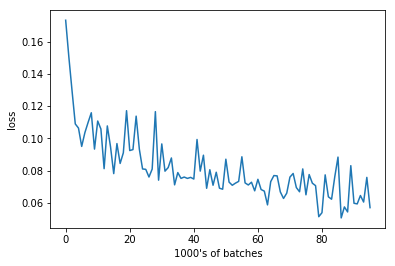

Epoch: 3, Batch: 290, Avg. Loss: 0.07593234218657016
39.80226397514343


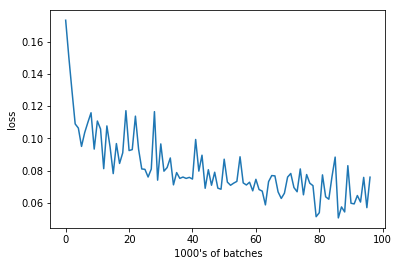

Epoch: 3, Batch: 300, Avg. Loss: 0.07223368138074875
40.09489393234253


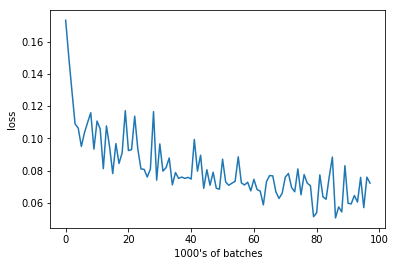

Epoch: 3, Batch: 310, Avg. Loss: 0.0556431170552969
40.30335807800293


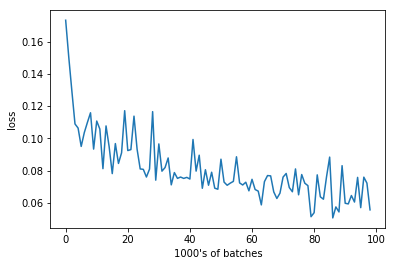

Epoch: 3, Batch: 320, Avg. Loss: 0.05885394997894764
39.74035906791687


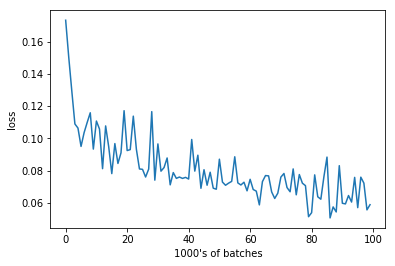

Epoch: 3, Batch: 330, Avg. Loss: 0.09640404209494591
39.69420766830444


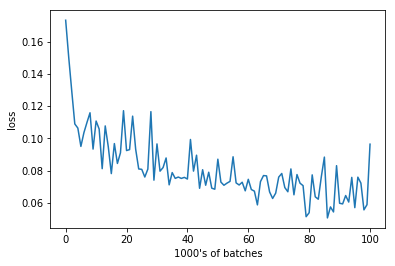

Epoch: 3, Batch: 340, Avg. Loss: 0.07063903585076332
39.7043240070343


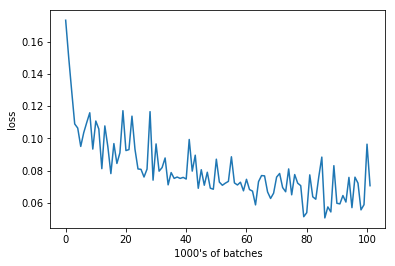

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 4, Batch: 10, Avg. Loss: 0.0632563728839159
45.13258647918701


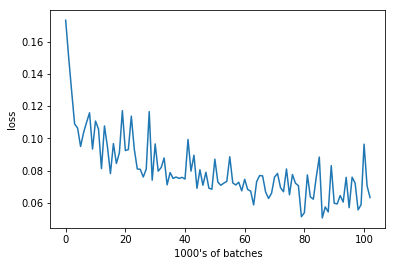

Epoch: 4, Batch: 20, Avg. Loss: 0.061515647917985916
40.87236046791077


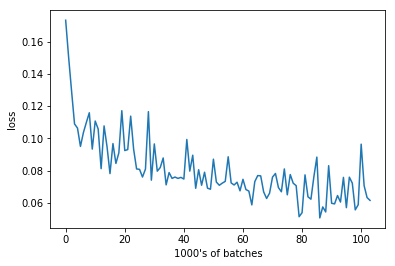

Epoch: 4, Batch: 30, Avg. Loss: 0.06052911207079888
40.713414669036865


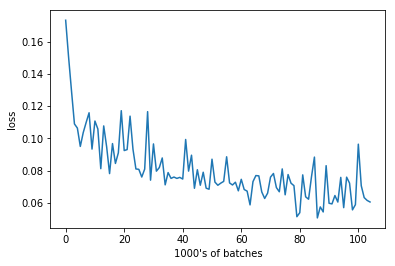

Epoch: 4, Batch: 40, Avg. Loss: 0.062368647940456864
39.85575079917908


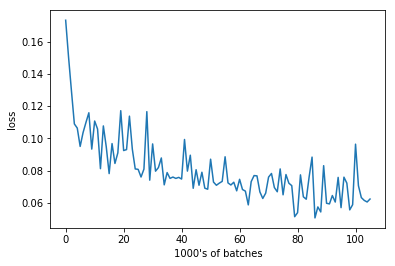

Epoch: 4, Batch: 50, Avg. Loss: 0.06258266158401966
40.85986280441284


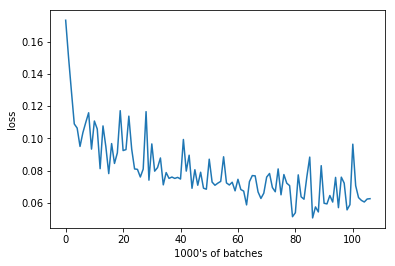

Epoch: 4, Batch: 60, Avg. Loss: 0.07988464646041393
40.583128213882446


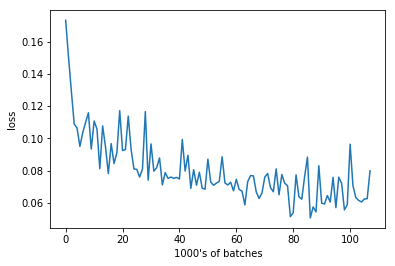

Epoch: 4, Batch: 70, Avg. Loss: 0.0673414096236229
40.52929449081421


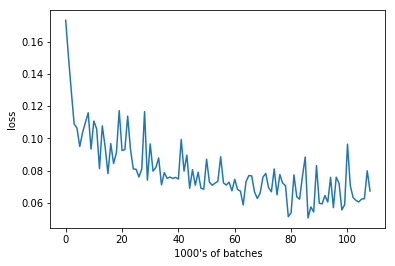

Epoch: 4, Batch: 80, Avg. Loss: 0.07243314981460572
40.40583562850952


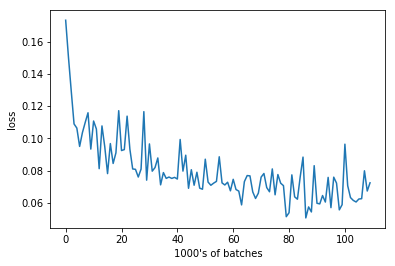

Epoch: 4, Batch: 90, Avg. Loss: 0.05710138119757176
40.44857573509216


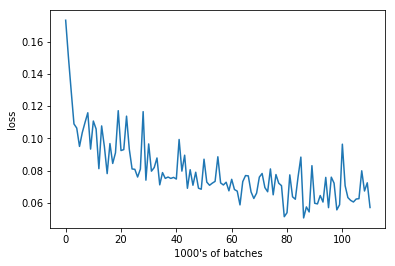

Epoch: 4, Batch: 100, Avg. Loss: 0.054021469317376614
40.62042570114136


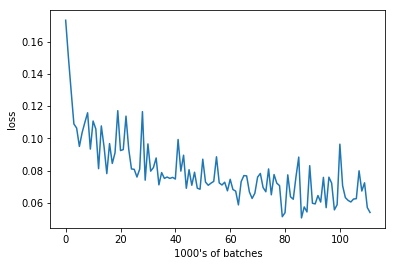

Epoch: 4, Batch: 110, Avg. Loss: 0.05017607733607292
40.57494378089905


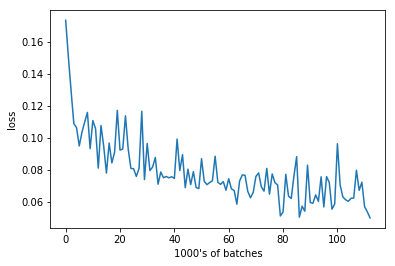

Epoch: 4, Batch: 120, Avg. Loss: 0.06462792195379734
40.77385354042053


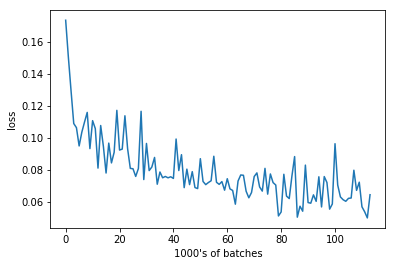

Epoch: 4, Batch: 130, Avg. Loss: 0.04987080208957195
40.29481554031372


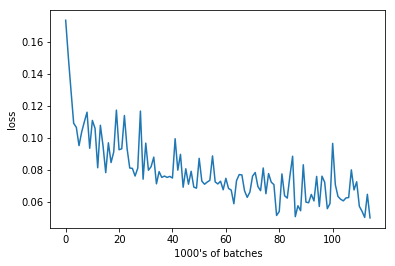

Epoch: 4, Batch: 140, Avg. Loss: 0.06852238848805428
40.99103307723999


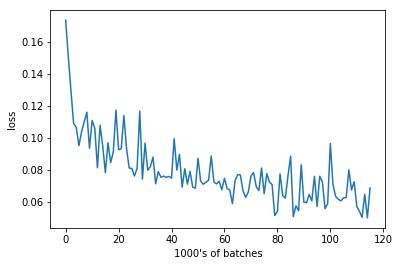

Epoch: 4, Batch: 150, Avg. Loss: 0.04500878807157278
40.92602896690369


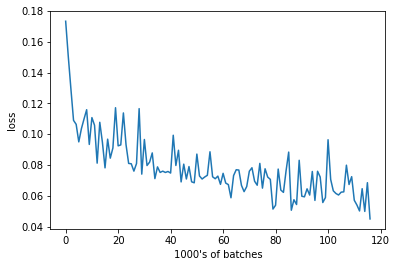

Epoch: 4, Batch: 160, Avg. Loss: 0.05079672746360302
40.56270217895508


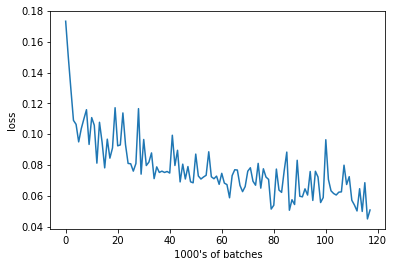

Epoch: 4, Batch: 170, Avg. Loss: 0.05967091768980026
40.27436327934265


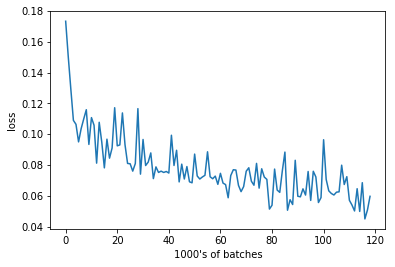

Epoch: 4, Batch: 180, Avg. Loss: 0.05871705114841461
40.25871419906616


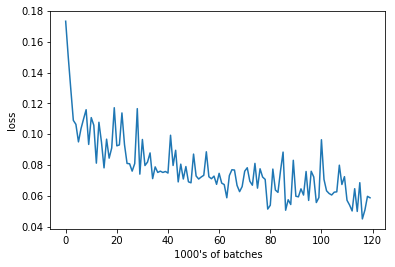

Epoch: 4, Batch: 190, Avg. Loss: 0.04883018638938665
40.447558879852295


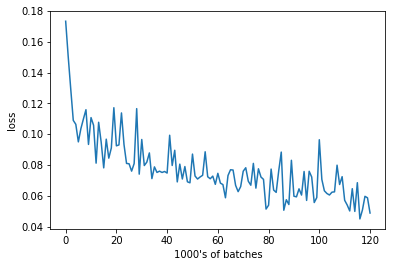

Epoch: 4, Batch: 200, Avg. Loss: 0.06148837804794312
40.98766326904297


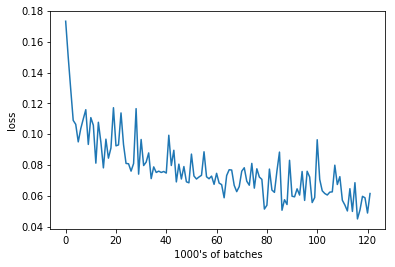

Epoch: 4, Batch: 210, Avg. Loss: 0.04385225512087345
40.24991464614868


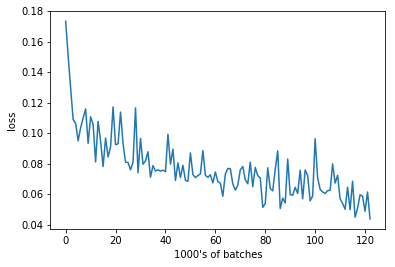

Epoch: 4, Batch: 220, Avg. Loss: 0.055012442916631696
40.07726812362671


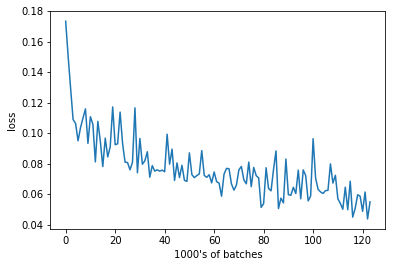

Epoch: 4, Batch: 230, Avg. Loss: 0.06015697903931141
40.492833614349365


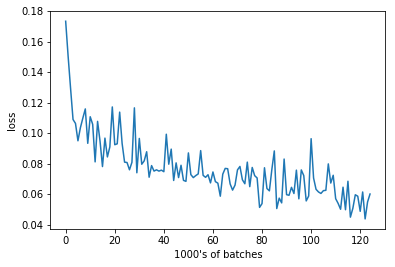

Epoch: 4, Batch: 240, Avg. Loss: 0.06069317907094955
41.109949588775635


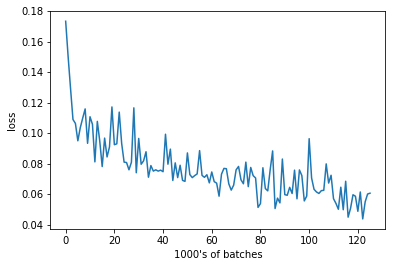

Epoch: 4, Batch: 250, Avg. Loss: 0.06413757614791393
40.57442617416382


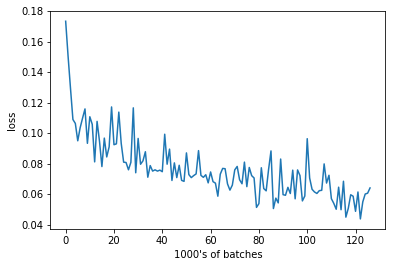

Epoch: 4, Batch: 260, Avg. Loss: 0.06885977610945701
40.18324518203735


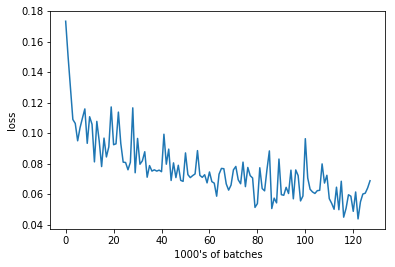

Epoch: 4, Batch: 270, Avg. Loss: 0.0625605160370469
40.11426043510437


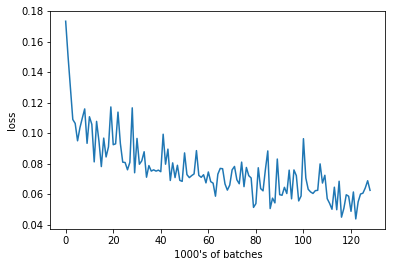

Epoch: 4, Batch: 280, Avg. Loss: 0.05380927696824074
40.26540684700012


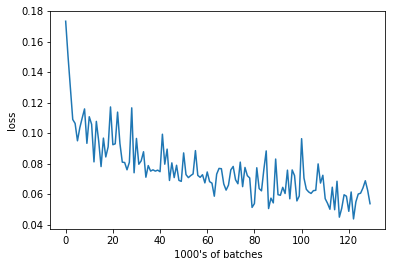

Epoch: 4, Batch: 290, Avg. Loss: 0.07003024443984032
40.49681806564331


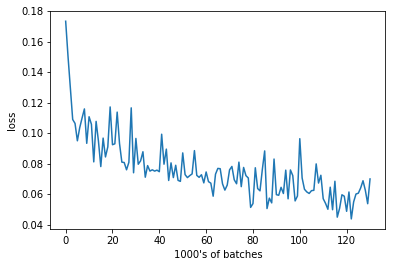

Epoch: 4, Batch: 300, Avg. Loss: 0.06179199293255806
40.14788222312927


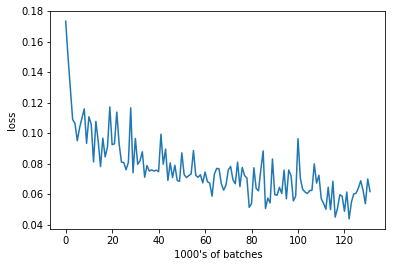

Epoch: 4, Batch: 310, Avg. Loss: 0.06876796167343854
40.20045471191406


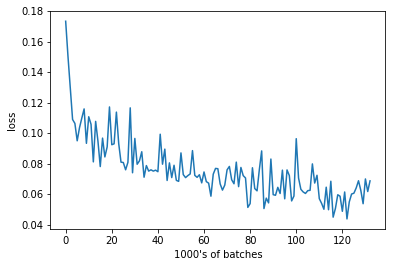

Epoch: 4, Batch: 320, Avg. Loss: 0.05333680640906095
40.97280526161194


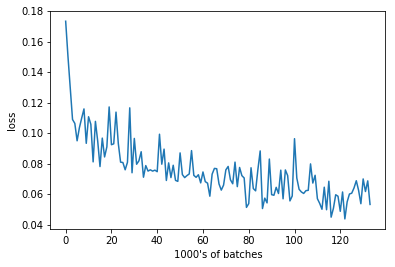

Epoch: 4, Batch: 330, Avg. Loss: 0.05104709211736917
40.60621500015259


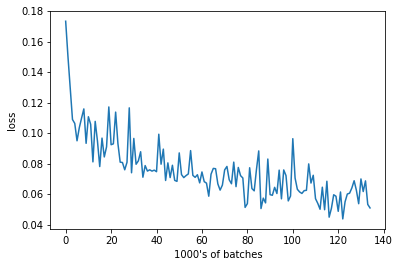

Epoch: 4, Batch: 340, Avg. Loss: 0.0681469351053238
40.707048416137695


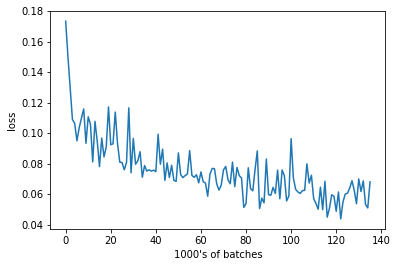

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 5, Batch: 10, Avg. Loss: 0.05256482418626547
46.9814190864563


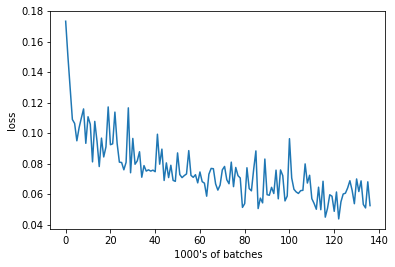

Epoch: 5, Batch: 20, Avg. Loss: 0.05497242771089077
41.42092418670654


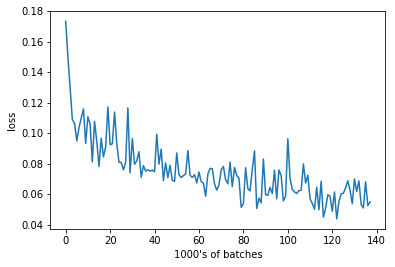

Epoch: 5, Batch: 30, Avg. Loss: 0.052393623255193235
41.411065101623535


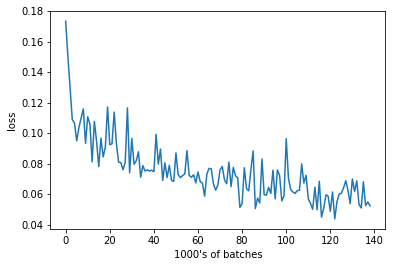

Epoch: 5, Batch: 40, Avg. Loss: 0.051960567757487294
40.97633194923401


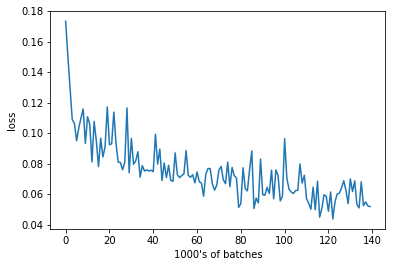

Epoch: 5, Batch: 50, Avg. Loss: 0.04879123065620661
40.531057357788086


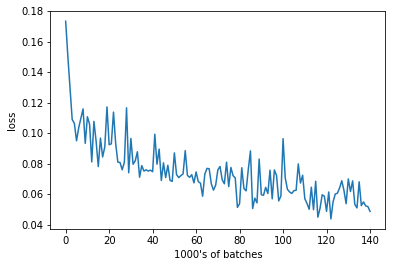

Epoch: 5, Batch: 60, Avg. Loss: 0.045914644934237005
40.60769748687744


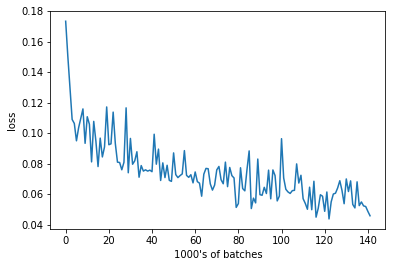

Epoch: 5, Batch: 70, Avg. Loss: 0.06201214902102947
42.23540902137756


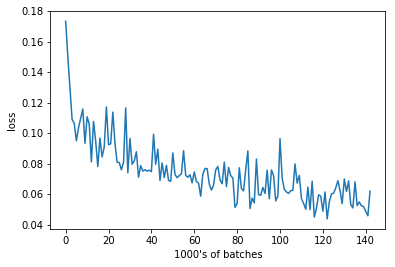

Epoch: 5, Batch: 80, Avg. Loss: 0.04710886981338262
43.970279693603516


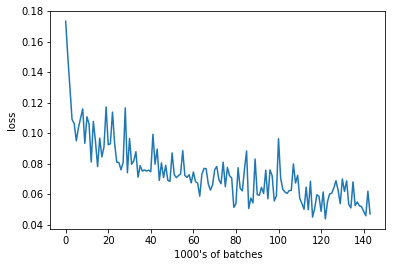

Epoch: 5, Batch: 90, Avg. Loss: 0.04410514365881681
55.669660568237305


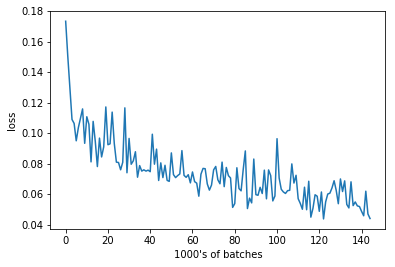

Epoch: 5, Batch: 100, Avg. Loss: 0.04528563357889652
42.965086936950684


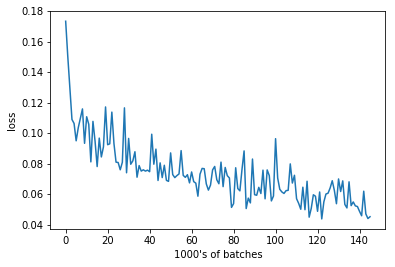

Epoch: 5, Batch: 110, Avg. Loss: 0.04653002861887216
43.14667868614197


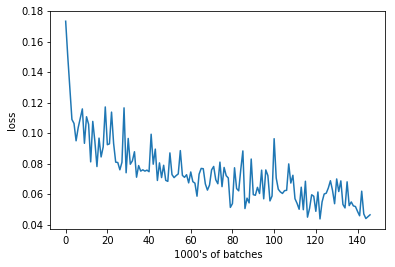

Epoch: 5, Batch: 120, Avg. Loss: 0.05413958076387644
42.76123547554016


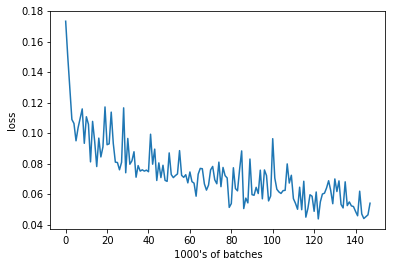

Epoch: 5, Batch: 130, Avg. Loss: 0.052720226161181924
43.357643604278564


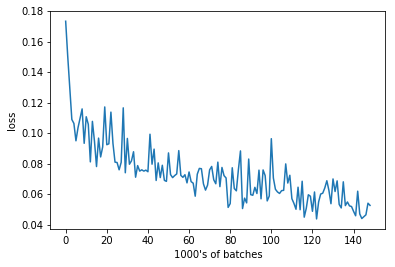

Epoch: 5, Batch: 140, Avg. Loss: 0.06095511391758919
41.581751346588135


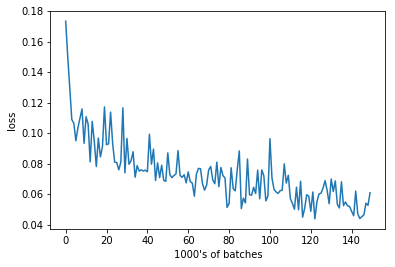

Epoch: 5, Batch: 150, Avg. Loss: 0.050636843964457515
40.80694556236267


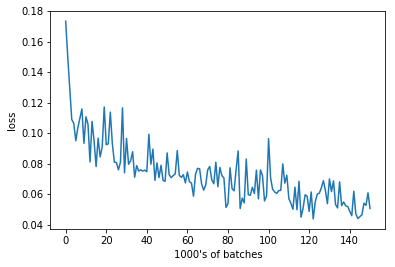

Epoch: 5, Batch: 160, Avg. Loss: 0.05089468751102686
40.59149193763733


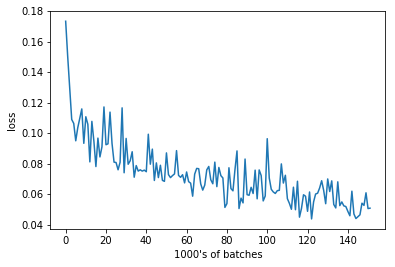

Epoch: 5, Batch: 170, Avg. Loss: 0.03941850606352091
40.867862701416016


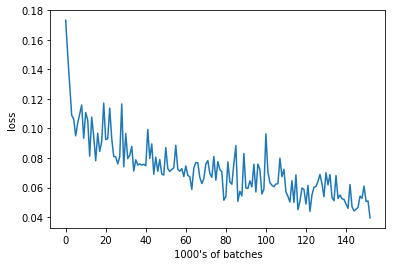

Epoch: 5, Batch: 180, Avg. Loss: 0.05561799872666597
41.25918126106262


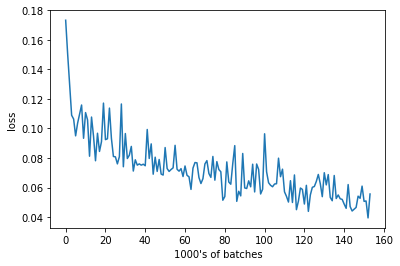

Epoch: 5, Batch: 190, Avg. Loss: 0.048000830411911014
40.70490789413452


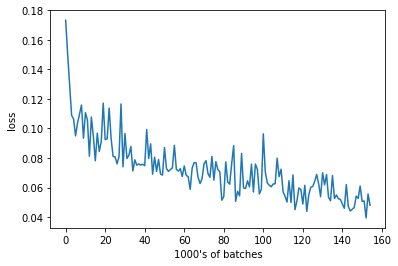

Epoch: 5, Batch: 200, Avg. Loss: 0.05010914225131273
40.9930944442749


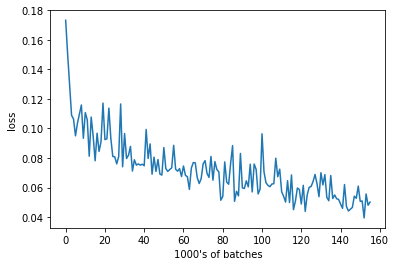

Epoch: 5, Batch: 210, Avg. Loss: 0.05199856422841549
40.69423985481262


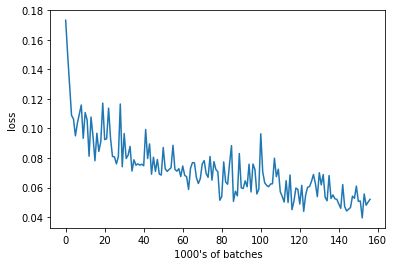

Epoch: 5, Batch: 220, Avg. Loss: 0.04868406616151333
40.811768770217896


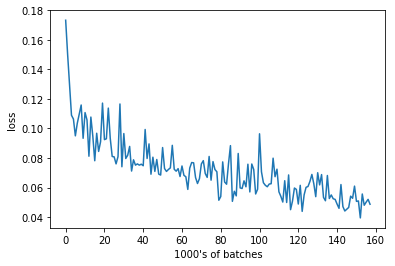

Epoch: 5, Batch: 230, Avg. Loss: 0.06657498050481081
41.2939829826355


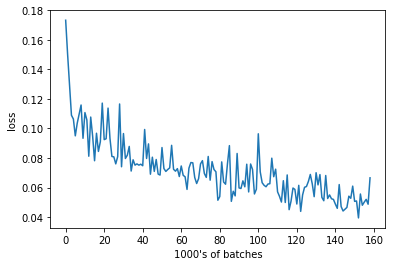

Epoch: 5, Batch: 240, Avg. Loss: 0.047499934770166875
40.622796297073364


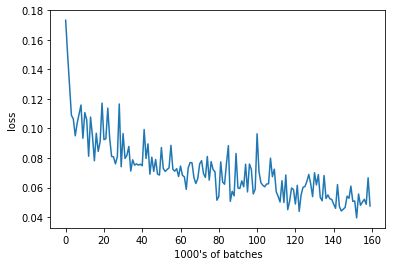

Epoch: 5, Batch: 250, Avg. Loss: 0.04805444274097681
40.63235521316528


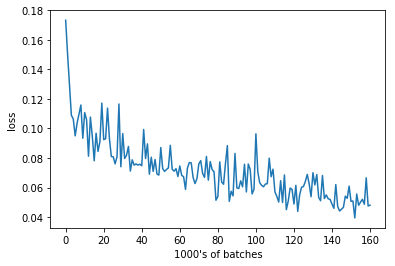

Epoch: 5, Batch: 260, Avg. Loss: 0.06296712756156922
40.63405418395996


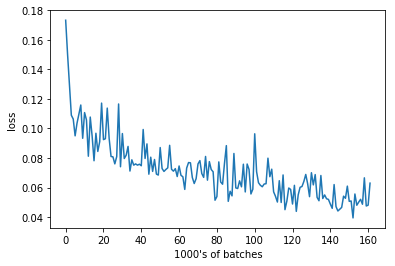

Epoch: 5, Batch: 270, Avg. Loss: 0.04206886552274227
40.78472971916199


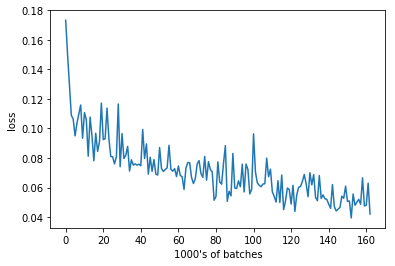

Epoch: 5, Batch: 280, Avg. Loss: 0.05232817362993956
41.60232424736023


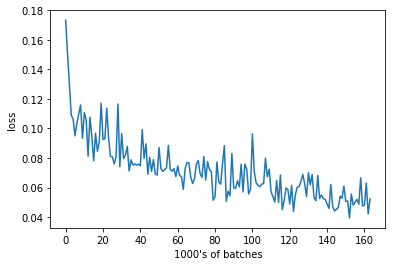

Epoch: 5, Batch: 290, Avg. Loss: 0.04927296172827482
40.686532974243164


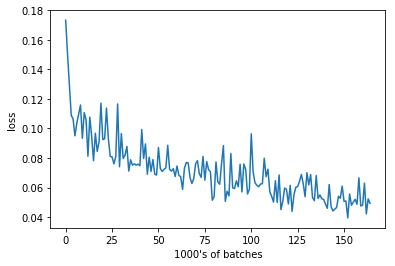

Epoch: 5, Batch: 300, Avg. Loss: 0.052582496963441375
40.79158663749695


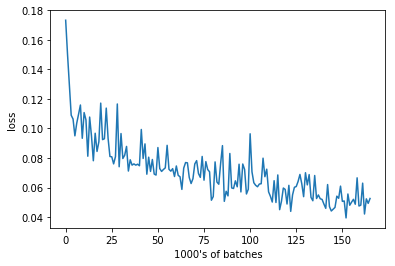

Epoch: 5, Batch: 310, Avg. Loss: 0.07215805724263191
41.08769083023071


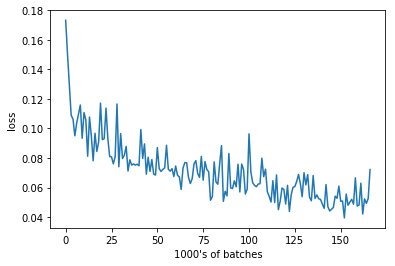

Epoch: 5, Batch: 320, Avg. Loss: 0.03816830776631832
41.36153268814087


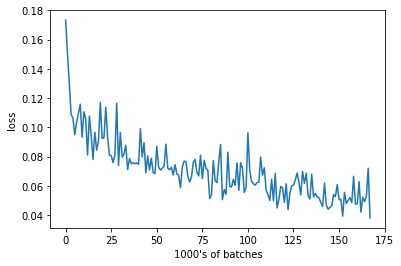

Epoch: 5, Batch: 330, Avg. Loss: 0.05795119255781174
41.38581848144531


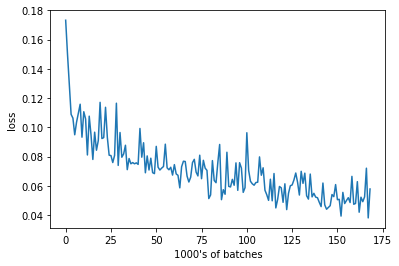

Epoch: 5, Batch: 340, Avg. Loss: 0.047857557982206346
40.51470947265625


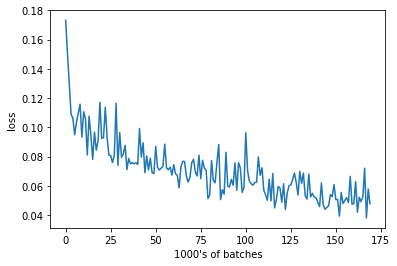

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 6, Batch: 10, Avg. Loss: 0.03776036966592074
46.10143566131592


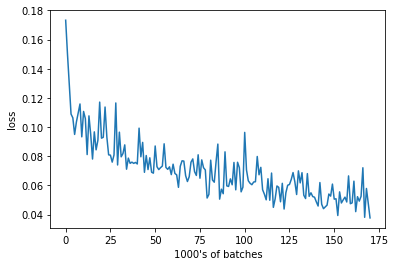

Epoch: 6, Batch: 20, Avg. Loss: 0.04374791570007801
41.06070828437805


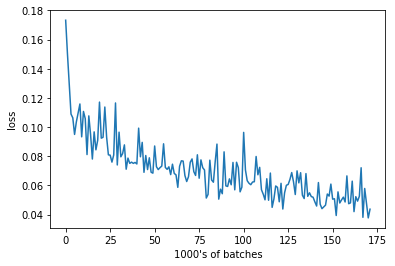

Epoch: 6, Batch: 30, Avg. Loss: 0.04583440721035004
42.4267737865448


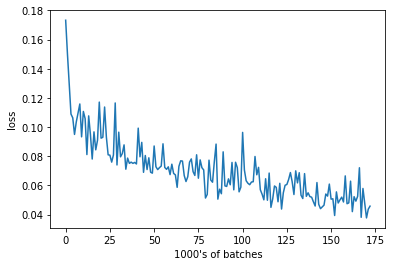

Epoch: 6, Batch: 40, Avg. Loss: 0.03565507847815752
41.17976951599121


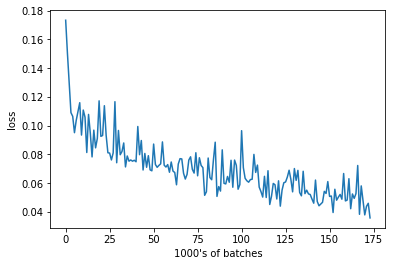

Epoch: 6, Batch: 50, Avg. Loss: 0.050278425216674805
41.00024890899658


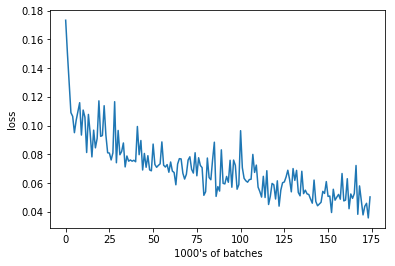

Epoch: 6, Batch: 60, Avg. Loss: 0.04303673692047596
40.89186191558838


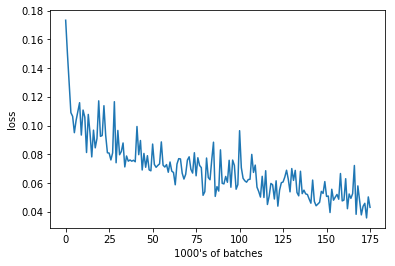

Epoch: 6, Batch: 70, Avg. Loss: 0.04757512956857681
40.85664486885071


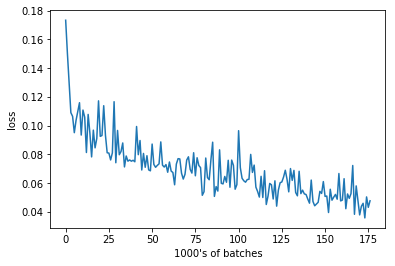

Epoch: 6, Batch: 80, Avg. Loss: 0.04534439258277416
42.00892376899719


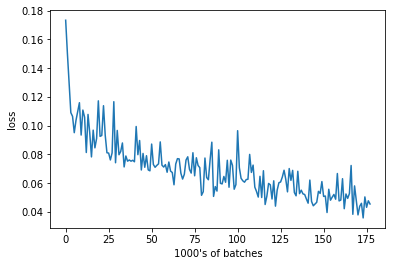

Epoch: 6, Batch: 90, Avg. Loss: 0.07994634695351124
40.412692070007324


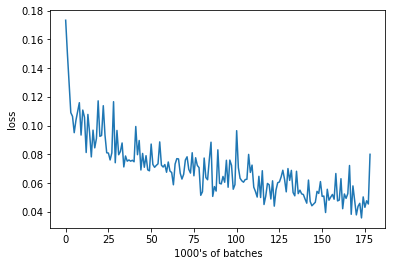

Epoch: 6, Batch: 100, Avg. Loss: 0.05931306444108486
40.99109625816345


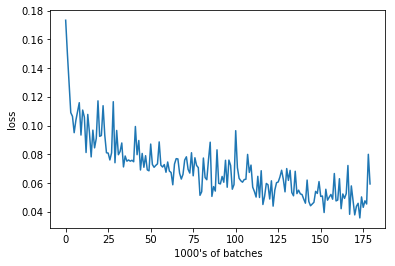

Epoch: 6, Batch: 110, Avg. Loss: 0.044821974262595175
40.820927143096924


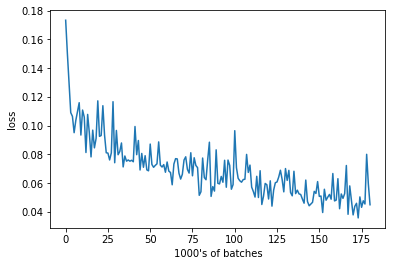

Epoch: 6, Batch: 120, Avg. Loss: 0.034224691614508626
40.6238956451416


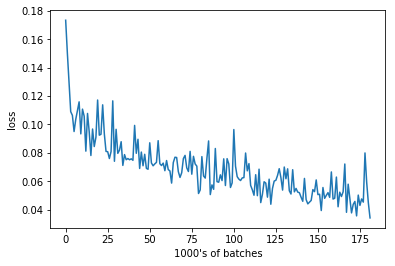

Epoch: 6, Batch: 130, Avg. Loss: 0.048761256597936155
41.35822916030884


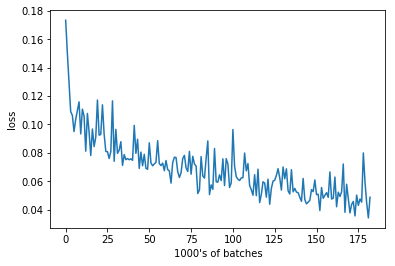

Epoch: 6, Batch: 140, Avg. Loss: 0.044895582273602484
40.96502208709717


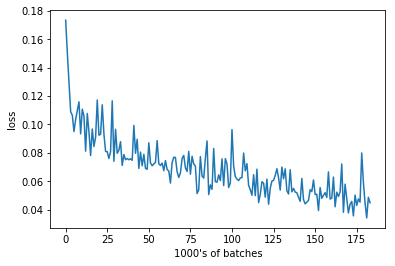

Epoch: 6, Batch: 150, Avg. Loss: 0.03834579158574343
41.10436677932739


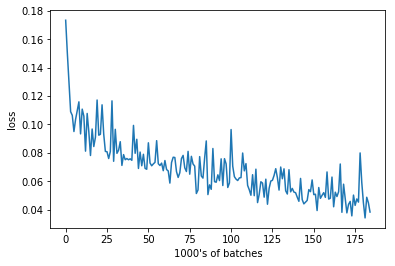

Epoch: 6, Batch: 160, Avg. Loss: 0.033478525839746
40.7171196937561


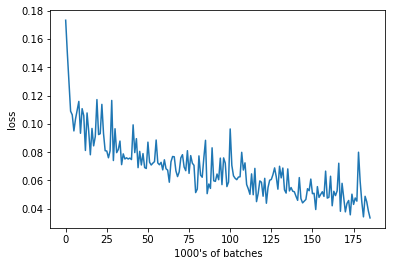

Epoch: 6, Batch: 170, Avg. Loss: 0.06434664148837328
40.83337140083313


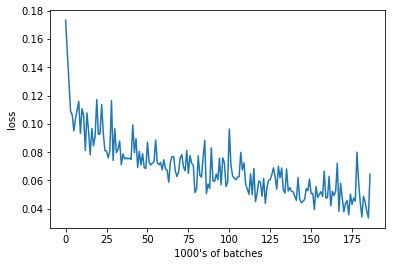

Epoch: 6, Batch: 180, Avg. Loss: 0.0504028208553791
41.84307098388672


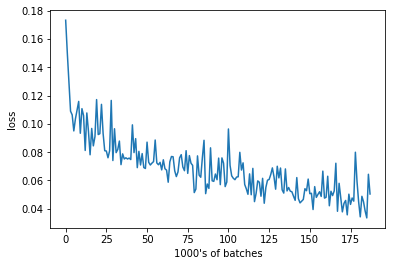

Epoch: 6, Batch: 190, Avg. Loss: 0.04233896620571613
41.1792676448822


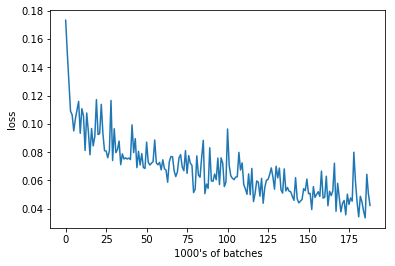

Epoch: 6, Batch: 200, Avg. Loss: 0.04309576041996479
41.5655562877655


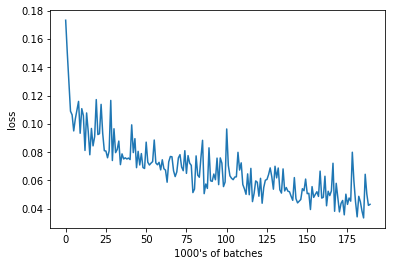

Epoch: 6, Batch: 210, Avg. Loss: 0.060091966018080714
40.71493864059448


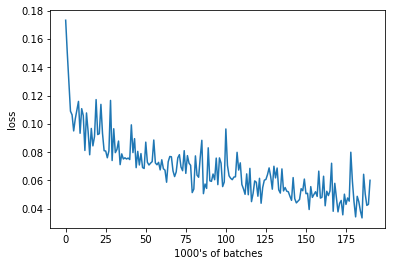

Epoch: 6, Batch: 220, Avg. Loss: 0.04533271566033363
41.02312612533569


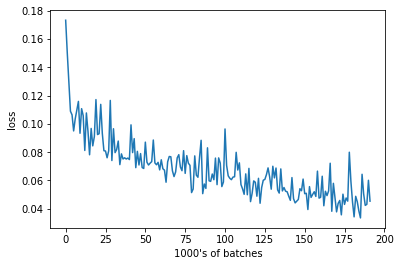

Epoch: 6, Batch: 230, Avg. Loss: 0.04034398328512907
41.91609787940979


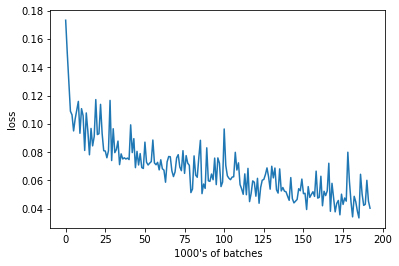

Epoch: 6, Batch: 240, Avg. Loss: 0.037803358398377895
41.152875661849976


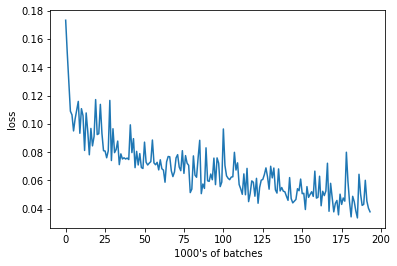

Epoch: 6, Batch: 250, Avg. Loss: 0.07169173769652844
40.663864850997925


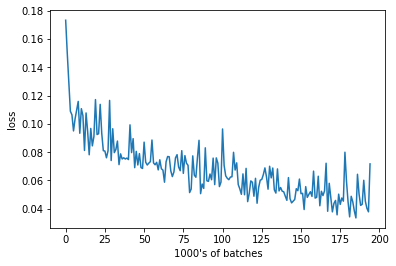

Epoch: 6, Batch: 260, Avg. Loss: 0.036000467091798785
40.8737587928772


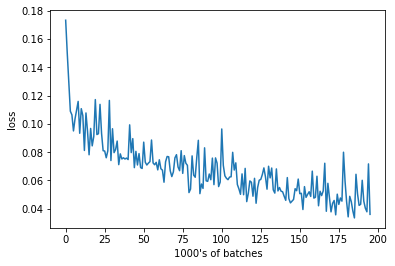

Epoch: 6, Batch: 270, Avg. Loss: 0.07067393250763417
41.345770835876465


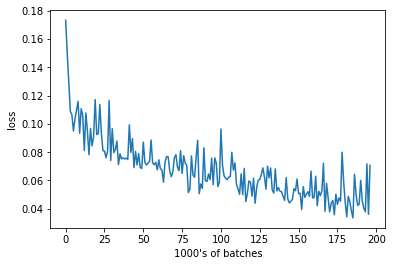

Epoch: 6, Batch: 280, Avg. Loss: 0.06125356871634722
40.79670977592468


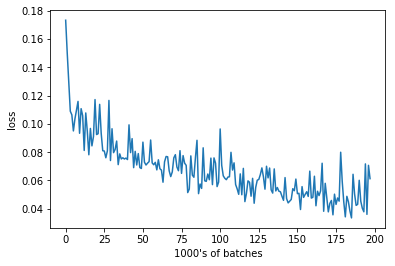

Epoch: 6, Batch: 290, Avg. Loss: 0.037422379851341246
41.00333333015442


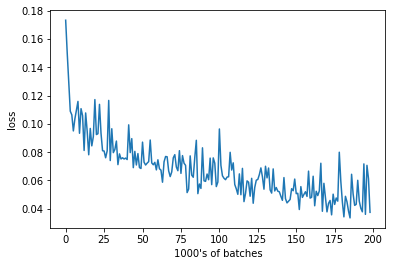

Epoch: 6, Batch: 300, Avg. Loss: 0.042354497127234936
41.083836793899536


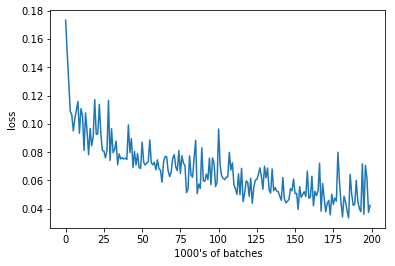

Epoch: 6, Batch: 310, Avg. Loss: 0.05596951656043529
41.14652872085571


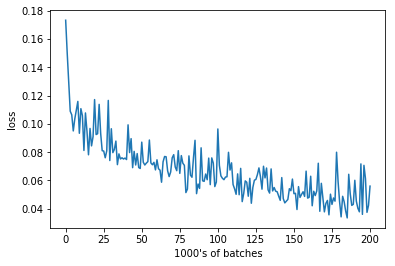

Epoch: 6, Batch: 320, Avg. Loss: 0.03885745275765658
41.752740144729614


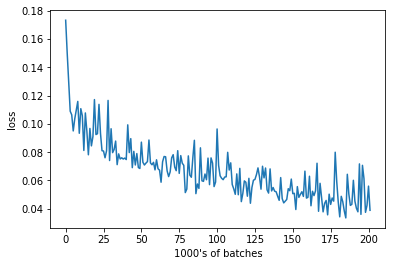

Epoch: 6, Batch: 330, Avg. Loss: 0.05050891172140837
41.0176899433136


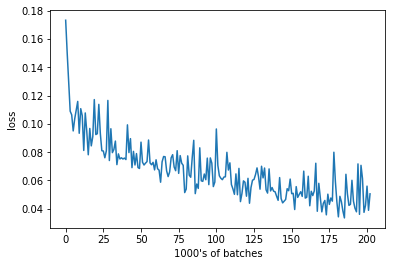

Epoch: 6, Batch: 340, Avg. Loss: 0.03459168523550034
40.542216539382935


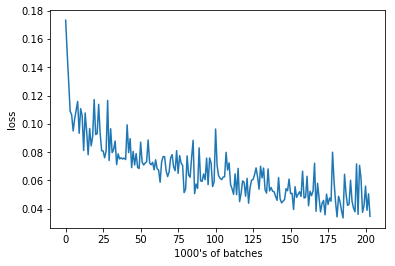

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 7, Batch: 10, Avg. Loss: 0.04351418856531382
45.71123147010803


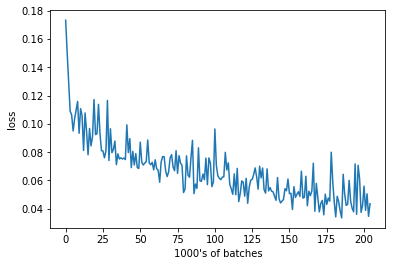

Epoch: 7, Batch: 20, Avg. Loss: 0.05272795222699642
41.61658954620361


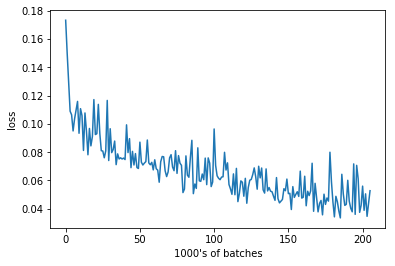

Epoch: 7, Batch: 30, Avg. Loss: 0.03757878113538027
42.54145359992981


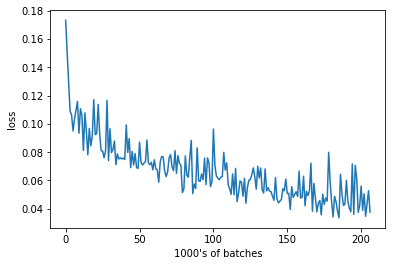

Epoch: 7, Batch: 40, Avg. Loss: 0.04139015562832356
40.73972702026367


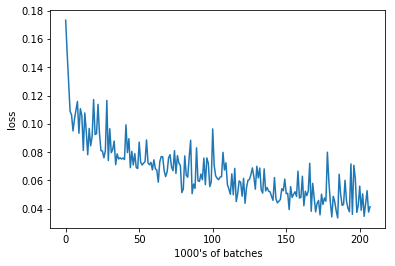

Epoch: 7, Batch: 50, Avg. Loss: 0.0429883573204279
40.66187596321106


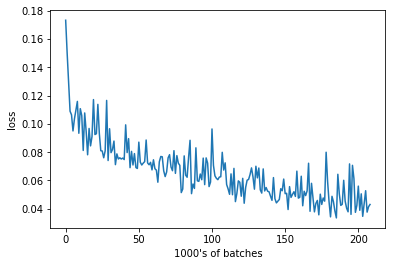

Epoch: 7, Batch: 60, Avg. Loss: 0.04020631518214941
42.24100971221924


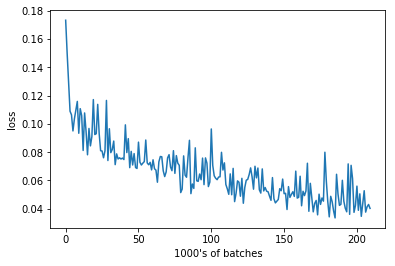

Epoch: 7, Batch: 70, Avg. Loss: 0.05426879692822695
41.43773818016052


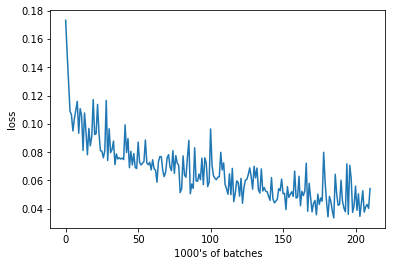

Epoch: 7, Batch: 80, Avg. Loss: 0.04373870454728603
40.81999230384827


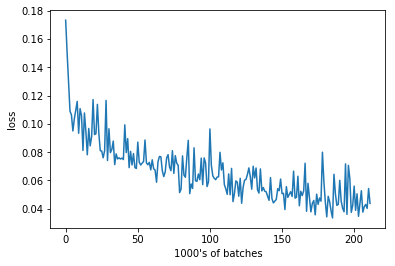

Epoch: 7, Batch: 90, Avg. Loss: 0.04326643068343401
41.030349016189575


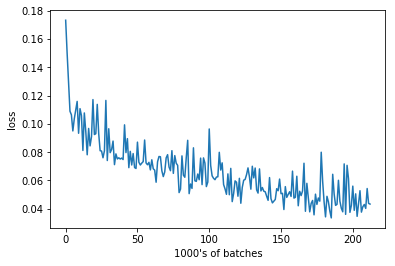

Epoch: 7, Batch: 100, Avg. Loss: 0.05666936244815588
40.60426211357117


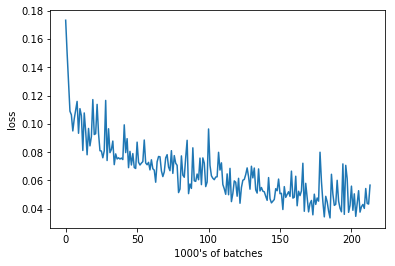

Epoch: 7, Batch: 110, Avg. Loss: 0.03816638626158238
40.845664739608765


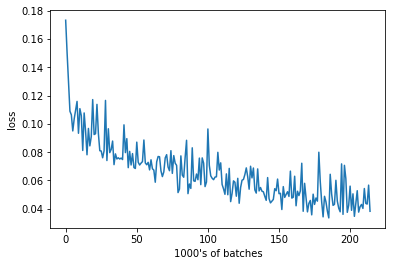

Epoch: 7, Batch: 120, Avg. Loss: 0.05639189518988132
41.51336693763733


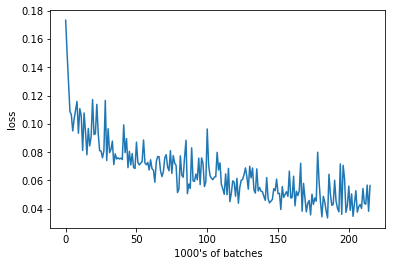

Epoch: 7, Batch: 130, Avg. Loss: 0.04795529898256064
40.83491587638855


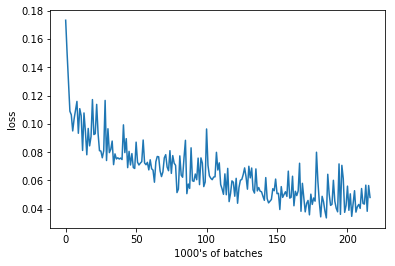

Epoch: 7, Batch: 140, Avg. Loss: 0.03448582710698247
41.053983211517334


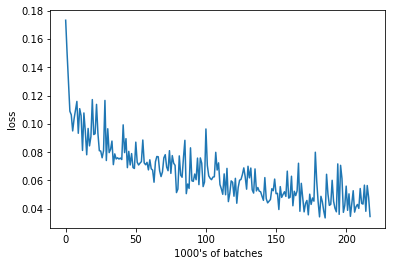

Epoch: 7, Batch: 150, Avg. Loss: 0.0432489201426506
40.77916765213013


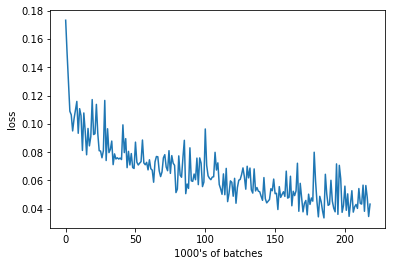

Epoch: 7, Batch: 160, Avg. Loss: 0.05580006018280983
40.77441382408142


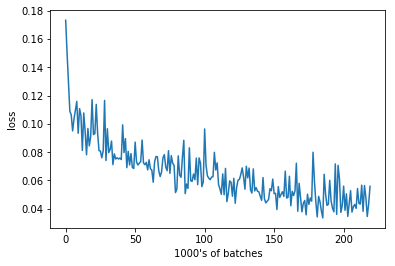

Epoch: 7, Batch: 170, Avg. Loss: 0.03894440438598394
40.997644662857056


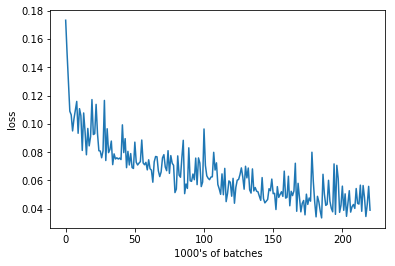

Epoch: 7, Batch: 180, Avg. Loss: 0.04647899717092514
40.65493559837341


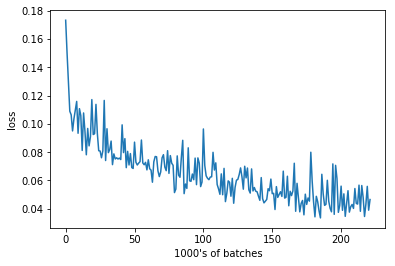

Epoch: 7, Batch: 190, Avg. Loss: 0.044356814958155154
40.43536639213562


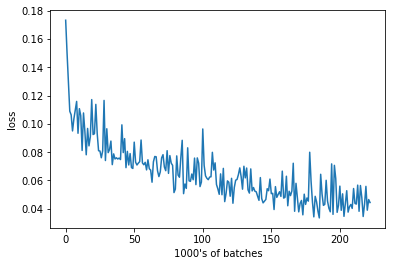

Epoch: 7, Batch: 200, Avg. Loss: 0.060764916613698004
41.20600152015686


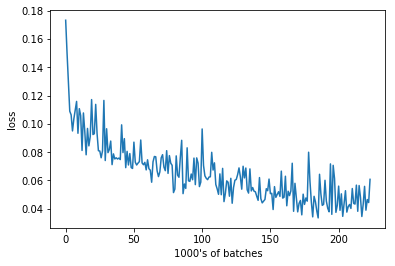

Epoch: 7, Batch: 210, Avg. Loss: 0.0405679177492857
40.714781761169434


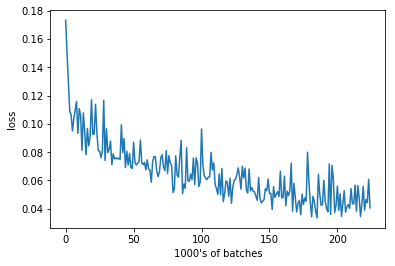

Epoch: 7, Batch: 220, Avg. Loss: 0.03201679065823555
41.8162796497345


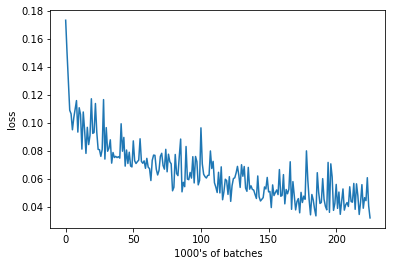

Epoch: 7, Batch: 230, Avg. Loss: 0.037068009935319425
40.555177450180054


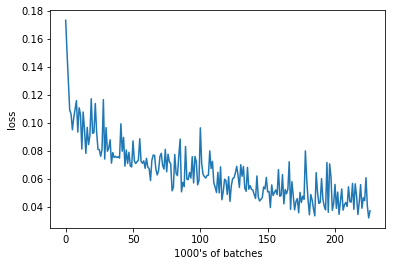

Epoch: 7, Batch: 240, Avg. Loss: 0.0403736874461174
40.54381060600281


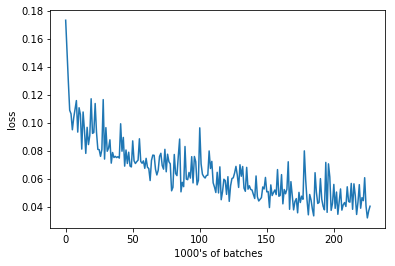

Epoch: 7, Batch: 250, Avg. Loss: 0.051198269799351694
40.769229888916016


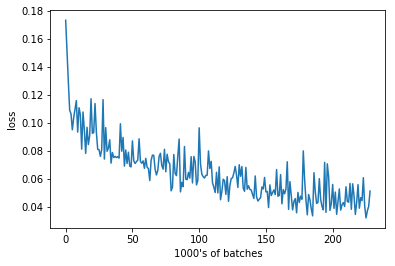

Epoch: 7, Batch: 260, Avg. Loss: 0.03388691861182451
40.84844970703125


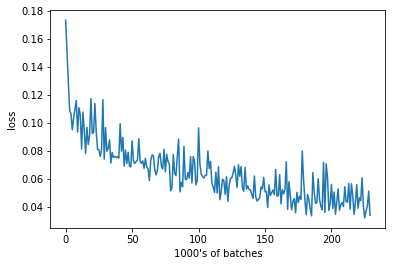

Epoch: 7, Batch: 270, Avg. Loss: 0.038534195721149446
41.435468673706055


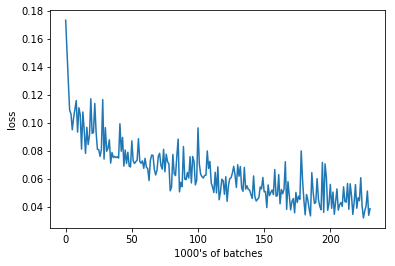

Epoch: 7, Batch: 280, Avg. Loss: 0.0452696930617094
40.549681425094604


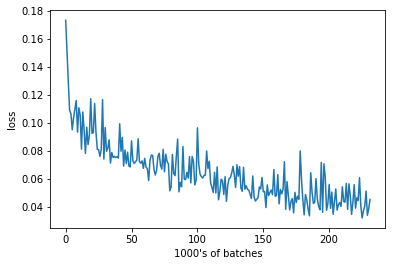

Epoch: 7, Batch: 290, Avg. Loss: 0.04667942747473717
40.97119879722595


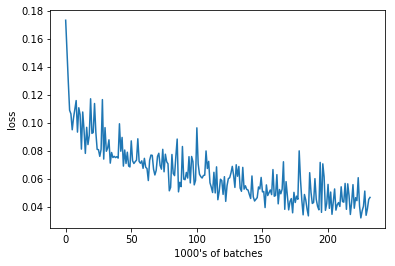

Epoch: 7, Batch: 300, Avg. Loss: 0.04219439625740051
40.68160629272461


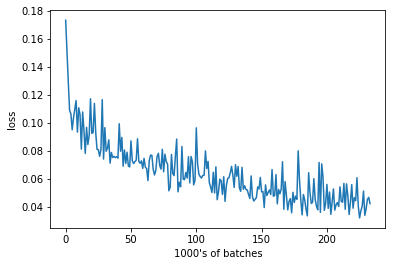

Epoch: 7, Batch: 310, Avg. Loss: 0.03179415538907051
40.48651719093323


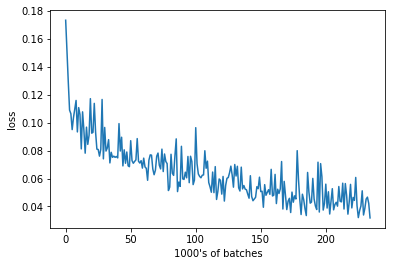

Epoch: 7, Batch: 320, Avg. Loss: 0.039170397259294984
41.77870750427246


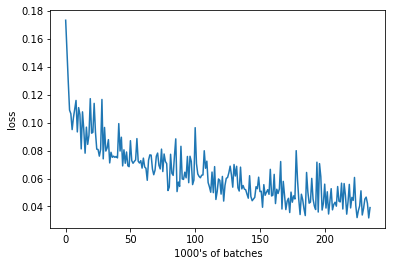

Epoch: 7, Batch: 330, Avg. Loss: 0.04318195227533579
40.43421792984009


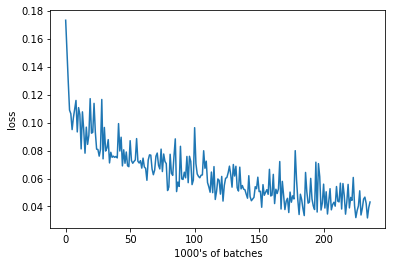

Epoch: 7, Batch: 340, Avg. Loss: 0.042365075834095475
41.23259449005127


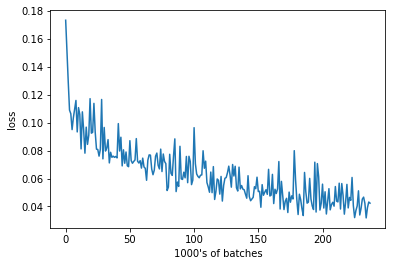

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 8, Batch: 10, Avg. Loss: 0.03221929632127285
47.178972005844116


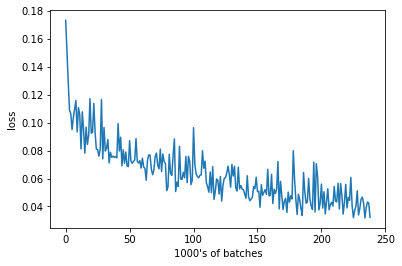

Epoch: 8, Batch: 20, Avg. Loss: 0.04215834233909845
42.0115852355957


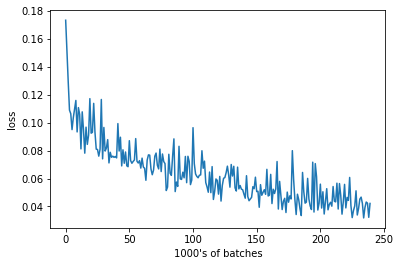

Epoch: 8, Batch: 30, Avg. Loss: 0.048367657139897345
41.67989253997803


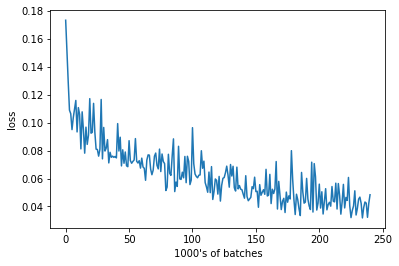

Epoch: 8, Batch: 40, Avg. Loss: 0.03825110159814358
40.7321093082428


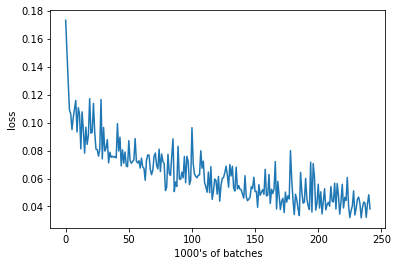

Epoch: 8, Batch: 50, Avg. Loss: 0.0683567900210619
41.039461612701416


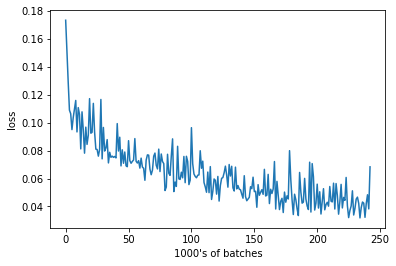

Epoch: 8, Batch: 60, Avg. Loss: 0.028411246463656427
40.81250333786011


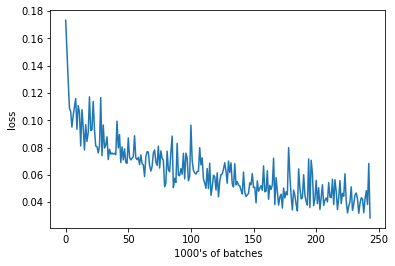

Epoch: 8, Batch: 70, Avg. Loss: 0.03754794858396053
41.74465847015381


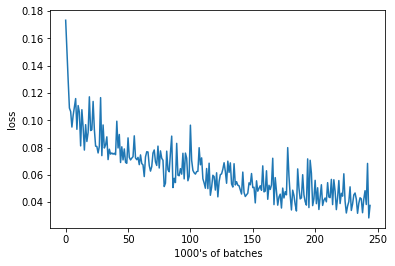

Epoch: 8, Batch: 80, Avg. Loss: 0.06285551022738219
41.1373028755188


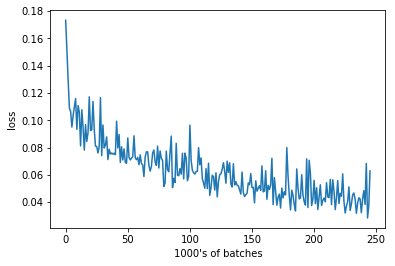

Epoch: 8, Batch: 90, Avg. Loss: 0.04260913077741861
41.42298340797424


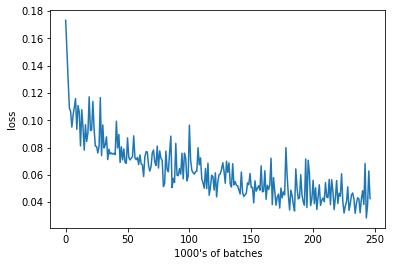

Epoch: 8, Batch: 100, Avg. Loss: 0.048559719882905486
40.968151330947876


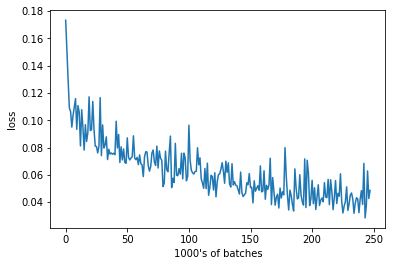

Epoch: 8, Batch: 110, Avg. Loss: 0.038232510536909105
40.615636110305786


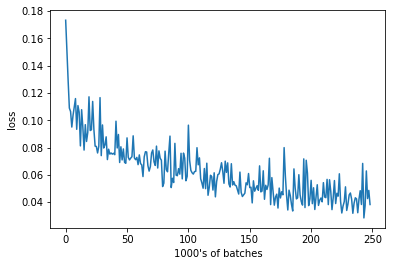

Epoch: 8, Batch: 120, Avg. Loss: 0.041501352190971376
41.96674656867981


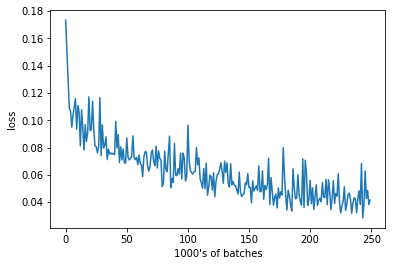

Epoch: 8, Batch: 130, Avg. Loss: 0.024073622934520245
41.02880930900574


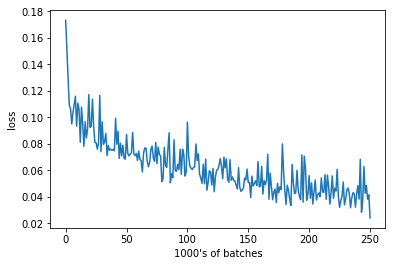

Epoch: 8, Batch: 140, Avg. Loss: 0.02957393191754818
40.86627650260925


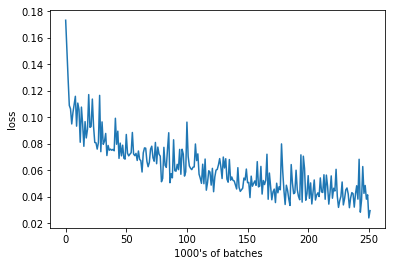

Epoch: 8, Batch: 150, Avg. Loss: 0.04242973737418652
41.21218776702881


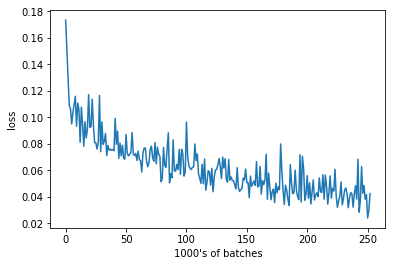

Epoch: 8, Batch: 160, Avg. Loss: 0.03641483699902892
41.58497190475464


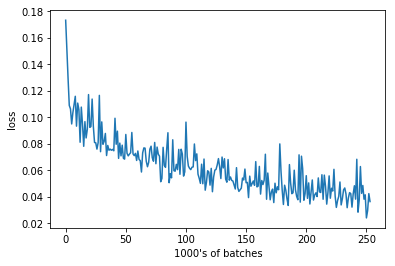

Epoch: 8, Batch: 170, Avg. Loss: 0.042453805543482305
41.0275514125824


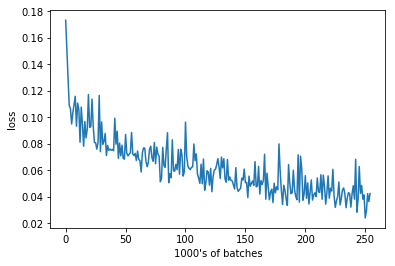

Epoch: 8, Batch: 180, Avg. Loss: 0.04265524577349424
40.830562591552734


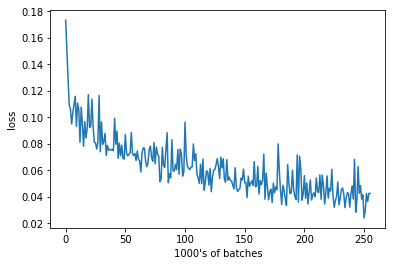

Epoch: 8, Batch: 190, Avg. Loss: 0.03167079035192728
40.79525423049927


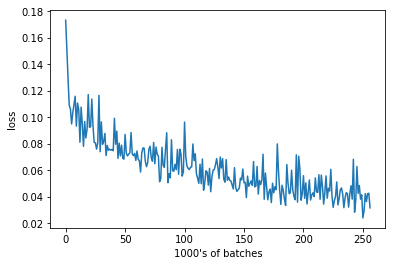

Epoch: 8, Batch: 200, Avg. Loss: 0.03318888545036316
40.75613307952881


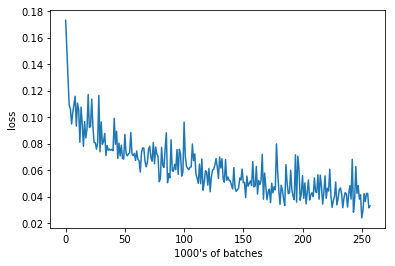

Epoch: 8, Batch: 210, Avg. Loss: 0.04122317358851433
41.72430944442749


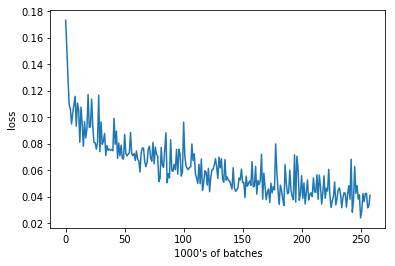

Epoch: 8, Batch: 220, Avg. Loss: 0.03823182452470064
40.78432583808899


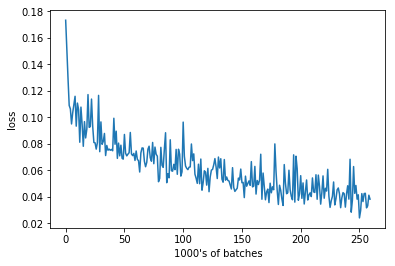

Epoch: 8, Batch: 230, Avg. Loss: 0.03099164441227913
41.06065511703491


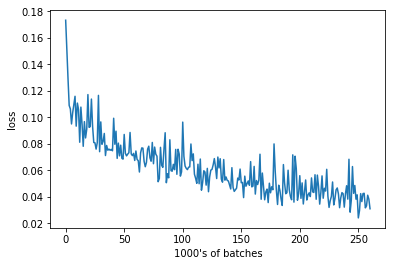

Epoch: 8, Batch: 240, Avg. Loss: 0.03630969822406769
40.71610403060913


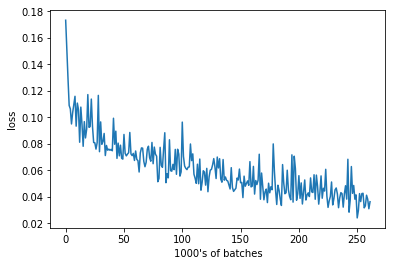

Epoch: 8, Batch: 250, Avg. Loss: 0.04827348832041025
40.878265619277954


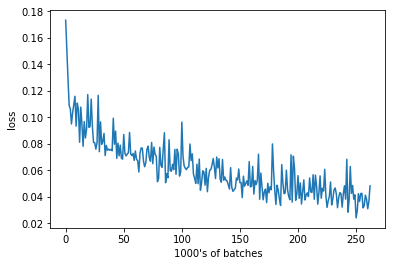

Epoch: 8, Batch: 260, Avg. Loss: 0.04409410618245602
41.738770961761475


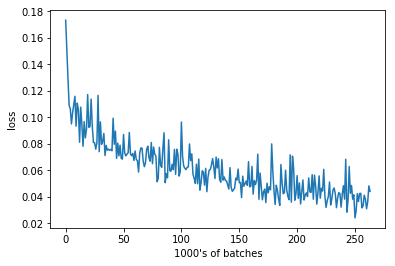

Epoch: 8, Batch: 270, Avg. Loss: 0.042540002055466174
40.72179985046387


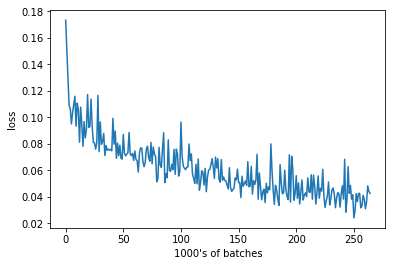

Epoch: 8, Batch: 280, Avg. Loss: 0.04593901503831148
41.03594970703125


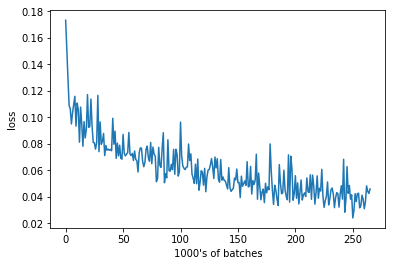

Epoch: 8, Batch: 290, Avg. Loss: 0.030258022528141738
41.13896727561951


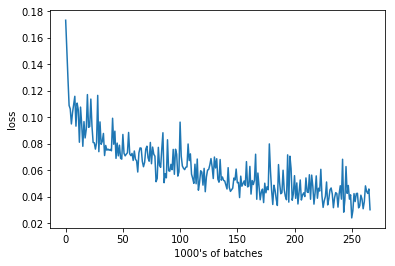

Epoch: 8, Batch: 300, Avg. Loss: 0.031390057504177095
41.12210559844971


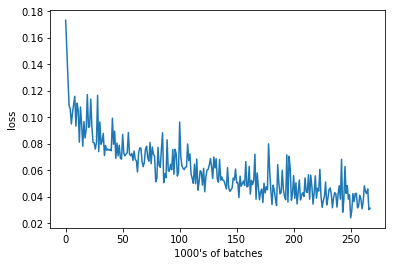

Epoch: 8, Batch: 310, Avg. Loss: 0.047693648189306256
42.463088512420654


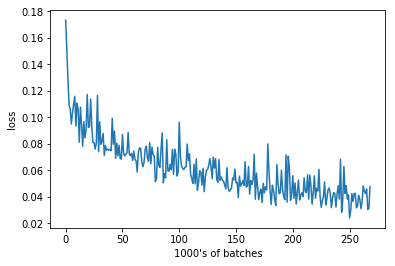

Epoch: 8, Batch: 320, Avg. Loss: 0.04213325772434473
41.04361343383789


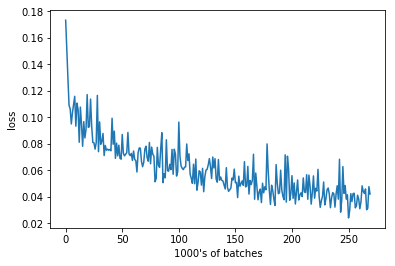

Epoch: 8, Batch: 330, Avg. Loss: 0.03598745614290237
40.904064655303955


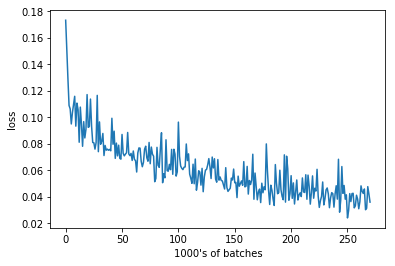

Epoch: 8, Batch: 340, Avg. Loss: 0.041529467515647414
40.84866714477539


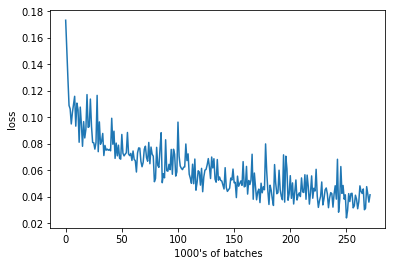

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 9, Batch: 10, Avg. Loss: 0.03236575834453106
46.74203157424927


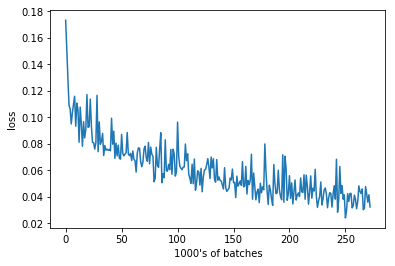

Epoch: 9, Batch: 20, Avg. Loss: 0.03721071947365999
41.373624324798584


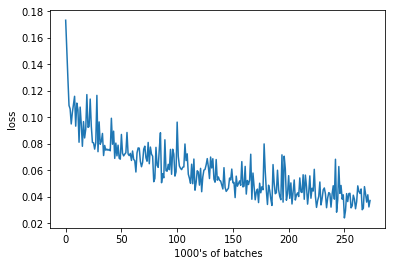

Epoch: 9, Batch: 30, Avg. Loss: 0.028569784294813872
41.54283308982849


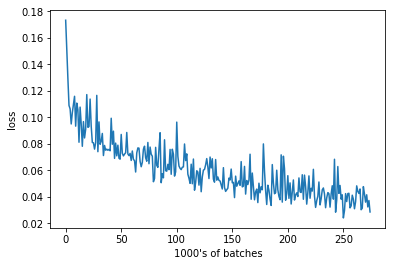

Epoch: 9, Batch: 40, Avg. Loss: 0.037417097762227056
40.943910360336304


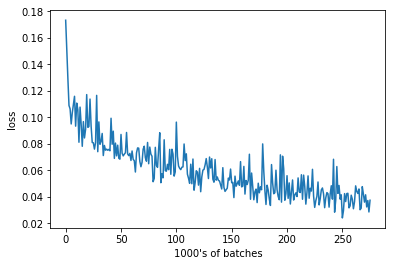

Epoch: 9, Batch: 50, Avg. Loss: 0.03268241910263896
41.308934450149536


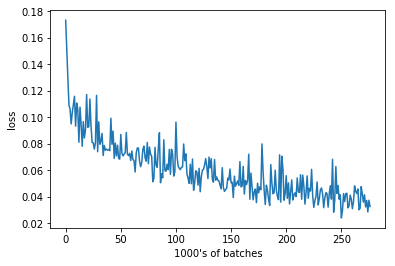

Epoch: 9, Batch: 60, Avg. Loss: 0.029292147792875766
41.761844873428345


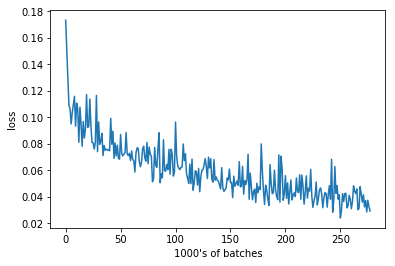

Epoch: 9, Batch: 70, Avg. Loss: 0.04444340616464615
41.255890130996704


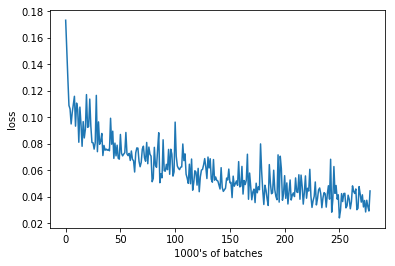

Epoch: 9, Batch: 80, Avg. Loss: 0.031228352151811124
41.01347064971924


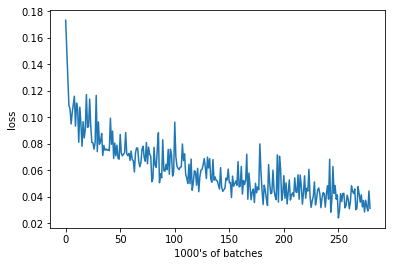

Epoch: 9, Batch: 90, Avg. Loss: 0.034377652779221536
41.43864035606384


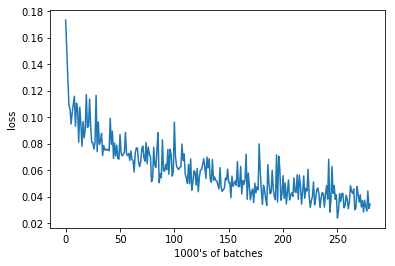

Epoch: 9, Batch: 100, Avg. Loss: 0.03439044523984194
40.7782826423645


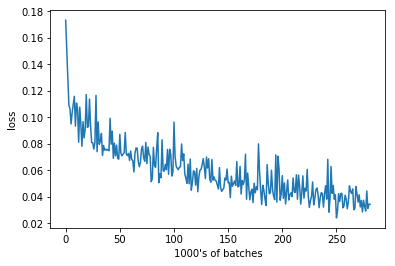

Epoch: 9, Batch: 110, Avg. Loss: 0.04602897595614195
42.51696825027466


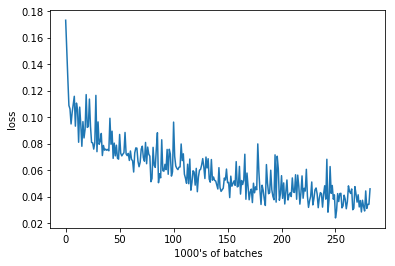

Epoch: 9, Batch: 120, Avg. Loss: 0.03841018546372652
40.919870376586914


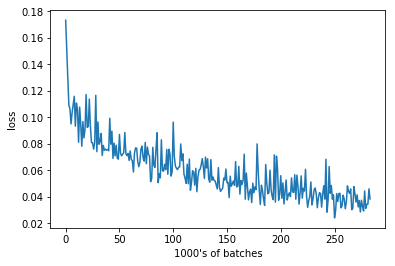

Epoch: 9, Batch: 130, Avg. Loss: 0.03459113202989102
41.074767112731934


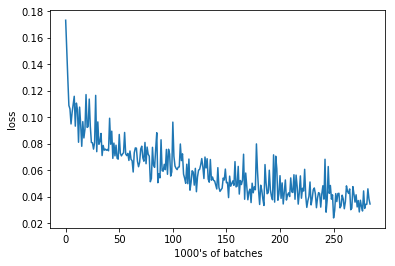

Epoch: 9, Batch: 140, Avg. Loss: 0.0345983911305666
41.154534578323364


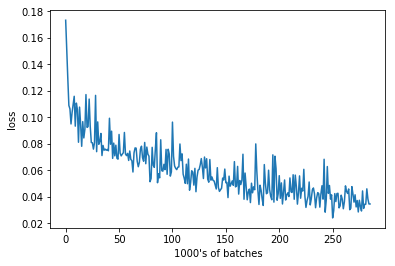

Epoch: 9, Batch: 150, Avg. Loss: 0.037389323115348816
41.30995726585388


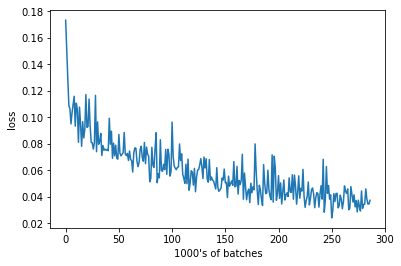

Epoch: 9, Batch: 160, Avg. Loss: 0.02299295589327812
41.87268376350403


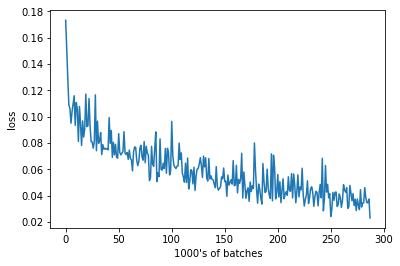

Epoch: 9, Batch: 170, Avg. Loss: 0.036162994988262656
41.08806133270264


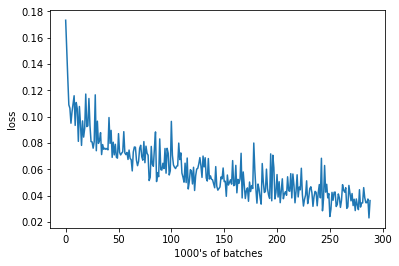

Epoch: 9, Batch: 180, Avg. Loss: 0.028460616245865822
41.503023862838745


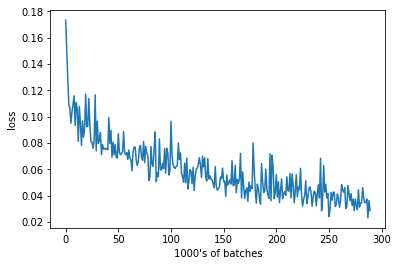

Epoch: 9, Batch: 190, Avg. Loss: 0.026482951920479537
40.79033136367798


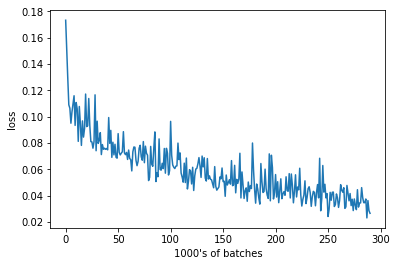

Epoch: 9, Batch: 200, Avg. Loss: 0.05582691580057144
41.088704347610474


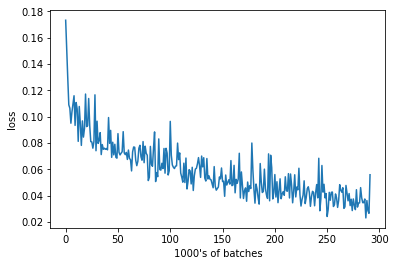

Epoch: 9, Batch: 210, Avg. Loss: 0.04341884236782789
41.78379416465759


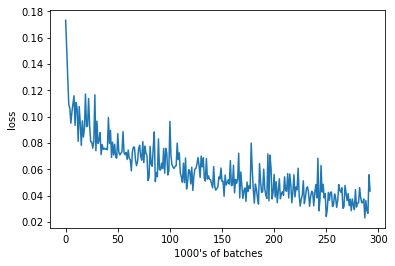

Epoch: 9, Batch: 220, Avg. Loss: 0.03227828368544579
40.61620259284973


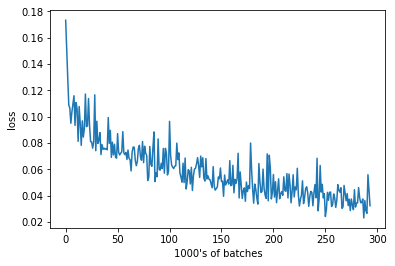

Epoch: 9, Batch: 230, Avg. Loss: 0.03189436150714755
41.089256286621094


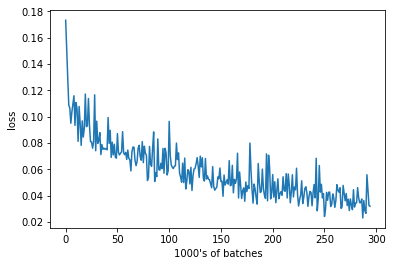

Epoch: 9, Batch: 240, Avg. Loss: 0.030951482616364955
40.96692490577698


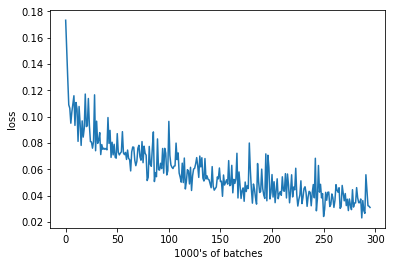

Epoch: 9, Batch: 250, Avg. Loss: 0.029610051400959493
41.63329601287842


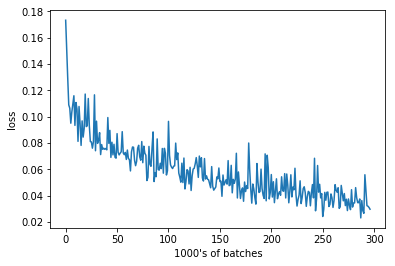

Epoch: 9, Batch: 260, Avg. Loss: 0.05928078461438417
40.86777210235596


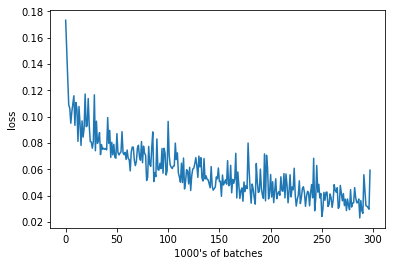

Epoch: 9, Batch: 270, Avg. Loss: 0.052716498635709284
41.13560247421265


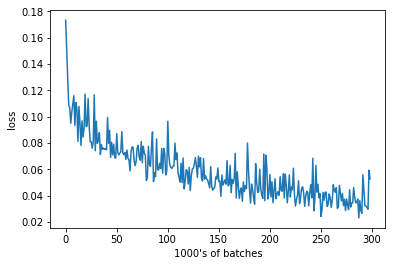

Epoch: 9, Batch: 280, Avg. Loss: 0.032692504674196245
40.825936794281006


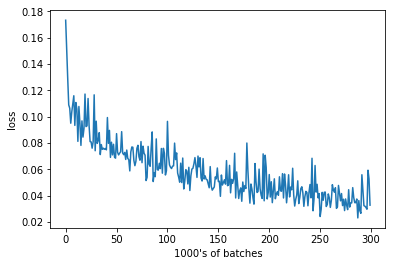

Epoch: 9, Batch: 290, Avg. Loss: 0.03403973858803511
40.538267374038696


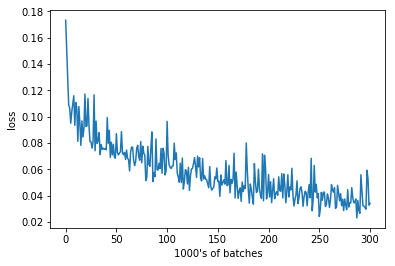

Epoch: 9, Batch: 300, Avg. Loss: 0.026498605124652387
41.76953887939453


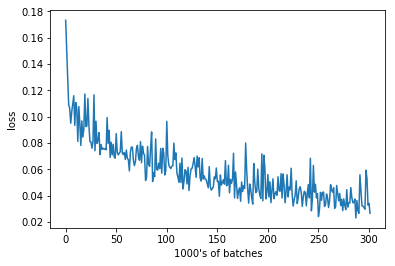

Epoch: 9, Batch: 310, Avg. Loss: 0.030427866242825986
41.09036660194397


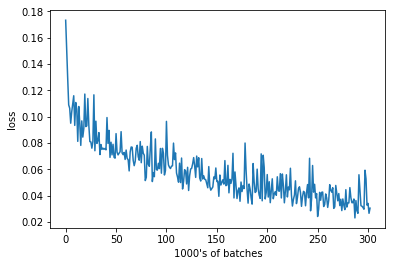

Epoch: 9, Batch: 320, Avg. Loss: 0.032771645672619344
40.65820622444153


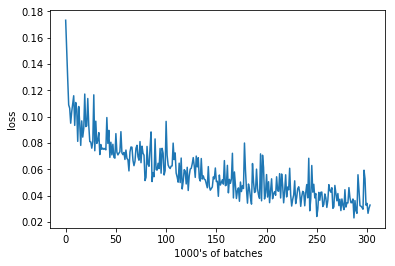

Epoch: 9, Batch: 330, Avg. Loss: 0.03663292955607176
41.146862745285034


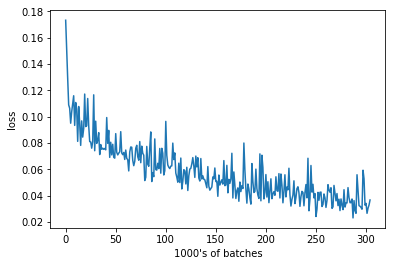

Epoch: 9, Batch: 340, Avg. Loss: 0.04312072740867734
40.22034192085266


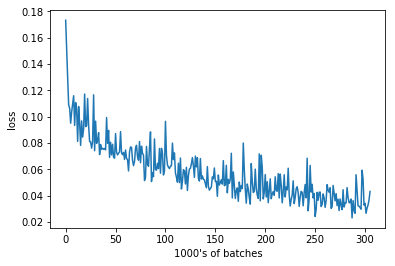

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 10, Batch: 10, Avg. Loss: 0.041827507130801675
47.415719509124756


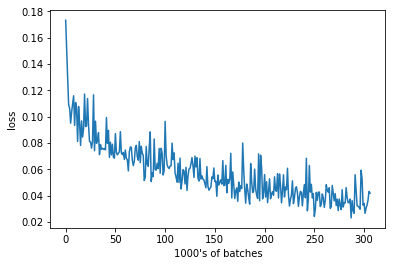

Epoch: 10, Batch: 20, Avg. Loss: 0.04417293891310692
41.420570373535156


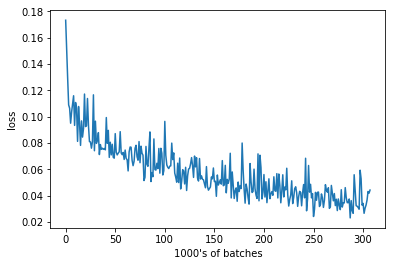

Epoch: 10, Batch: 30, Avg. Loss: 0.025322874914854764
41.603331565856934


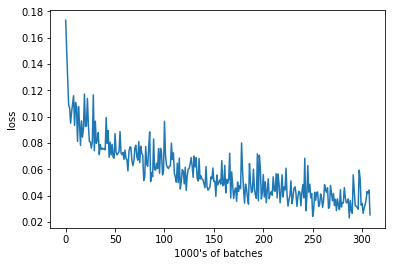

Epoch: 10, Batch: 40, Avg. Loss: 0.03495547827333212
41.010398864746094


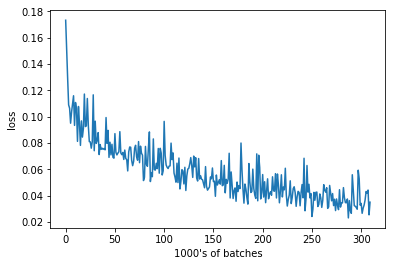

Epoch: 10, Batch: 50, Avg. Loss: 0.03287762757390737
42.35741686820984


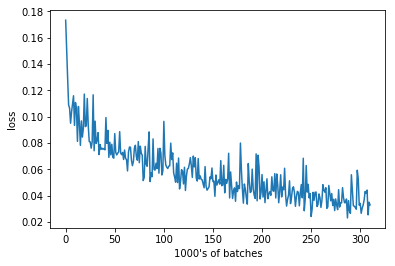

Epoch: 10, Batch: 60, Avg. Loss: 0.03191861631348729
41.220038652420044


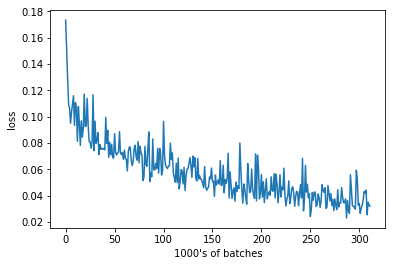

Epoch: 10, Batch: 70, Avg. Loss: 0.03391731353476644
41.2637836933136


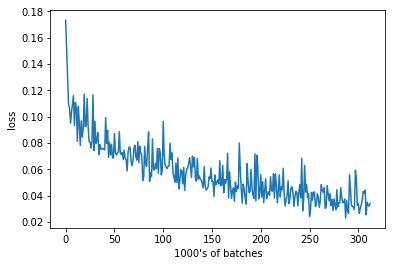

Epoch: 10, Batch: 80, Avg. Loss: 0.029756333120167254
41.46662902832031


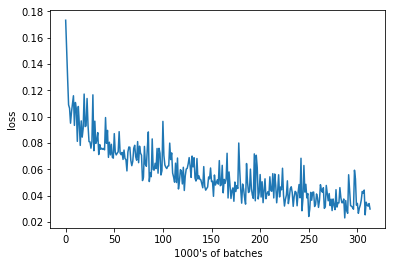

Epoch: 10, Batch: 90, Avg. Loss: 0.04453065674751997
41.657817363739014


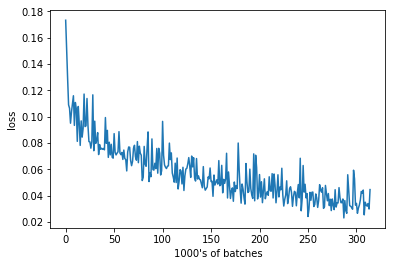

Epoch: 10, Batch: 100, Avg. Loss: 0.03316895235329866
42.394867181777954


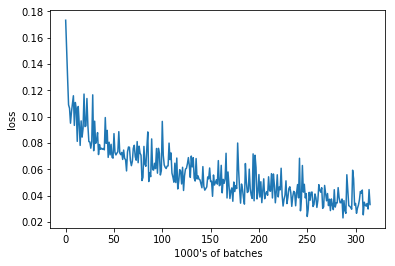

Epoch: 10, Batch: 110, Avg. Loss: 0.024358544684946536
41.63452506065369


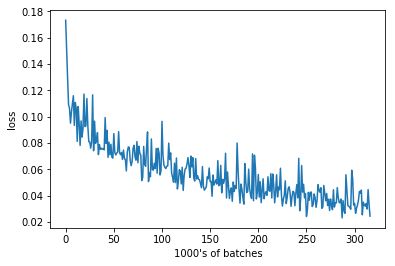

Epoch: 10, Batch: 120, Avg. Loss: 0.03802479337900877
41.41968297958374


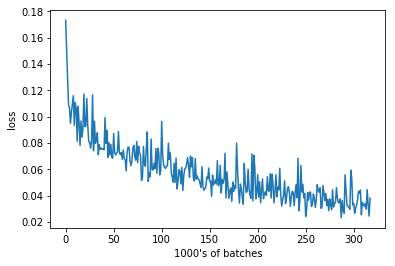

Epoch: 10, Batch: 130, Avg. Loss: 0.056567765213549136
41.14398169517517


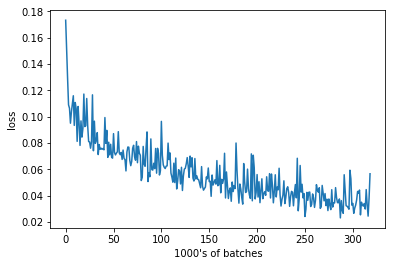

Epoch: 10, Batch: 140, Avg. Loss: 0.04294281620532274
41.55381178855896


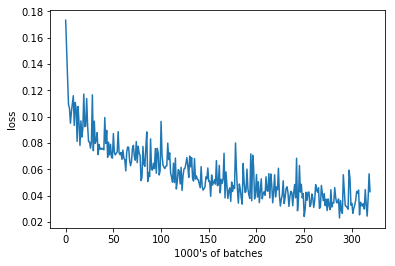

Epoch: 10, Batch: 150, Avg. Loss: 0.03525229711085558
42.665865898132324


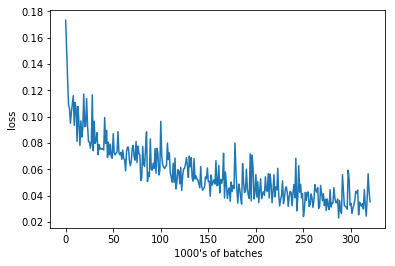

Epoch: 10, Batch: 160, Avg. Loss: 0.02722941655665636
41.469900369644165


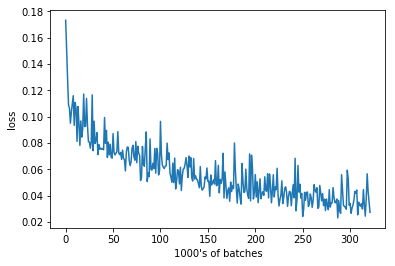

Epoch: 10, Batch: 170, Avg. Loss: 0.032065918762236835
41.23472785949707


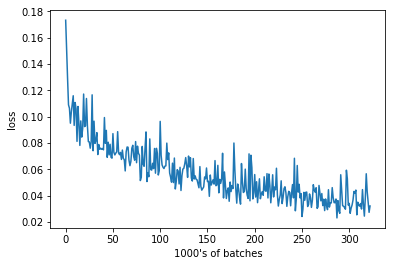

Epoch: 10, Batch: 180, Avg. Loss: 0.03679801728576422
41.7103328704834


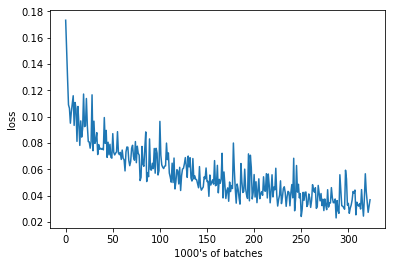

Epoch: 10, Batch: 190, Avg. Loss: 0.033961528819054364
42.53857183456421


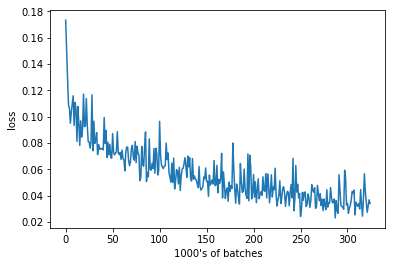

Epoch: 10, Batch: 200, Avg. Loss: 0.02703311061486602
41.33621120452881


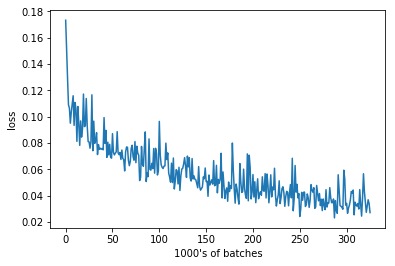

Epoch: 10, Batch: 210, Avg. Loss: 0.038203762471675874
41.40506315231323


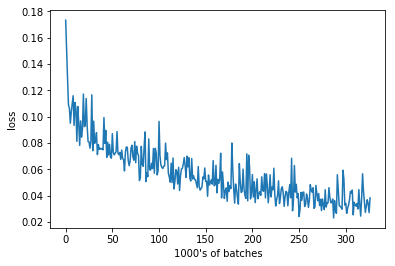

Epoch: 10, Batch: 220, Avg. Loss: 0.02911718264222145
41.07813048362732


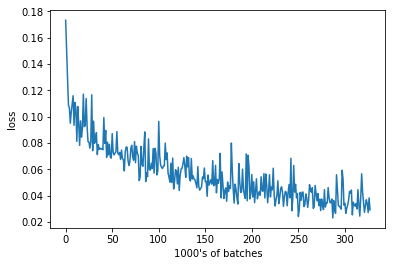

Epoch: 10, Batch: 230, Avg. Loss: 0.02716701738536358
41.405922412872314


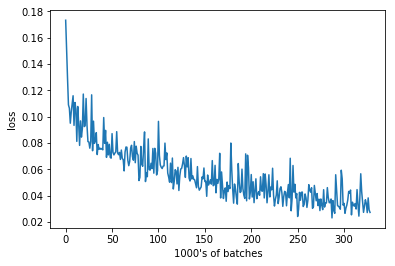

Epoch: 10, Batch: 240, Avg. Loss: 0.035971935093402865
42.12745237350464


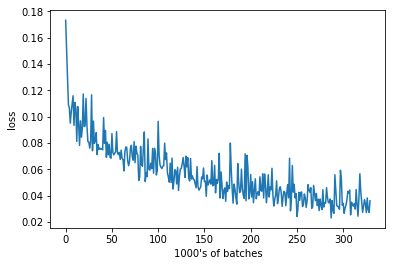

Epoch: 10, Batch: 250, Avg. Loss: 0.03601624760776758
40.91504740715027


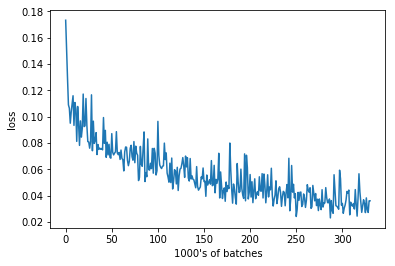

Epoch: 10, Batch: 260, Avg. Loss: 0.029626180604100227
41.58744215965271


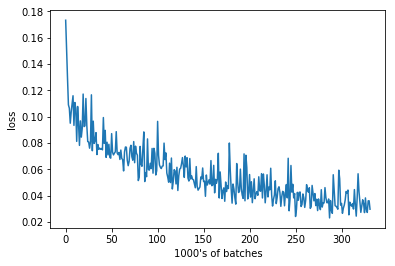

Epoch: 10, Batch: 270, Avg. Loss: 0.02837447263300419
41.22136831283569


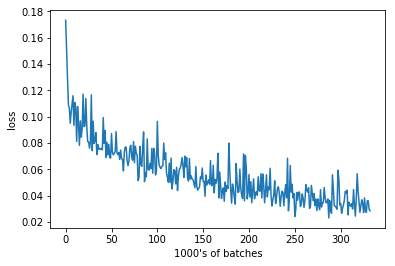

Epoch: 10, Batch: 280, Avg. Loss: 0.0320532064884901
40.821969509124756


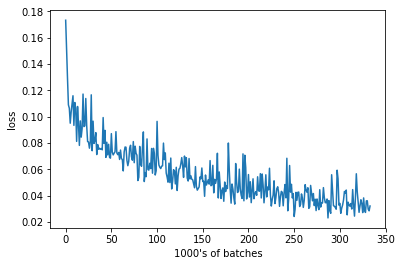

Epoch: 10, Batch: 290, Avg. Loss: 0.025147132016718386
42.32307004928589


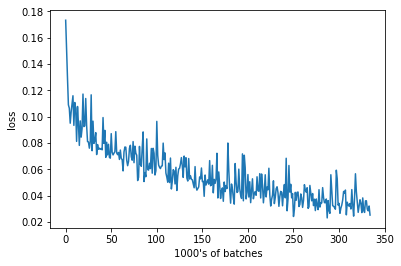

Epoch: 10, Batch: 300, Avg. Loss: 0.025188391283154487
40.79780960083008


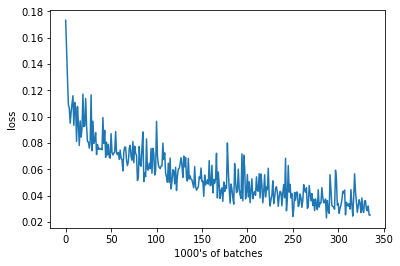

Epoch: 10, Batch: 310, Avg. Loss: 0.029563483595848084
40.71348834037781


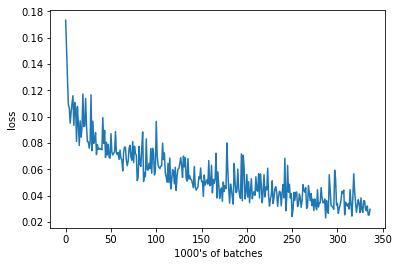

Epoch: 10, Batch: 320, Avg. Loss: 0.0403596306219697
41.027586221694946


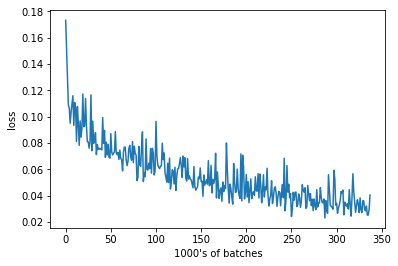

Epoch: 10, Batch: 330, Avg. Loss: 0.02393045723438263
40.58778357505798


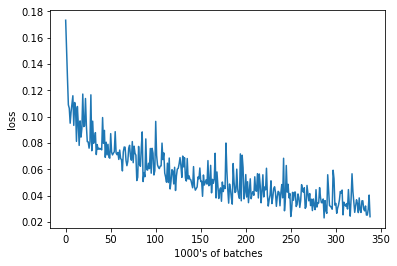

Epoch: 10, Batch: 340, Avg. Loss: 0.031175300292670727
42.00088596343994


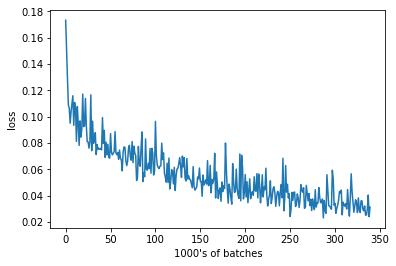

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 11, Batch: 10, Avg. Loss: 0.03508618790656328
46.60775709152222


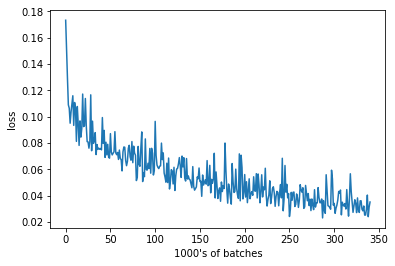

Epoch: 11, Batch: 20, Avg. Loss: 0.022100461460649968
43.312779903411865


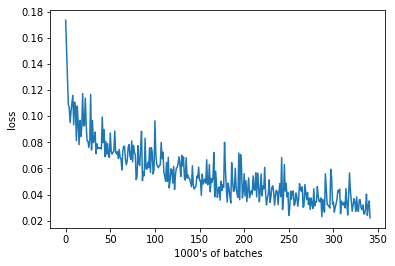

Epoch: 11, Batch: 30, Avg. Loss: 0.028593092504888774
41.9301552772522


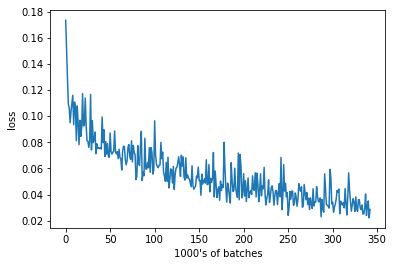

Epoch: 11, Batch: 40, Avg. Loss: 0.027291234489530324
41.9214608669281


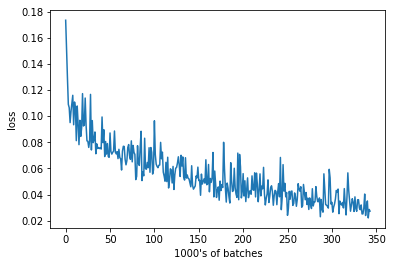

Epoch: 11, Batch: 50, Avg. Loss: 0.0393617887981236
40.79352927207947


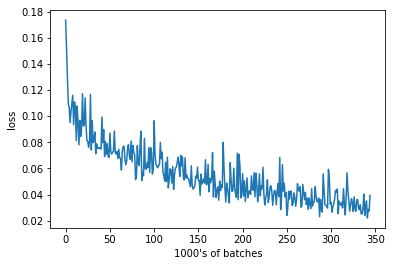

Epoch: 11, Batch: 60, Avg. Loss: 0.03412975650280714
40.753291845321655


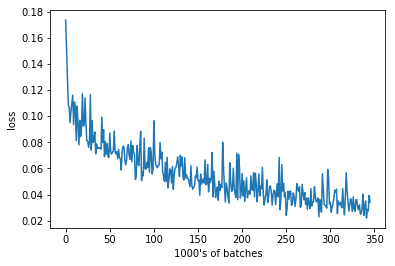

Epoch: 11, Batch: 70, Avg. Loss: 0.03732847748324275
40.897589683532715


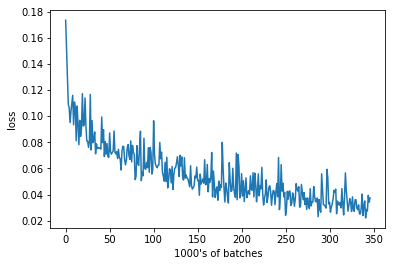

Epoch: 11, Batch: 80, Avg. Loss: 0.026941381674259902
41.50350570678711


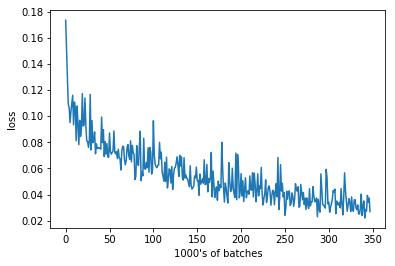

Epoch: 11, Batch: 90, Avg. Loss: 0.030355372093617917
43.35359764099121


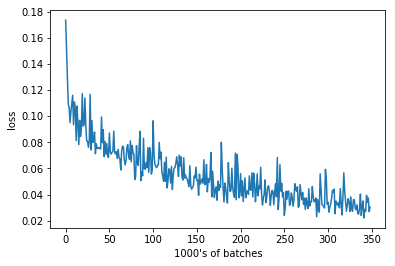

Epoch: 11, Batch: 100, Avg. Loss: 0.037092546559870244
41.26904630661011


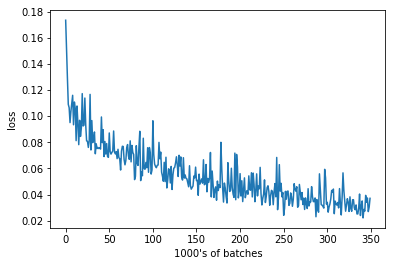

Epoch: 11, Batch: 110, Avg. Loss: 0.03502572737634182
41.02006936073303


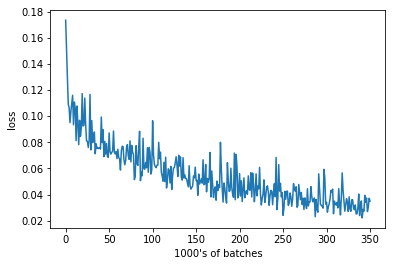

Epoch: 11, Batch: 120, Avg. Loss: 0.023366147838532924
41.04867768287659


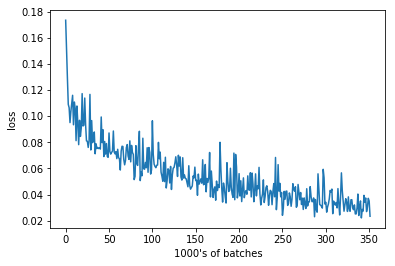

Epoch: 11, Batch: 130, Avg. Loss: 0.02849672343581915
41.45670008659363


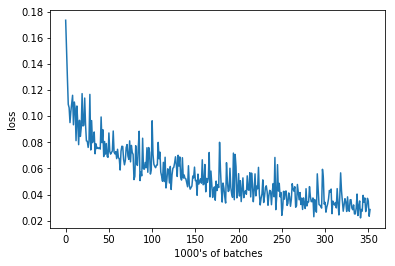

Epoch: 11, Batch: 140, Avg. Loss: 0.029894984792917967
42.33824062347412


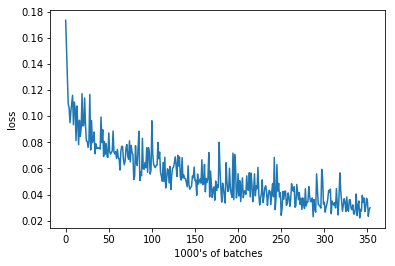

Epoch: 11, Batch: 150, Avg. Loss: 0.03258651616051793
41.39659905433655


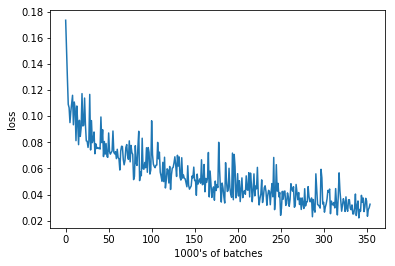

Epoch: 11, Batch: 160, Avg. Loss: 0.03017442086711526
41.276774168014526


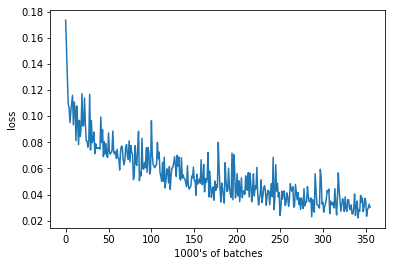

Epoch: 11, Batch: 170, Avg. Loss: 0.04621675768867135
41.03556537628174


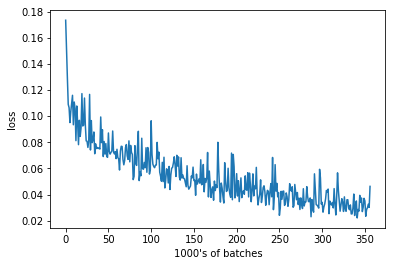

Epoch: 11, Batch: 180, Avg. Loss: 0.043693835660815236
40.88231420516968


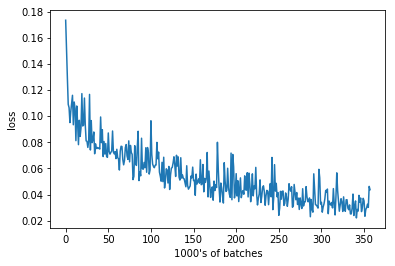

Epoch: 11, Batch: 190, Avg. Loss: 0.04129420705139637
42.36033654212952


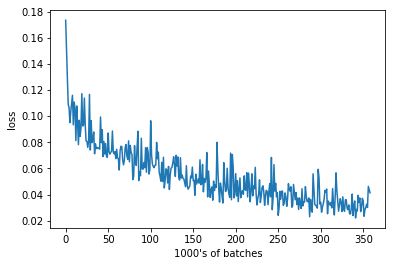

Epoch: 11, Batch: 200, Avg. Loss: 0.03350965362042189
41.43223261833191


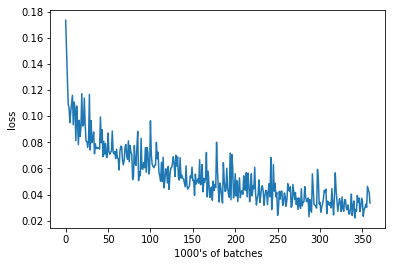

Epoch: 11, Batch: 210, Avg. Loss: 0.04081020765006542
41.67150545120239


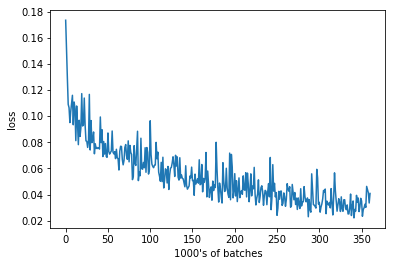

Epoch: 11, Batch: 220, Avg. Loss: 0.029621884413063525
41.10574746131897


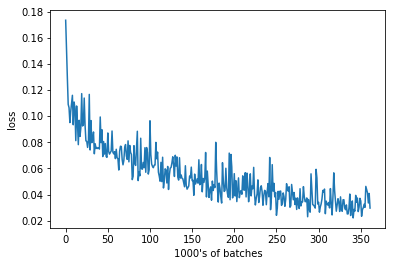

Epoch: 11, Batch: 230, Avg. Loss: 0.03116250392049551
42.50078535079956


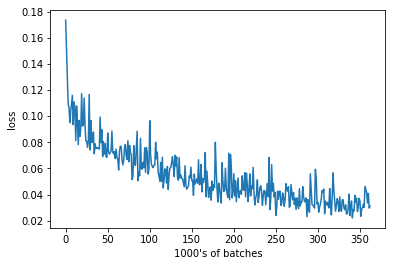

Epoch: 11, Batch: 240, Avg. Loss: 0.040224922448396684
41.48901319503784


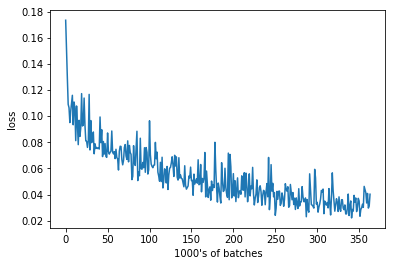

Epoch: 11, Batch: 250, Avg. Loss: 0.035326522495597604
41.076005935668945


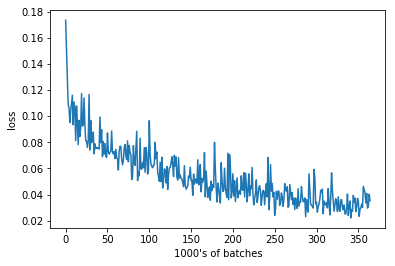

Epoch: 11, Batch: 260, Avg. Loss: 0.027843078691512348
41.51199793815613


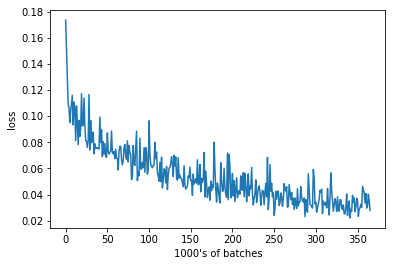

Epoch: 11, Batch: 270, Avg. Loss: 0.034733627922832966
41.00300598144531


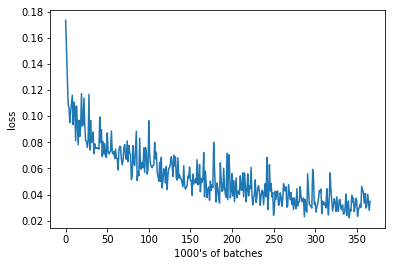

Epoch: 11, Batch: 280, Avg. Loss: 0.026710318960249425
41.86169099807739


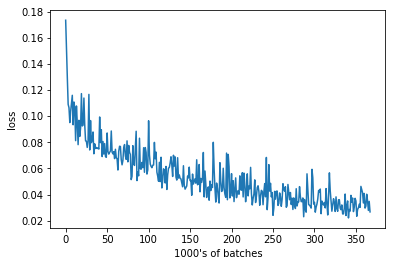

Epoch: 11, Batch: 290, Avg. Loss: 0.025389999710023405
41.09341526031494


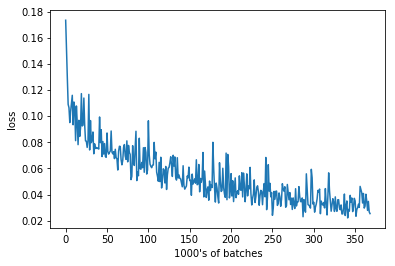

Epoch: 11, Batch: 300, Avg. Loss: 0.039905729796737434
41.025943756103516


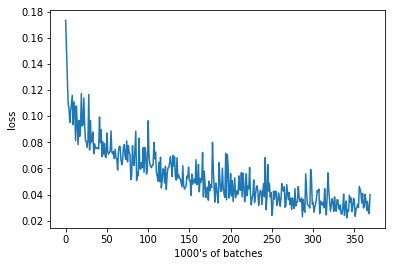

Epoch: 11, Batch: 310, Avg. Loss: 0.0377324502915144
40.96893310546875


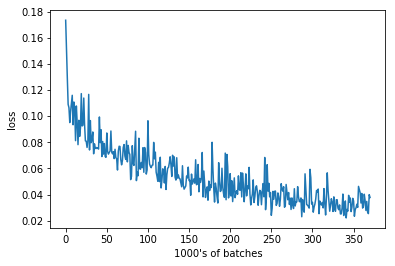

Epoch: 11, Batch: 320, Avg. Loss: 0.024924804735928775
41.45746421813965


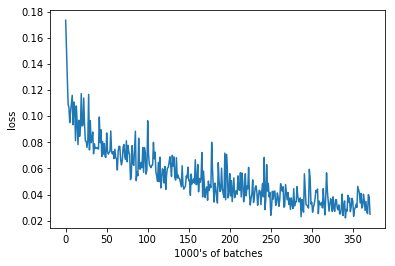

Epoch: 11, Batch: 330, Avg. Loss: 0.03260107059031725
42.22633767127991


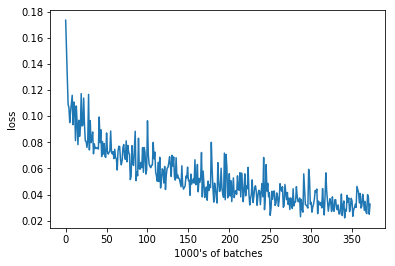

Epoch: 11, Batch: 340, Avg. Loss: 0.04327453095465898
40.78708815574646


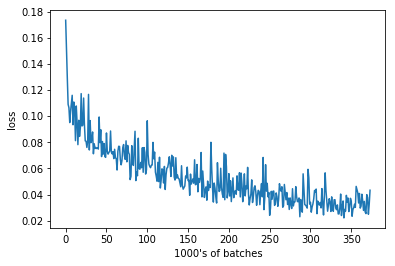

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 12, Batch: 10, Avg. Loss: 0.026121803745627403
47.779098987579346


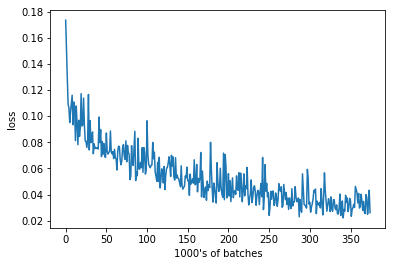

Epoch: 12, Batch: 20, Avg. Loss: 0.029139132611453532
41.72154211997986


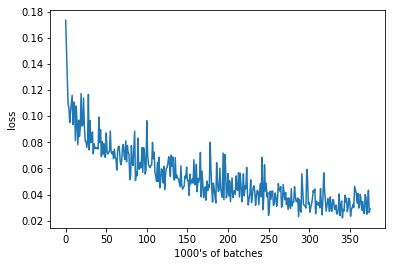

Epoch: 12, Batch: 30, Avg. Loss: 0.02153095034882426
43.407697439193726


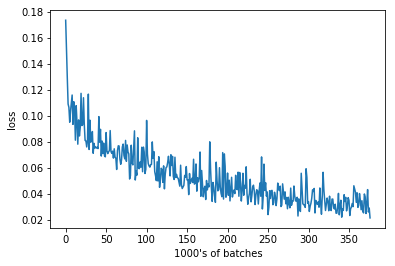

Epoch: 12, Batch: 40, Avg. Loss: 0.03309380412101746
41.4742796421051


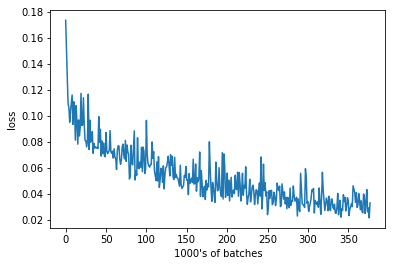

Epoch: 12, Batch: 50, Avg. Loss: 0.03289868151769042
41.10053777694702


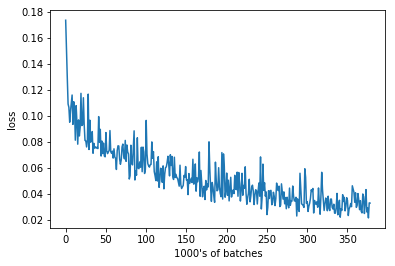

Epoch: 12, Batch: 60, Avg. Loss: 0.028305346705019475
41.2963125705719


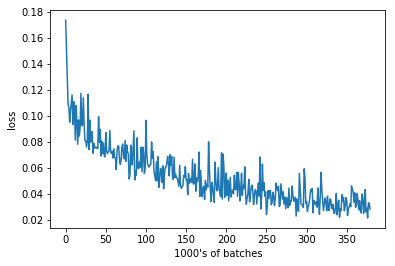

Epoch: 12, Batch: 70, Avg. Loss: 0.03169615473598242
41.138020277023315


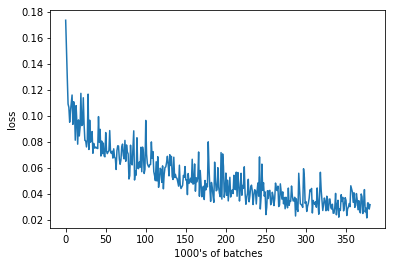

Epoch: 12, Batch: 80, Avg. Loss: 0.027260171994566918
42.2955858707428


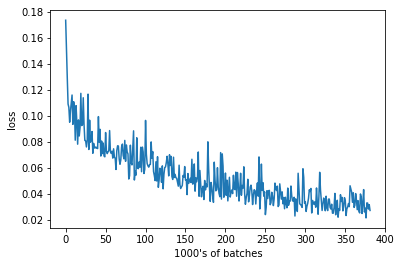

Epoch: 12, Batch: 90, Avg. Loss: 0.029562078043818475
41.67726802825928


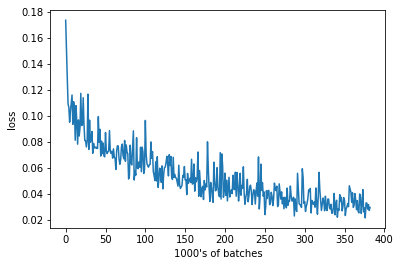

Epoch: 12, Batch: 100, Avg. Loss: 0.03324786424636841
41.46077919006348


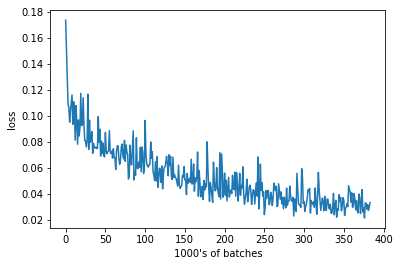

Epoch: 12, Batch: 110, Avg. Loss: 0.029484484996646642
41.32204008102417


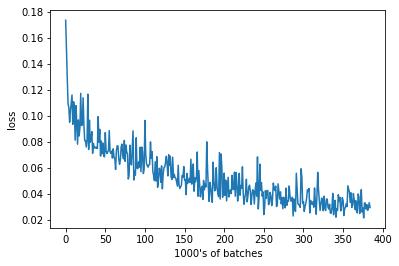

Epoch: 12, Batch: 120, Avg. Loss: 0.04412462329491973
41.19838309288025


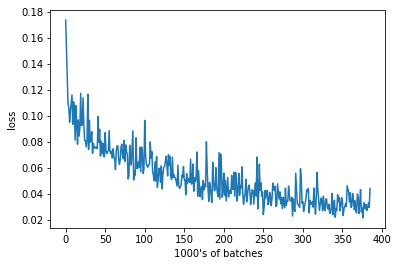

Epoch: 12, Batch: 130, Avg. Loss: 0.028084271773695945
42.73260855674744


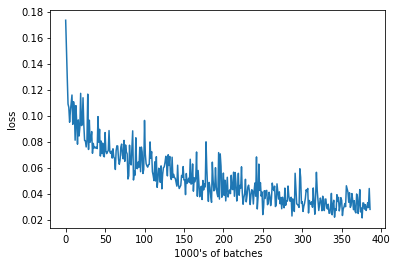

Epoch: 12, Batch: 140, Avg. Loss: 0.034477366134524345
41.12702751159668


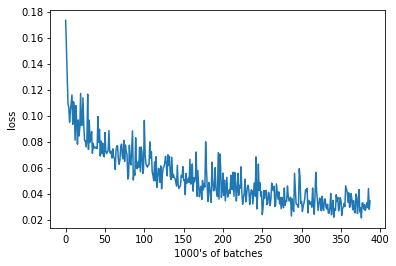

Epoch: 12, Batch: 150, Avg. Loss: 0.025154390092939138
41.744933128356934


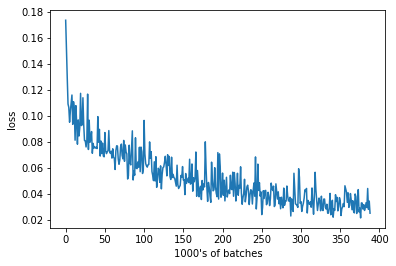

Epoch: 12, Batch: 160, Avg. Loss: 0.03439069893211126
41.28088665008545


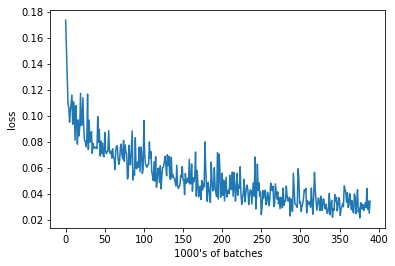

Epoch: 12, Batch: 170, Avg. Loss: 0.03526271376758814
43.00084924697876


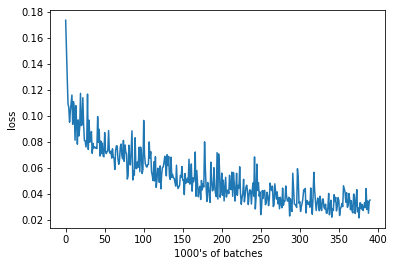

Epoch: 12, Batch: 180, Avg. Loss: 0.02815975872799754
41.54224514961243


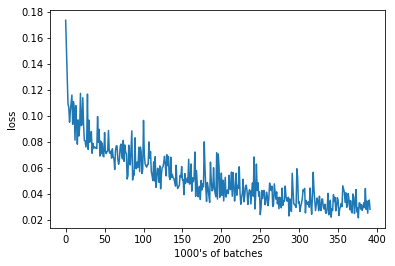

Epoch: 12, Batch: 190, Avg. Loss: 0.028707433491945267
40.855764389038086


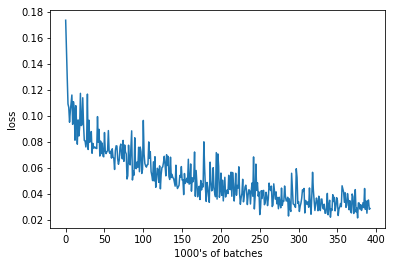

Epoch: 12, Batch: 200, Avg. Loss: 0.029442182462662458
41.82420635223389


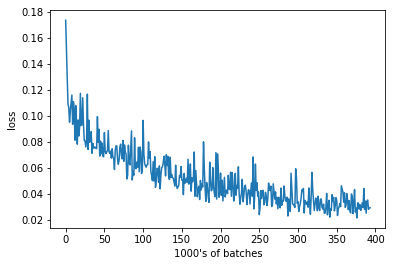

Epoch: 12, Batch: 210, Avg. Loss: 0.038778831530362365
41.17777919769287


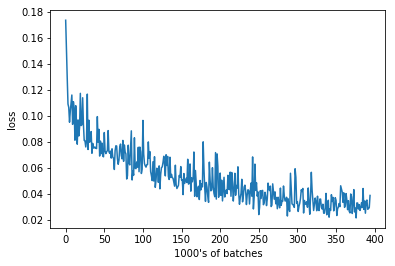

Epoch: 12, Batch: 220, Avg. Loss: 0.0359893242828548
42.406694173812866


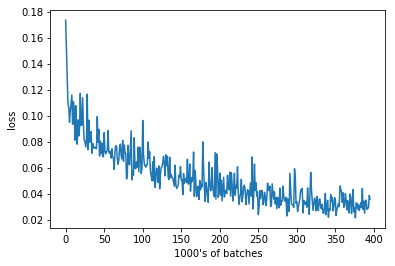

Epoch: 12, Batch: 230, Avg. Loss: 0.02141408743336797
41.20195388793945


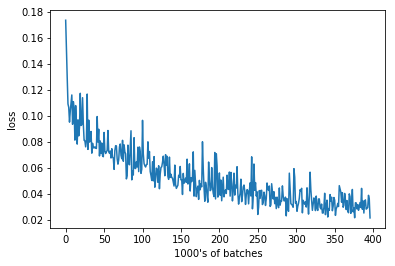

Epoch: 12, Batch: 240, Avg. Loss: 0.02433975450694561
41.09379053115845


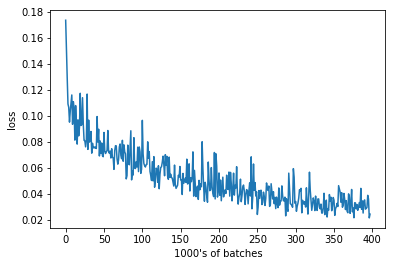

Epoch: 12, Batch: 250, Avg. Loss: 0.04004427520558238
41.34134602546692


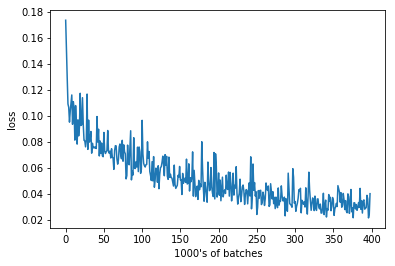

Epoch: 12, Batch: 260, Avg. Loss: 0.028432560618966818
41.3882269859314


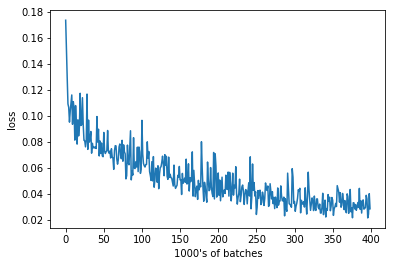

Epoch: 12, Batch: 270, Avg. Loss: 0.021967566385865212
42.340962409973145


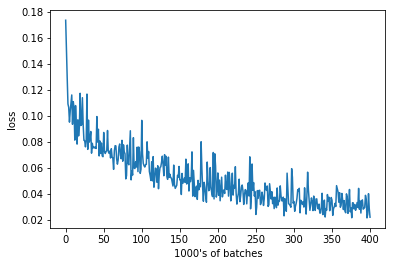

Epoch: 12, Batch: 280, Avg. Loss: 0.02636561430990696
41.29671502113342


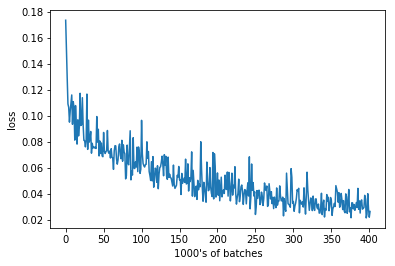

Epoch: 12, Batch: 290, Avg. Loss: 0.020233168452978133
40.98158121109009


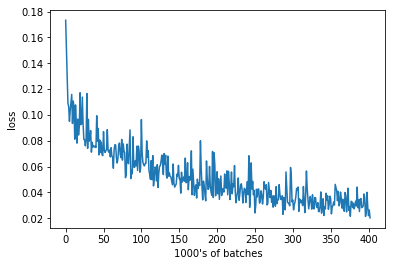

Epoch: 12, Batch: 300, Avg. Loss: 0.021873935032635926
40.800780296325684


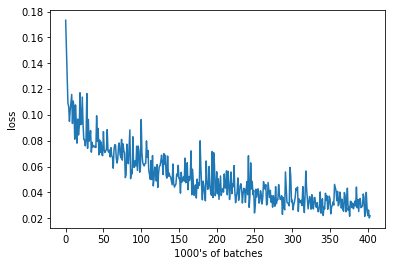

Epoch: 12, Batch: 310, Avg. Loss: 0.04683469049632549
40.7376708984375


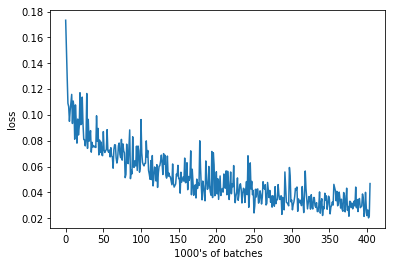

Epoch: 12, Batch: 320, Avg. Loss: 0.034029800444841385
42.55795478820801


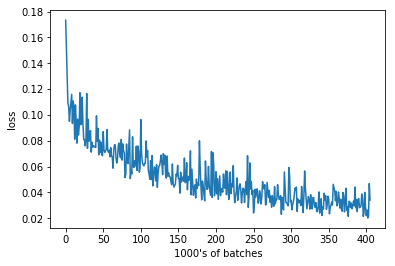

Epoch: 12, Batch: 330, Avg. Loss: 0.046858543250709775
41.053226470947266


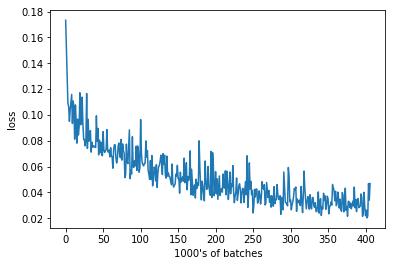

Epoch: 12, Batch: 340, Avg. Loss: 0.03027100544422865
40.79031705856323


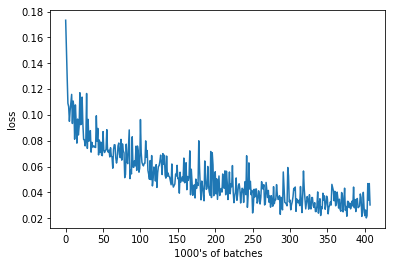

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 13, Batch: 10, Avg. Loss: 0.02141180671751499
46.29352951049805


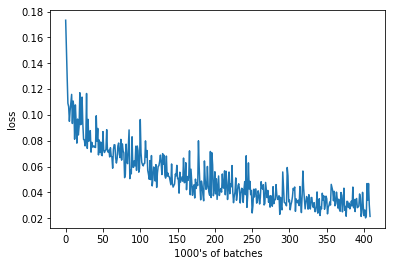

Epoch: 13, Batch: 20, Avg. Loss: 0.0321842297911644
42.88462018966675


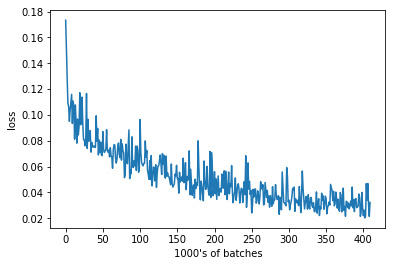

Epoch: 13, Batch: 30, Avg. Loss: 0.033886110316962
41.82898831367493


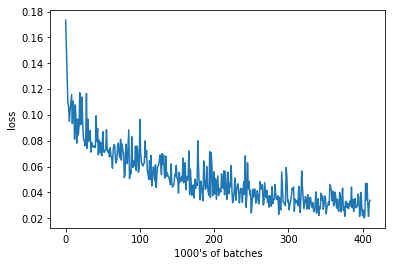

Epoch: 13, Batch: 40, Avg. Loss: 0.024495594017207623
40.77670168876648


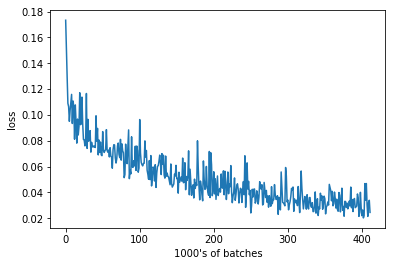

Epoch: 13, Batch: 50, Avg. Loss: 0.027133206371217966
41.177626848220825


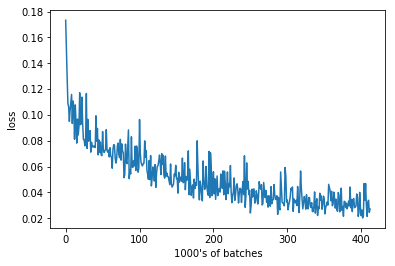

Epoch: 13, Batch: 60, Avg. Loss: 0.03257906287908554
42.3026487827301


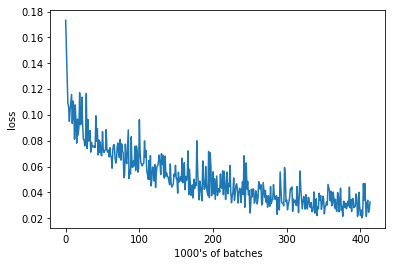

Epoch: 13, Batch: 70, Avg. Loss: 0.03406050205230713
43.553417682647705


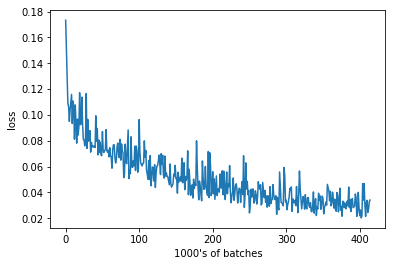

Epoch: 13, Batch: 80, Avg. Loss: 0.029733617790043354
41.69732308387756


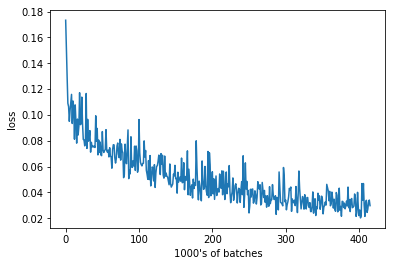

Epoch: 13, Batch: 90, Avg. Loss: 0.04971667025238276
41.32229018211365


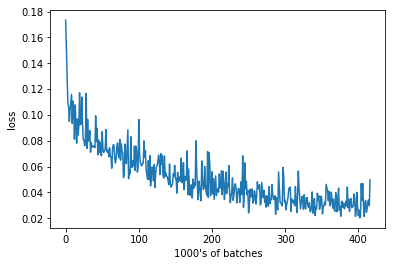

Epoch: 13, Batch: 100, Avg. Loss: 0.02677307780832052
41.16334056854248


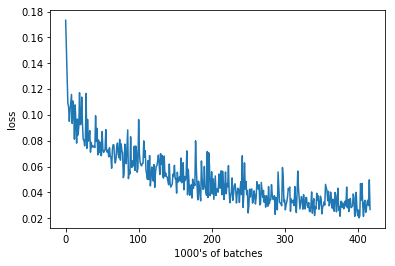

Epoch: 13, Batch: 110, Avg. Loss: 0.02143640900030732
42.554890632629395


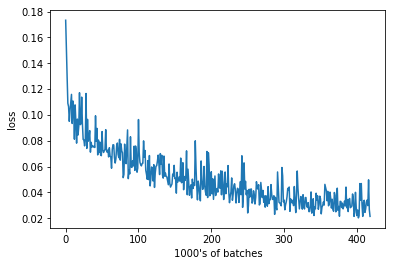

Epoch: 13, Batch: 120, Avg. Loss: 0.022819571569561957
41.09108090400696


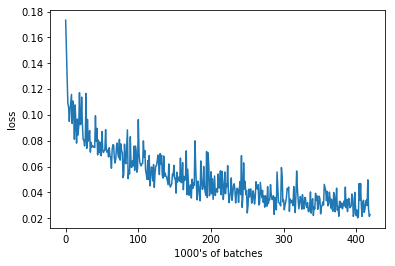

Epoch: 13, Batch: 130, Avg. Loss: 0.03240498378872871
41.13282918930054


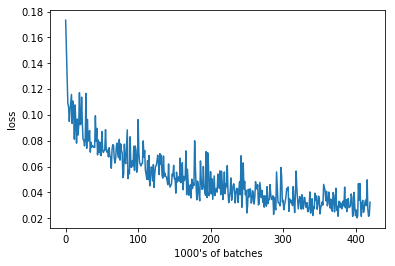

Epoch: 13, Batch: 140, Avg. Loss: 0.022047257144004108
41.10661864280701


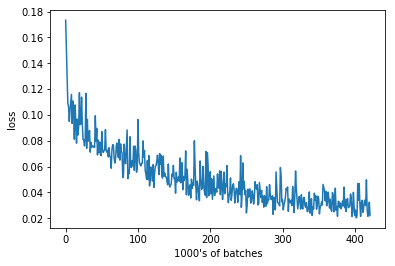

Epoch: 13, Batch: 150, Avg. Loss: 0.03170610330998898
41.518970012664795


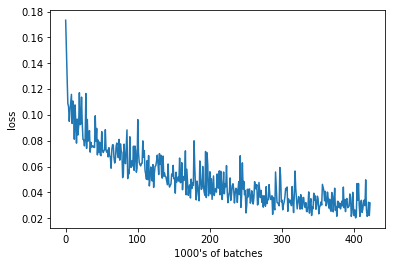

Epoch: 13, Batch: 160, Avg. Loss: 0.02996093612164259
42.58322811126709


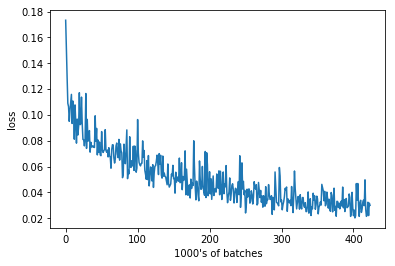

Epoch: 13, Batch: 170, Avg. Loss: 0.026904684863984583
41.04341149330139


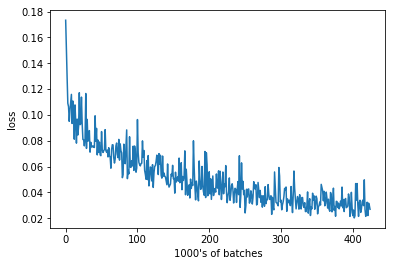

Epoch: 13, Batch: 180, Avg. Loss: 0.042662172205746175
41.02704477310181


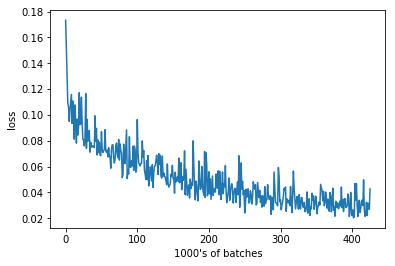

Epoch: 13, Batch: 190, Avg. Loss: 0.03216969957575202
41.56267809867859


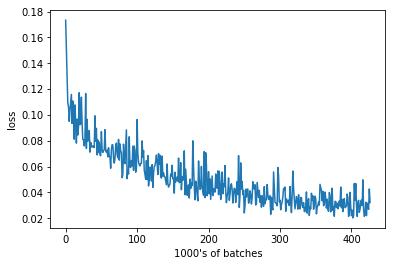

Epoch: 13, Batch: 200, Avg. Loss: 0.022246467787772416
41.530205965042114


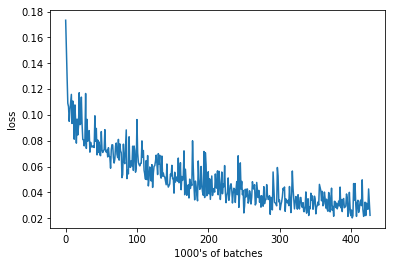

Epoch: 13, Batch: 210, Avg. Loss: 0.03172228885814547
42.57812714576721


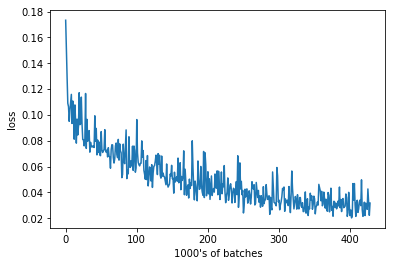

Epoch: 13, Batch: 220, Avg. Loss: 0.030445803608745336
41.2939293384552


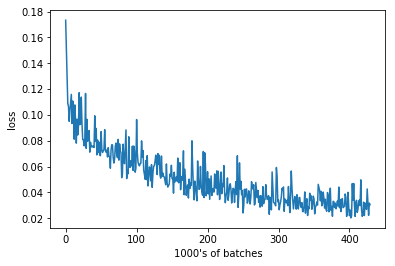

Epoch: 13, Batch: 230, Avg. Loss: 0.02731652082875371
41.4745671749115


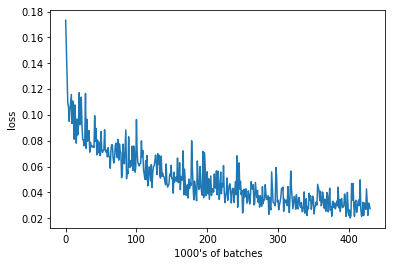

Epoch: 13, Batch: 240, Avg. Loss: 0.02648993330076337
41.169861793518066


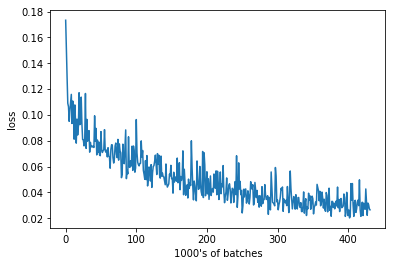

Epoch: 13, Batch: 250, Avg. Loss: 0.04450300727039576
41.12012958526611


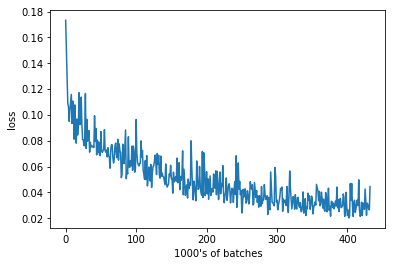

Epoch: 13, Batch: 260, Avg. Loss: 0.0525099853053689
43.314266204833984


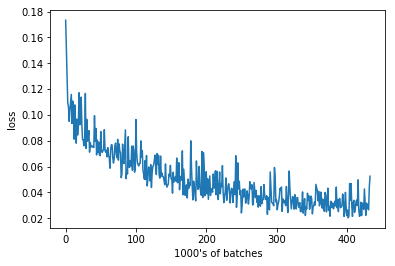

Epoch: 13, Batch: 270, Avg. Loss: 0.04177595414221287
41.09068965911865


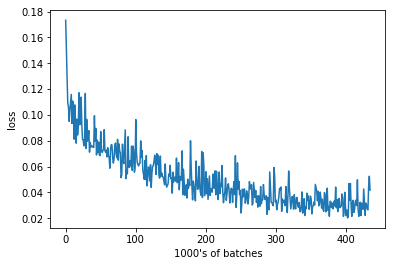

Epoch: 13, Batch: 280, Avg. Loss: 0.029877663031220435
41.535714864730835


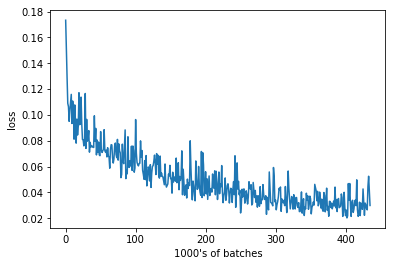

Epoch: 13, Batch: 290, Avg. Loss: 0.042331870459020135
41.28595185279846


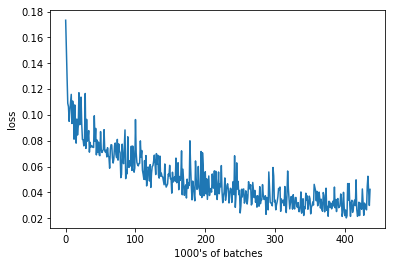

Epoch: 13, Batch: 300, Avg. Loss: 0.017743851244449615
41.247119188308716


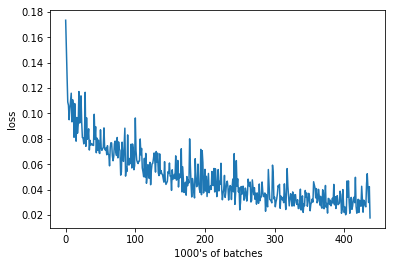

Epoch: 13, Batch: 310, Avg. Loss: 0.028291788790374993
42.72179293632507


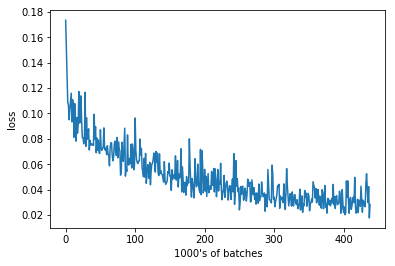

Epoch: 13, Batch: 320, Avg. Loss: 0.030260948929935694
41.449331760406494


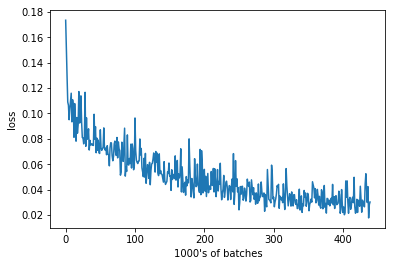

Epoch: 13, Batch: 330, Avg. Loss: 0.028621000330895187
41.58727955818176


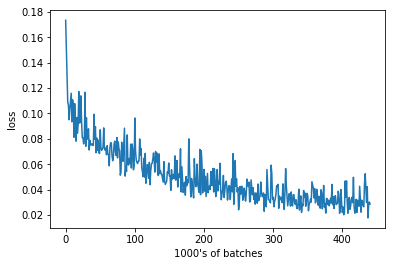

Epoch: 13, Batch: 340, Avg. Loss: 0.030386302247643472
41.62706446647644


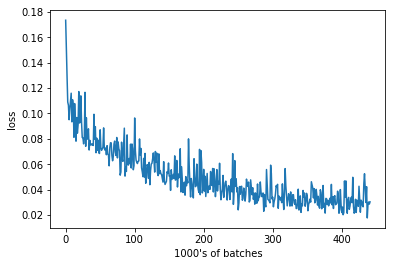

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 14, Batch: 10, Avg. Loss: 0.02823509378358722
51.14037346839905


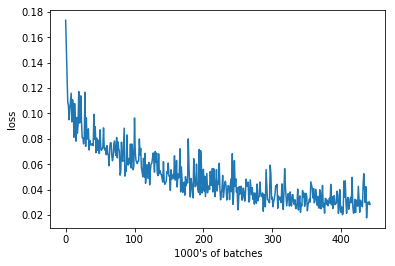

Epoch: 14, Batch: 20, Avg. Loss: 0.021464739460498095
42.36947989463806


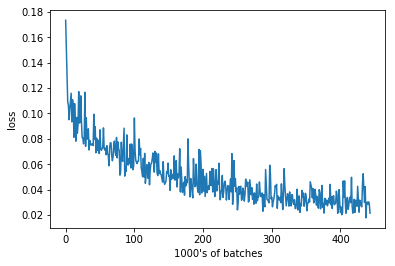

Epoch: 14, Batch: 30, Avg. Loss: 0.018878046702593566
42.04651188850403


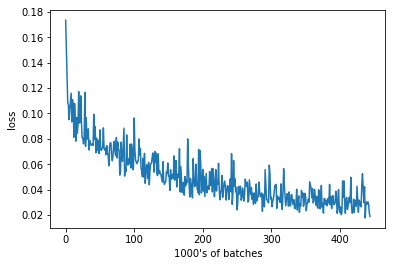

Epoch: 14, Batch: 40, Avg. Loss: 0.02231510290876031
41.320353746414185


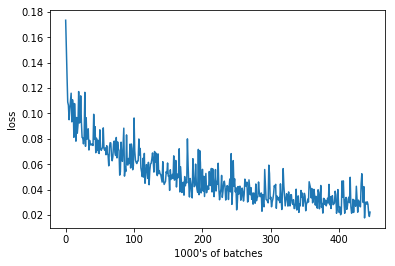

Epoch: 14, Batch: 50, Avg. Loss: 0.02617407413199544
43.46783137321472


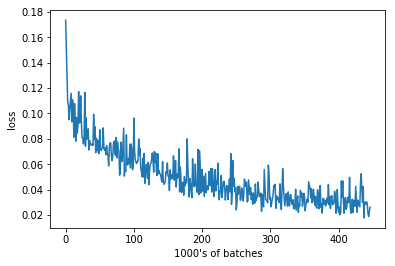

Epoch: 14, Batch: 60, Avg. Loss: 0.025647579692304134
41.44799065589905


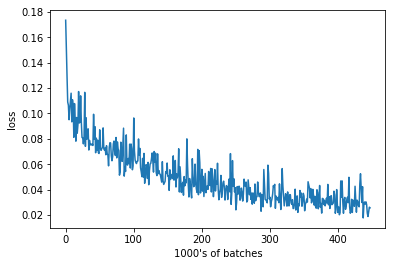

Epoch: 14, Batch: 70, Avg. Loss: 0.03195220837369561
41.184978723526


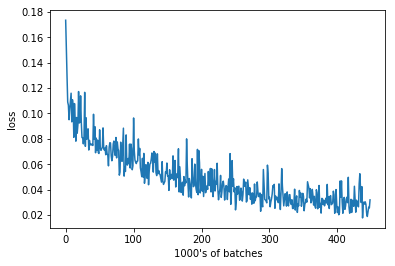

Epoch: 14, Batch: 80, Avg. Loss: 0.02403012914583087
42.31462740898132


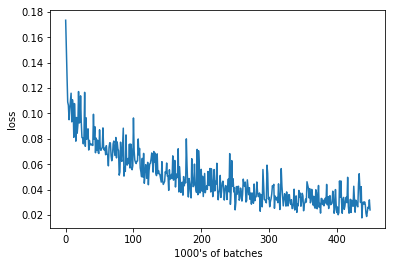

Epoch: 14, Batch: 90, Avg. Loss: 0.03240339979529381
41.53243923187256


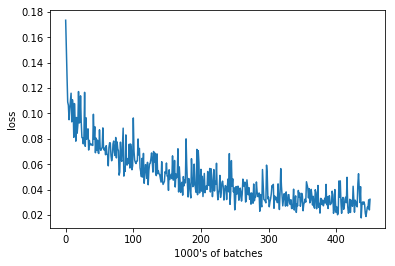

Epoch: 14, Batch: 100, Avg. Loss: 0.030638784728944303
43.54918575286865


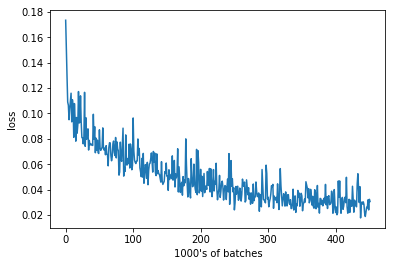

Epoch: 14, Batch: 110, Avg. Loss: 0.028943755943328143
41.84139800071716


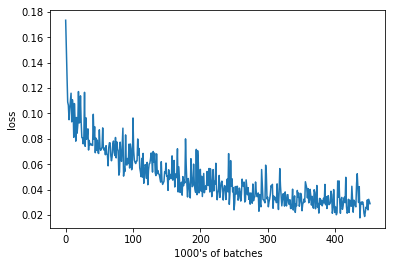

Epoch: 14, Batch: 120, Avg. Loss: 0.026649954821914436
41.36830520629883


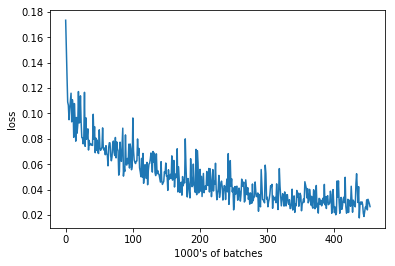

Epoch: 14, Batch: 130, Avg. Loss: 0.02446856377646327
41.40985941886902


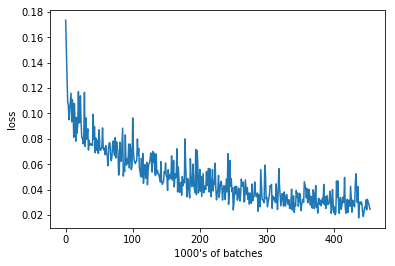

Epoch: 14, Batch: 140, Avg. Loss: 0.03505805376917124
41.54081702232361


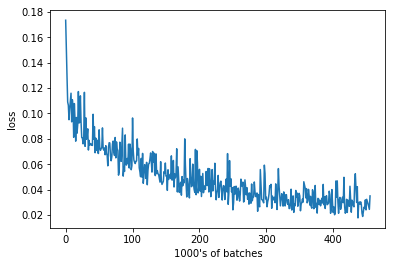

Epoch: 14, Batch: 150, Avg. Loss: 0.020671933889389038
42.51766562461853


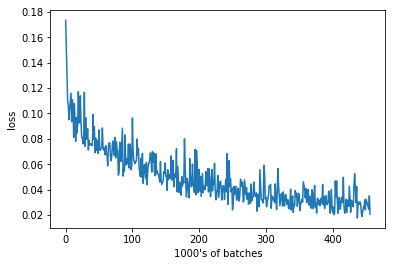

Epoch: 14, Batch: 160, Avg. Loss: 0.023794904910027982
41.36429691314697


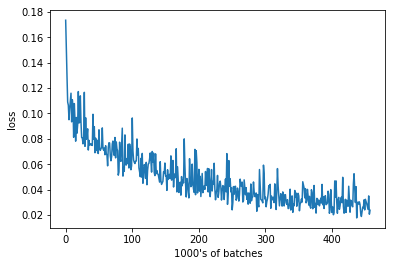

Epoch: 14, Batch: 170, Avg. Loss: 0.034231849014759064
41.395763635635376


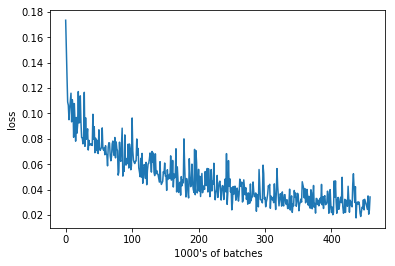

Epoch: 14, Batch: 180, Avg. Loss: 0.028888266626745464
41.47191119194031


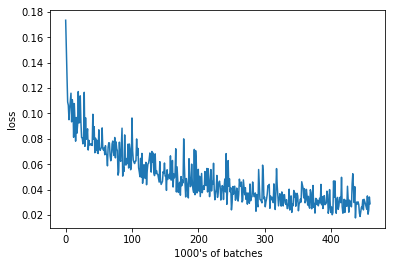

Epoch: 14, Batch: 190, Avg. Loss: 0.060392967984080316
41.1620135307312


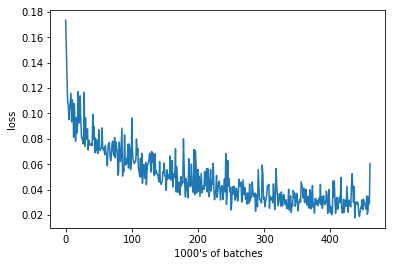

Epoch: 14, Batch: 200, Avg. Loss: 0.030914551578462124
42.68510890007019


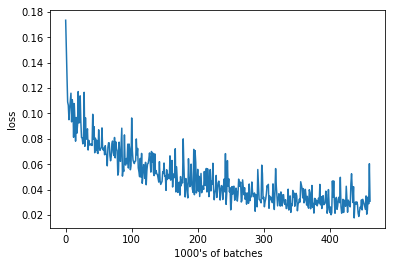

Epoch: 14, Batch: 210, Avg. Loss: 0.019922623038291933
41.37062120437622


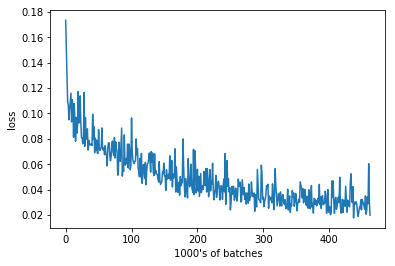

Epoch: 14, Batch: 220, Avg. Loss: 0.022418361995369195
41.05268144607544


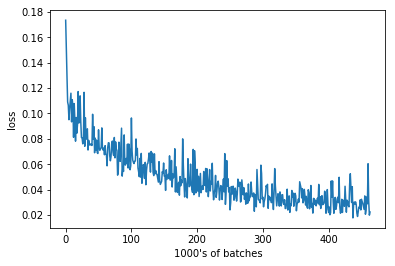

Epoch: 14, Batch: 230, Avg. Loss: 0.034389097895473245
41.16303253173828


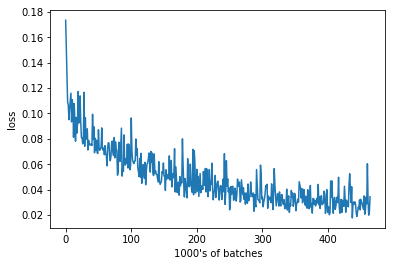

Epoch: 14, Batch: 240, Avg. Loss: 0.03719991436228156
42.90693736076355


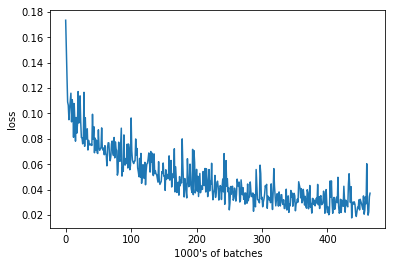

Epoch: 14, Batch: 250, Avg. Loss: 0.03665677551180124
41.412009477615356


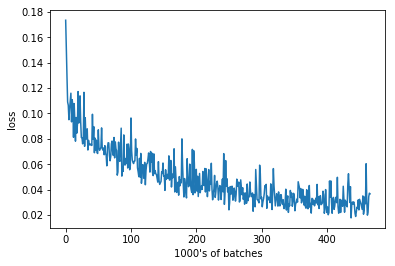

Epoch: 14, Batch: 260, Avg. Loss: 0.033403036370873454
41.591700315475464


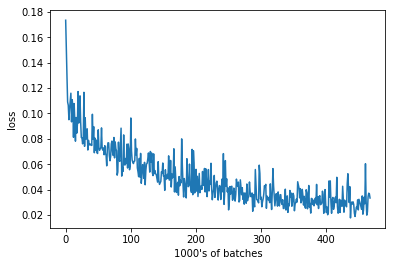

Epoch: 14, Batch: 270, Avg. Loss: 0.02287744777277112
41.353759765625


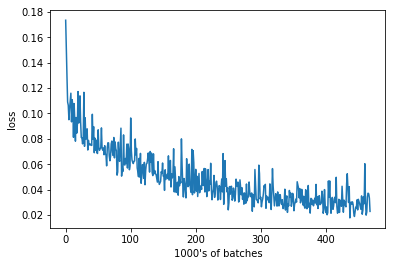

Epoch: 14, Batch: 280, Avg. Loss: 0.03851375924423337
41.005892515182495


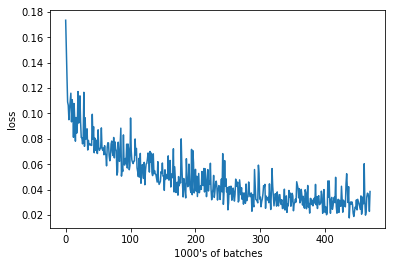

Epoch: 14, Batch: 290, Avg. Loss: 0.022586994618177415
42.52442407608032


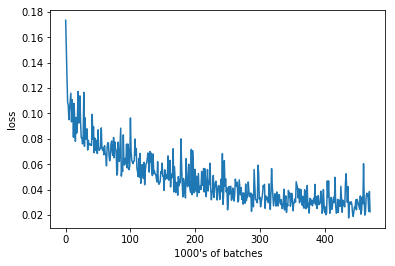

Epoch: 14, Batch: 300, Avg. Loss: 0.022541257180273534
41.138166427612305


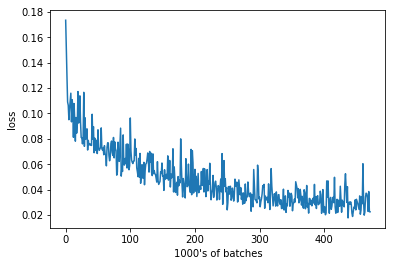

Epoch: 14, Batch: 310, Avg. Loss: 0.026383155677467584
41.16488289833069


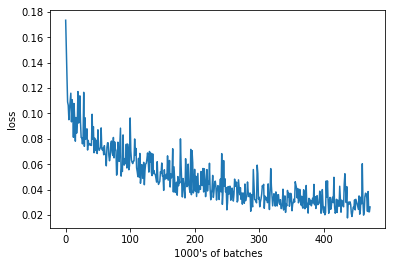

Epoch: 14, Batch: 320, Avg. Loss: 0.017856995202600957
41.08988666534424


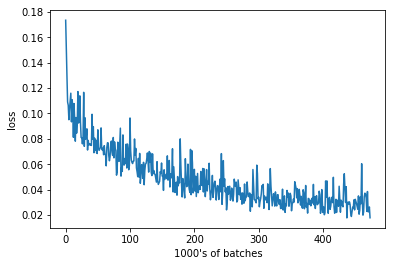

Epoch: 14, Batch: 330, Avg. Loss: 0.04973315512761474
40.8346266746521


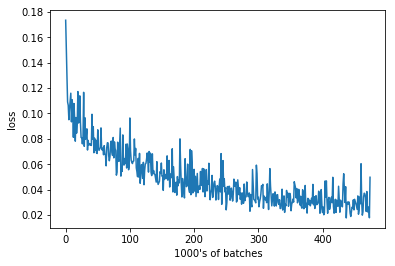

Epoch: 14, Batch: 340, Avg. Loss: 0.022269877372309566
42.50671410560608


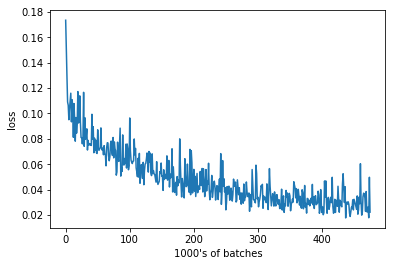

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 15, Batch: 10, Avg. Loss: 0.02392766289412975
46.72582125663757


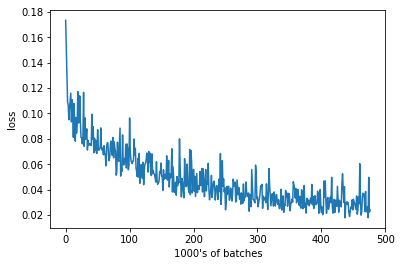

Epoch: 15, Batch: 20, Avg. Loss: 0.02812407584860921
42.211437463760376


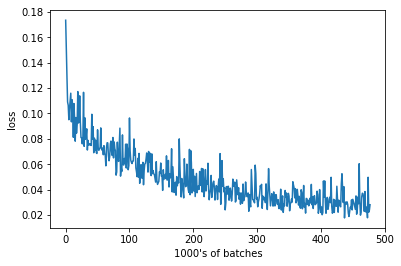

Epoch: 15, Batch: 30, Avg. Loss: 0.0222041480243206
42.73695993423462


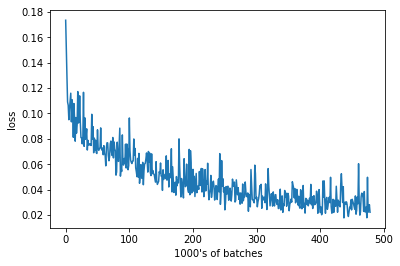

Epoch: 15, Batch: 40, Avg. Loss: 0.020909151434898375
43.03399300575256


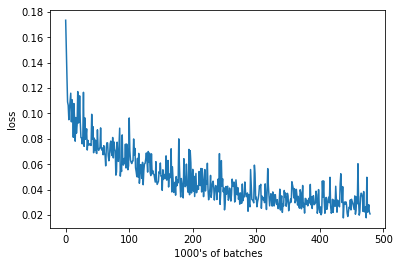

Epoch: 15, Batch: 50, Avg. Loss: 0.024371100030839442
41.6707284450531


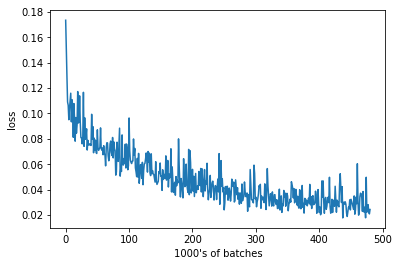

Epoch: 15, Batch: 60, Avg. Loss: 0.030595084838569164
41.53368425369263


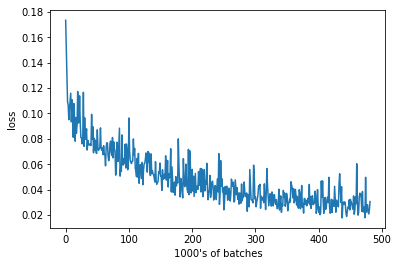

Epoch: 15, Batch: 70, Avg. Loss: 0.02411826392635703
41.36632323265076


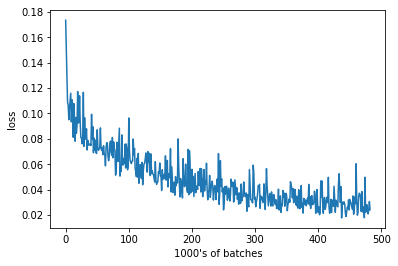

Epoch: 15, Batch: 80, Avg. Loss: 0.024717894662171603
41.71033596992493


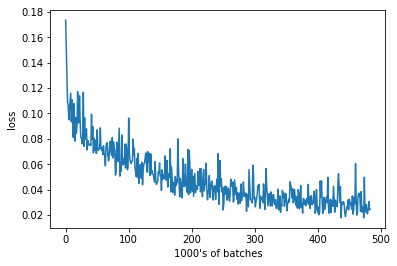

Epoch: 15, Batch: 90, Avg. Loss: 0.03155716359615326
43.34598112106323


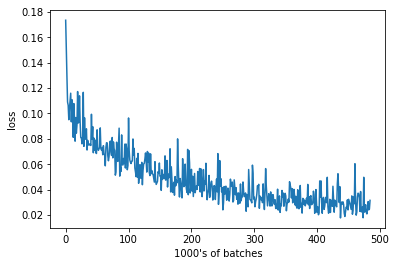

Epoch: 15, Batch: 100, Avg. Loss: 0.03277075458317995
41.33604621887207


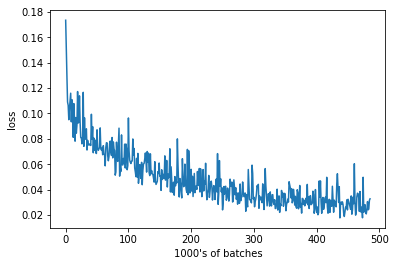

Epoch: 15, Batch: 110, Avg. Loss: 0.022922831121832132
41.137229442596436


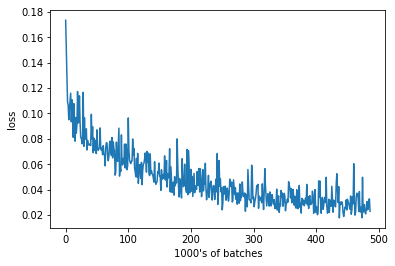

Epoch: 15, Batch: 120, Avg. Loss: 0.02433054829016328
41.15984582901001


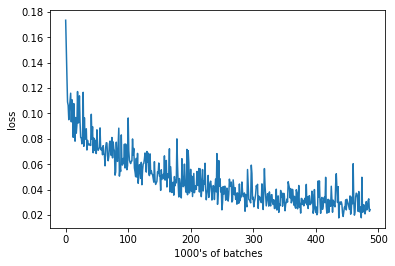

Epoch: 15, Batch: 130, Avg. Loss: 0.016992216743528844
41.73416495323181


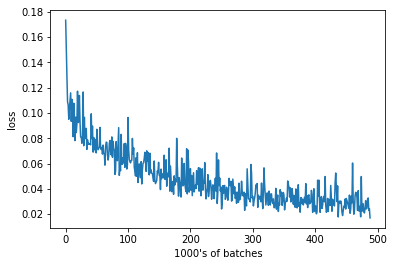

Epoch: 15, Batch: 140, Avg. Loss: 0.05084449965506792
43.20400381088257


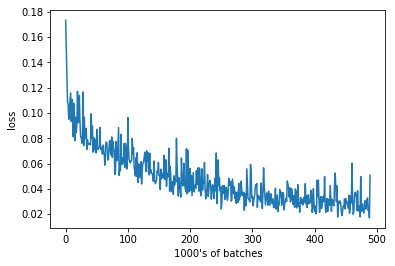

Epoch: 15, Batch: 150, Avg. Loss: 0.025048305559903384
41.07409119606018


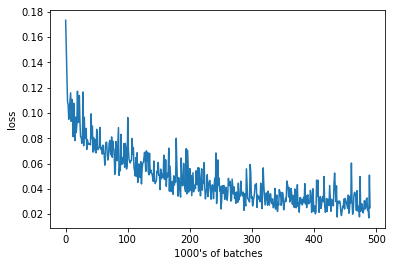

Epoch: 15, Batch: 160, Avg. Loss: 0.022562958300113678
41.2226996421814


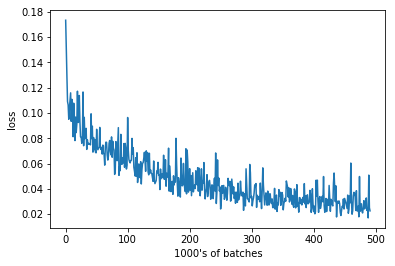

Epoch: 15, Batch: 170, Avg. Loss: 0.028030642960220575
41.1868212223053


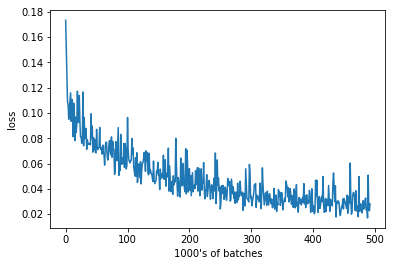

Epoch: 15, Batch: 180, Avg. Loss: 0.020282136648893355
43.11520028114319


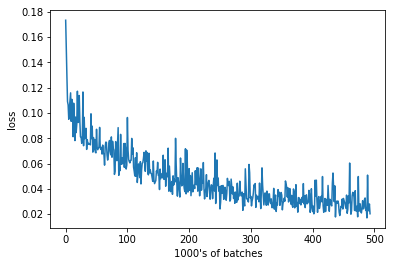

Epoch: 15, Batch: 190, Avg. Loss: 0.048066872730851175
41.42213821411133


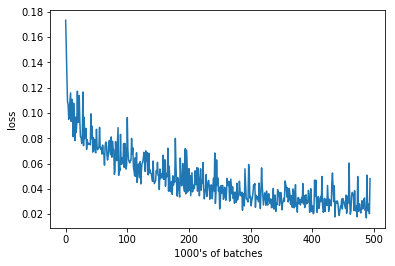

Epoch: 15, Batch: 200, Avg. Loss: 0.0317512484267354
41.728419065475464


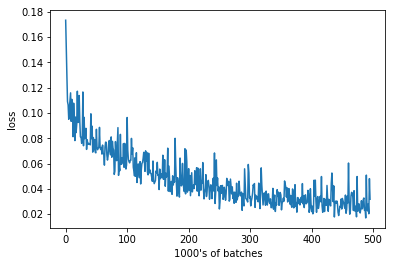

Epoch: 15, Batch: 210, Avg. Loss: 0.032039256393909456
41.61871671676636


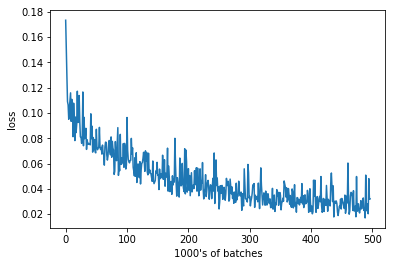

Epoch: 15, Batch: 220, Avg. Loss: 0.02470773383975029
41.156737089157104


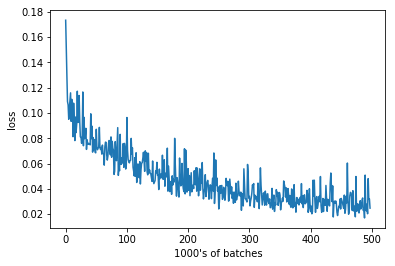

Epoch: 15, Batch: 230, Avg. Loss: 0.03840879146009683
42.61995792388916


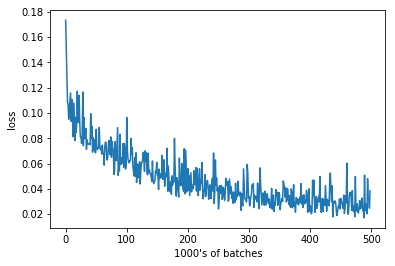

Epoch: 15, Batch: 240, Avg. Loss: 0.02822124045342207
41.291369676589966


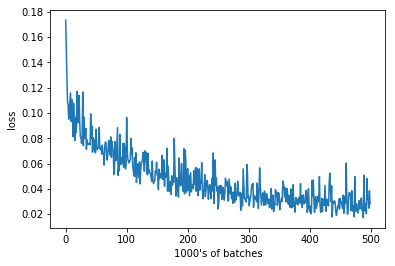

Epoch: 15, Batch: 250, Avg. Loss: 0.039076327532529834
42.08497881889343


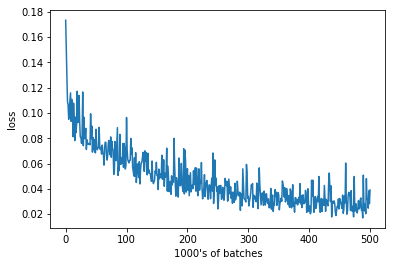

Epoch: 15, Batch: 260, Avg. Loss: 0.02887562531977892
41.589895248413086


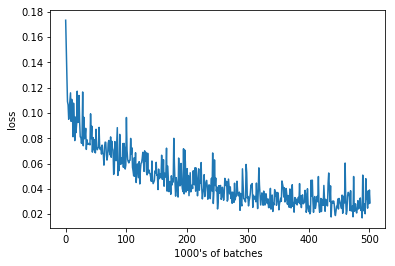

Epoch: 15, Batch: 270, Avg. Loss: 0.03406834490597248
40.88396763801575


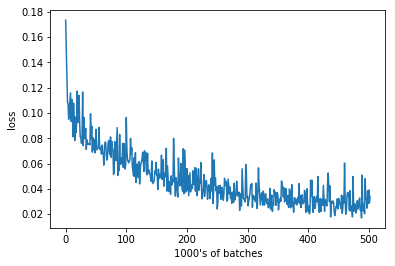

Epoch: 15, Batch: 280, Avg. Loss: 0.020595535542815922
42.68497824668884


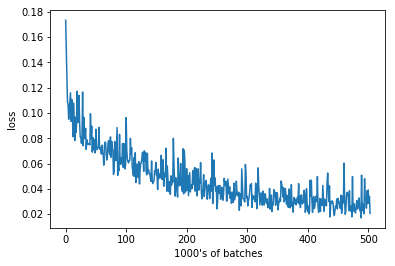

Epoch: 15, Batch: 290, Avg. Loss: 0.027152216341346503
41.24146747589111


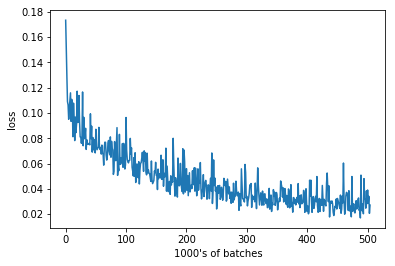

Epoch: 15, Batch: 300, Avg. Loss: 0.02497780239209533
40.786543130874634


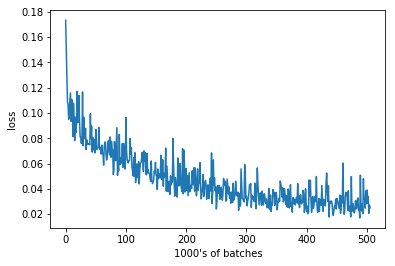

Epoch: 15, Batch: 310, Avg. Loss: 0.041476336866617204
41.131590604782104


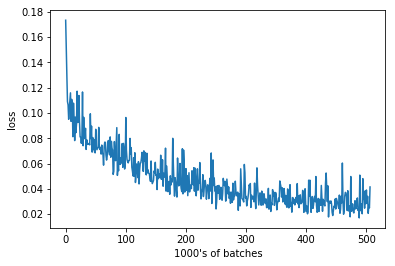

Epoch: 15, Batch: 320, Avg. Loss: 0.030519461259245872
41.20871925354004


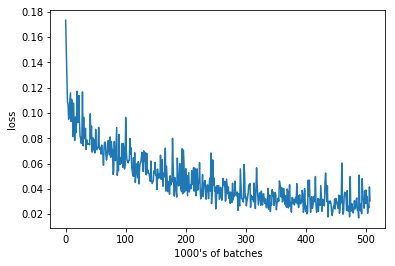

Epoch: 15, Batch: 330, Avg. Loss: 0.024908614251762627
42.80143737792969


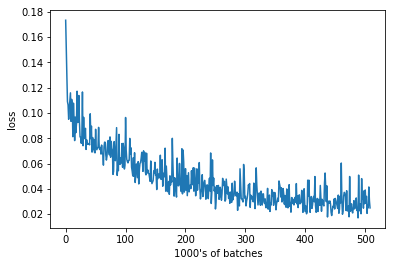

Epoch: 15, Batch: 340, Avg. Loss: 0.02714463146403432
40.5197868347168


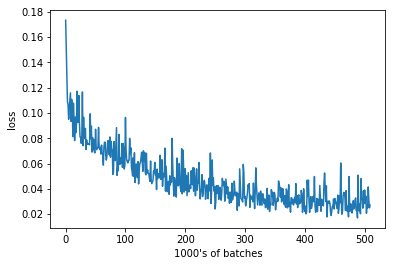

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 16, Batch: 10, Avg. Loss: 0.020125126000493765
48.09294295310974


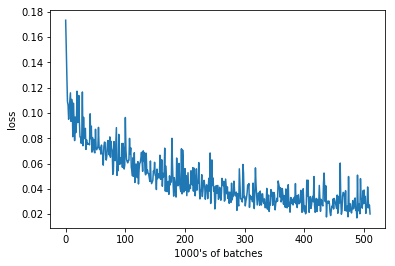

Epoch: 16, Batch: 20, Avg. Loss: 0.01989124221727252
42.51115655899048


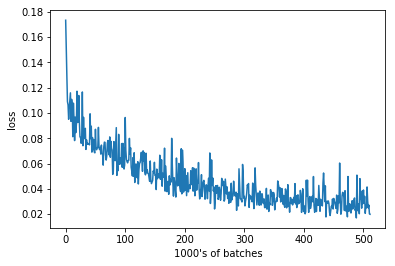

Epoch: 16, Batch: 30, Avg. Loss: 0.03427337585017085
43.82055974006653


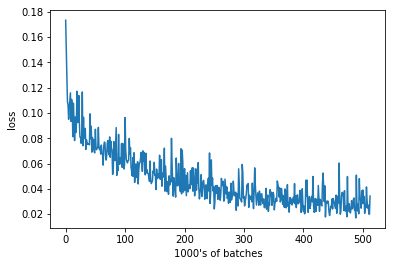

Epoch: 16, Batch: 40, Avg. Loss: 0.040784177370369434
41.66269779205322


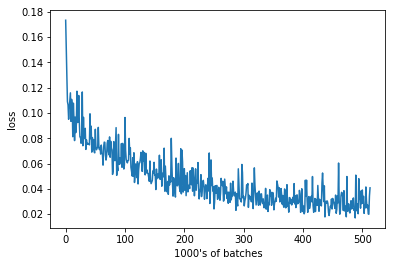

Epoch: 16, Batch: 50, Avg. Loss: 0.02278057662770152
41.45323991775513


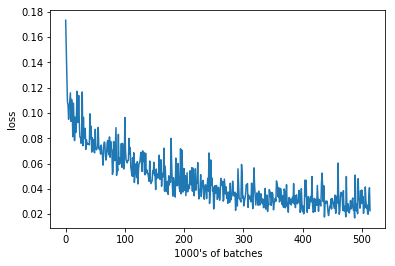

Epoch: 16, Batch: 60, Avg. Loss: 0.025415047910064457
41.21842861175537


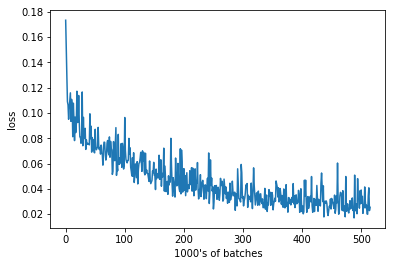

Epoch: 16, Batch: 70, Avg. Loss: 0.04781688554212451
41.40938067436218


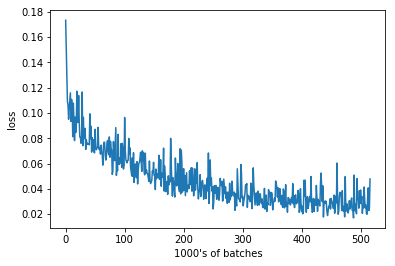

Epoch: 16, Batch: 80, Avg. Loss: 0.023795504961162804
44.11243987083435


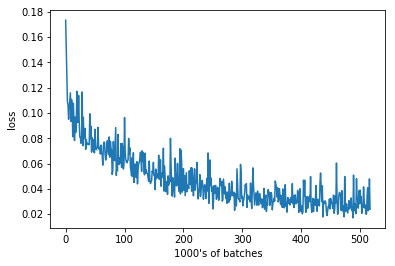

Epoch: 16, Batch: 90, Avg. Loss: 0.01831932654604316
41.11076021194458


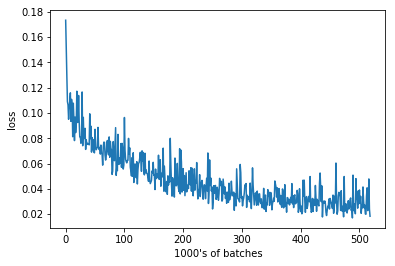

Epoch: 16, Batch: 100, Avg. Loss: 0.023412293288856745
41.36429309844971


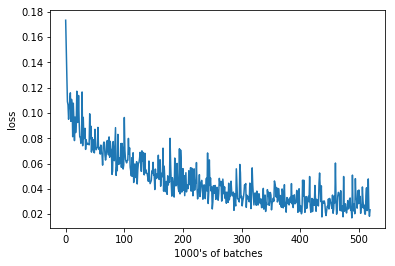

Epoch: 16, Batch: 110, Avg. Loss: 0.03439165521413088
41.25072002410889


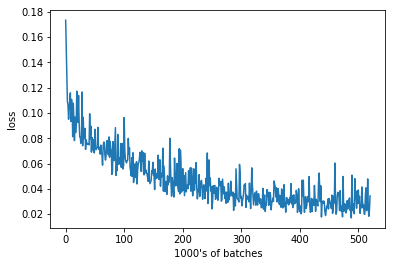

Epoch: 16, Batch: 120, Avg. Loss: 0.0180432110093534
43.405099391937256


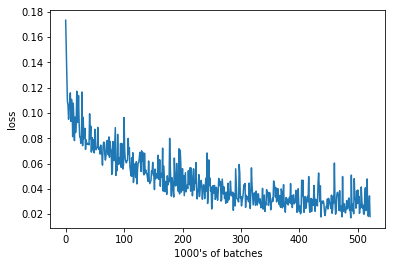

Epoch: 16, Batch: 130, Avg. Loss: 0.022974468860775234
41.4463849067688


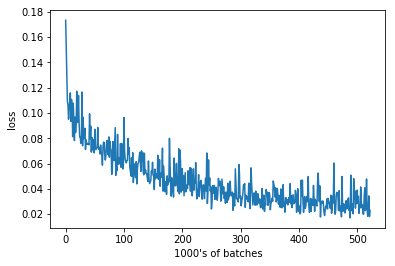

Epoch: 16, Batch: 140, Avg. Loss: 0.018239557184278964
41.729532957077026


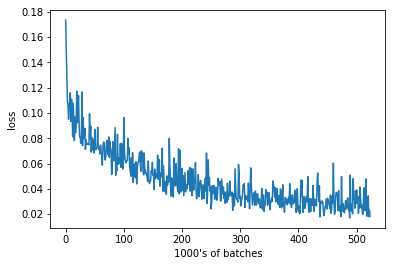

Epoch: 16, Batch: 150, Avg. Loss: 0.029349989164620637
41.29465842247009


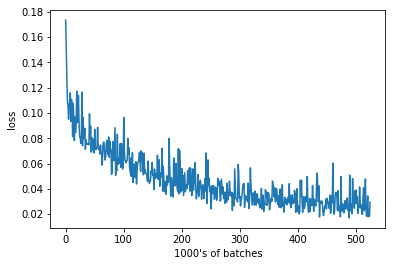

Epoch: 16, Batch: 160, Avg. Loss: 0.03494619810953736
41.1685585975647


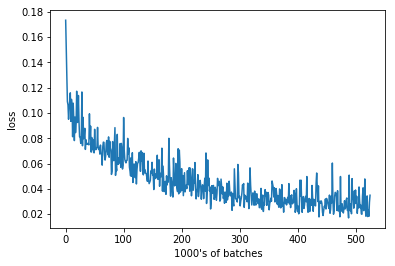

Epoch: 16, Batch: 170, Avg. Loss: 0.02592621985822916
42.27290177345276


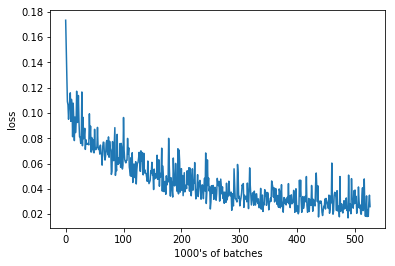

Epoch: 16, Batch: 180, Avg. Loss: 0.03748283460736275
41.018462896347046


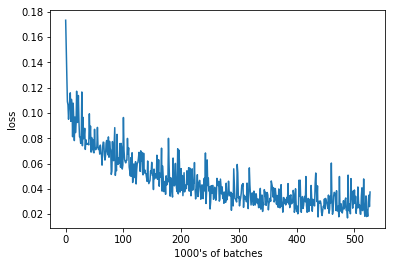

Epoch: 16, Batch: 190, Avg. Loss: 0.03408689983189106
41.29123115539551


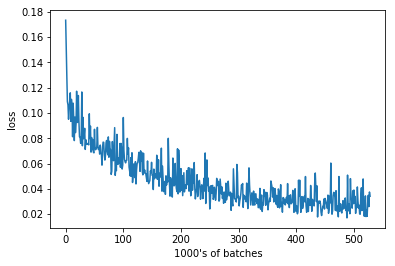

Epoch: 16, Batch: 200, Avg. Loss: 0.026544511318206787
41.47442102432251


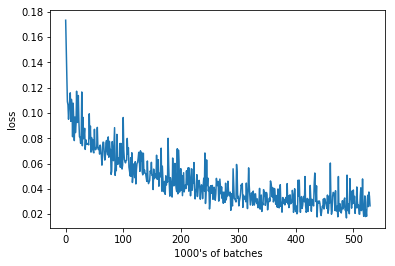

Epoch: 16, Batch: 210, Avg. Loss: 0.01895196009427309
41.08461260795593


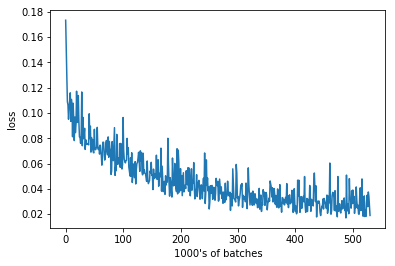

Epoch: 16, Batch: 220, Avg. Loss: 0.020396406669169663
42.78311896324158


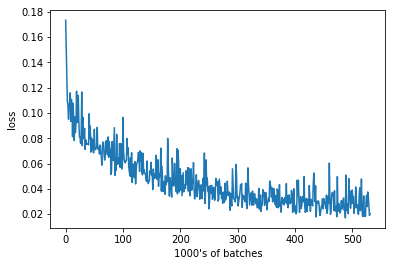

Epoch: 16, Batch: 230, Avg. Loss: 0.02553374506533146
41.23963737487793


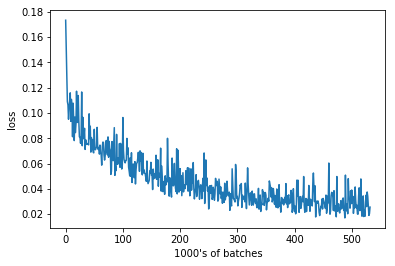

Epoch: 16, Batch: 240, Avg. Loss: 0.016620929632335902
40.97674775123596


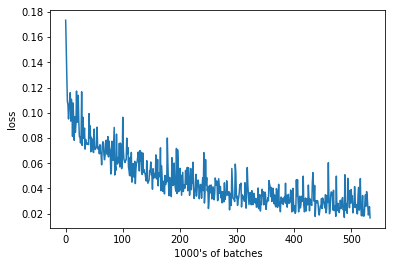

Epoch: 16, Batch: 250, Avg. Loss: 0.018669156543910503
41.58689785003662


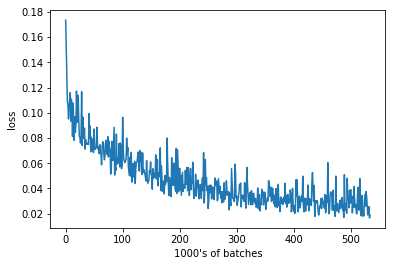

Epoch: 16, Batch: 260, Avg. Loss: 0.029287838470190765
40.88250803947449


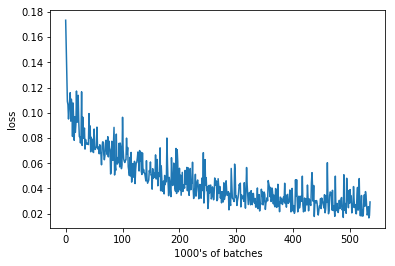

Epoch: 16, Batch: 270, Avg. Loss: 0.02276992714032531
42.84278059005737


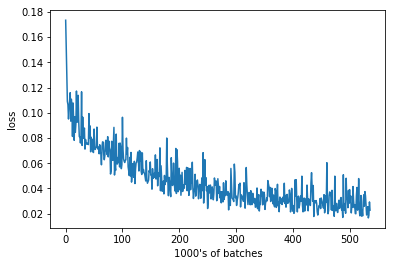

Epoch: 16, Batch: 280, Avg. Loss: 0.02339606424793601
41.44898223876953


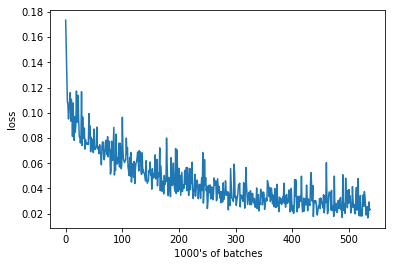

Epoch: 16, Batch: 290, Avg. Loss: 0.03507171906530857
40.84640121459961


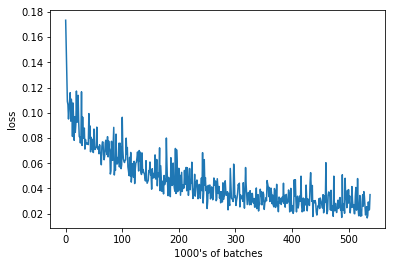

Epoch: 16, Batch: 300, Avg. Loss: 0.02105606338009238
40.90512824058533


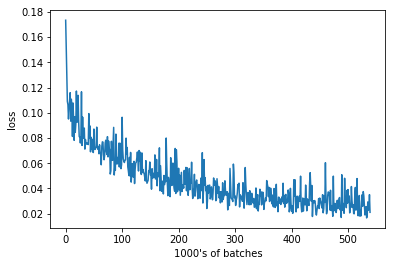

Epoch: 16, Batch: 310, Avg. Loss: 0.023400115966796874
41.32427477836609


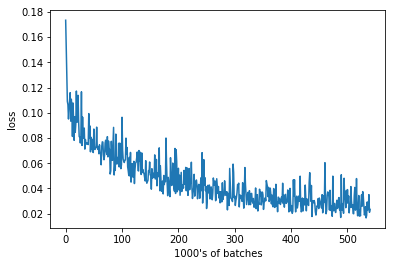

Epoch: 16, Batch: 320, Avg. Loss: 0.017714845947921276
42.65309715270996


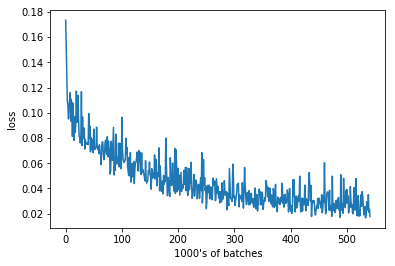

Epoch: 16, Batch: 330, Avg. Loss: 0.01513285906985402
41.170401096343994


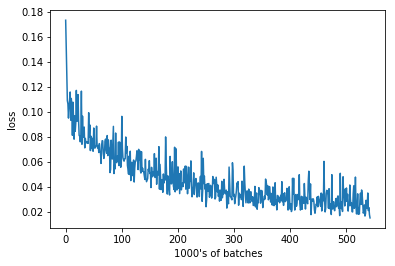

Epoch: 16, Batch: 340, Avg. Loss: 0.02813673410564661
41.270530223846436


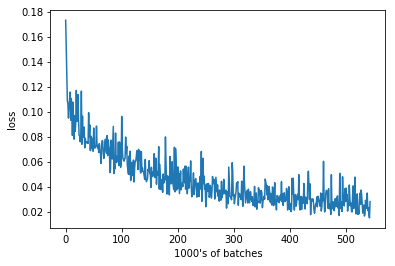

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 17, Batch: 10, Avg. Loss: 0.026154515985399484
47.50913190841675


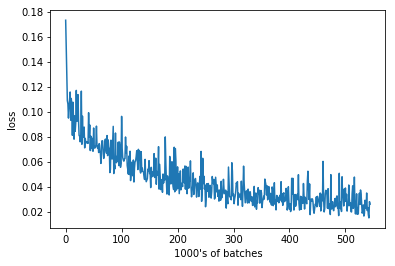

Epoch: 17, Batch: 20, Avg. Loss: 0.01901404382660985
44.39767360687256


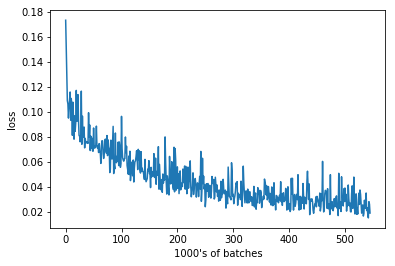

Epoch: 17, Batch: 30, Avg. Loss: 0.03151102215051651
41.743980407714844


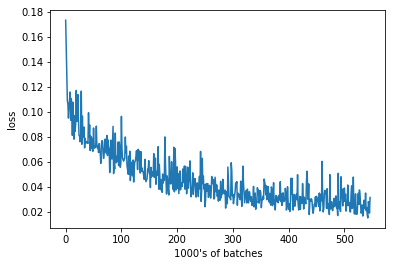

Epoch: 17, Batch: 40, Avg. Loss: 0.021377053391188384
41.706326961517334


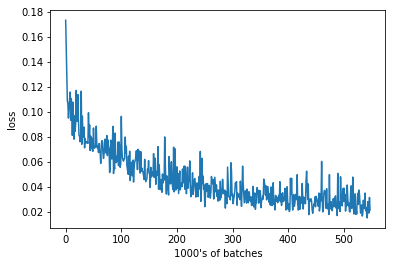

Epoch: 17, Batch: 50, Avg. Loss: 0.021711601316928862
41.714598655700684


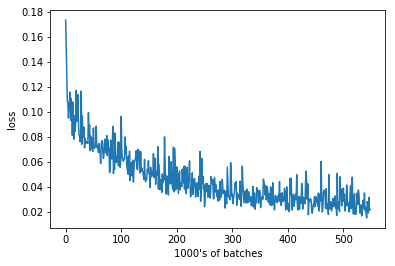

Epoch: 17, Batch: 60, Avg. Loss: 0.022428132593631744
42.841835498809814


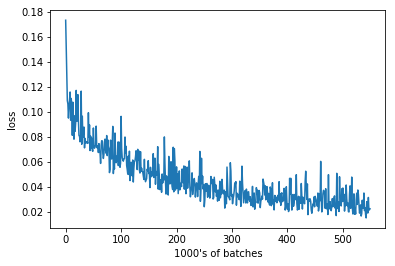

Epoch: 17, Batch: 70, Avg. Loss: 0.02951685069128871
41.493128538131714


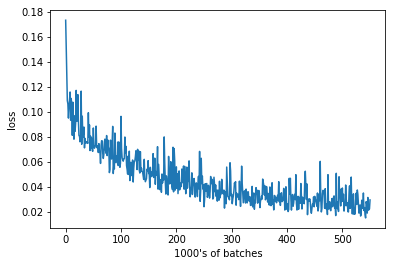

Epoch: 17, Batch: 80, Avg. Loss: 0.02419446436688304
41.68279194831848


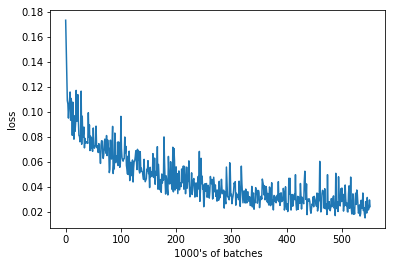

Epoch: 17, Batch: 90, Avg. Loss: 0.022609839029610158
41.835073947906494


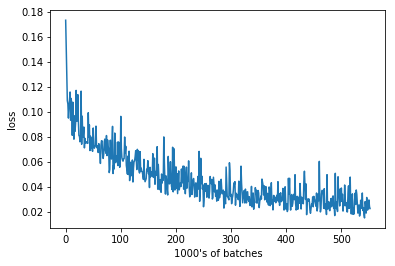

Epoch: 17, Batch: 100, Avg. Loss: 0.029325599037110805
41.678189277648926


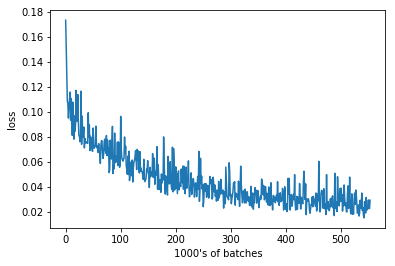

Epoch: 17, Batch: 110, Avg. Loss: 0.02441009823232889
43.67865538597107


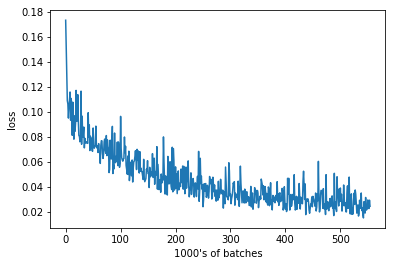

Epoch: 17, Batch: 120, Avg. Loss: 0.01611930625513196
41.62132239341736


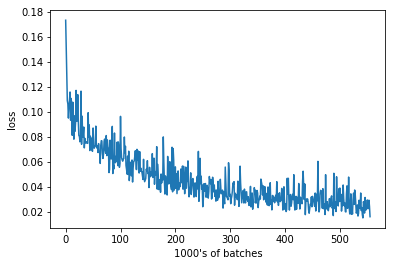

Epoch: 17, Batch: 130, Avg. Loss: 0.020282750856131314
42.65230083465576


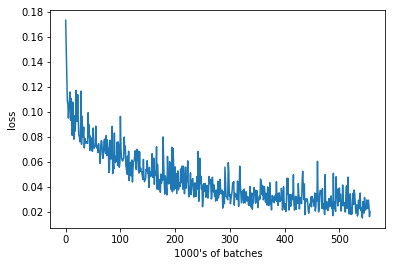

Epoch: 17, Batch: 140, Avg. Loss: 0.015671338886022568
41.811787366867065


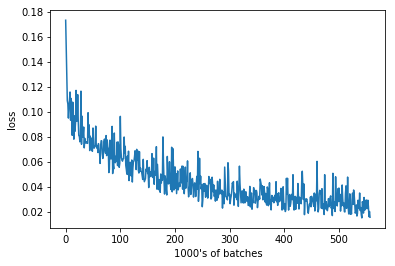

Epoch: 17, Batch: 150, Avg. Loss: 0.020264021679759027
41.77526617050171


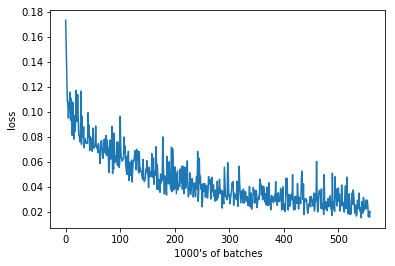

Epoch: 17, Batch: 160, Avg. Loss: 0.04891779758036137
43.621527910232544


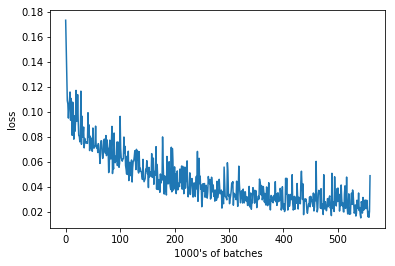

Epoch: 17, Batch: 170, Avg. Loss: 0.014544914290308953
41.4320912361145


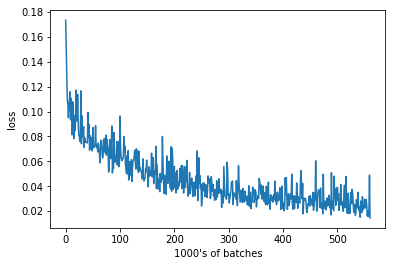

Epoch: 17, Batch: 180, Avg. Loss: 0.019844347052276133
41.43232011795044


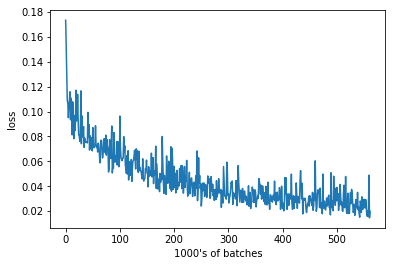

Epoch: 17, Batch: 190, Avg. Loss: 0.02765542957931757
41.98491454124451


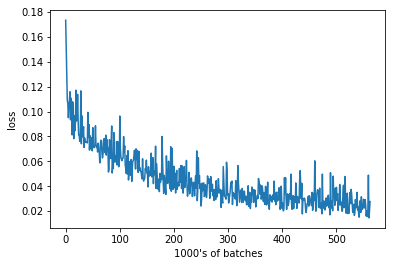

Epoch: 17, Batch: 200, Avg. Loss: 0.018227569991722703
42.059388875961304


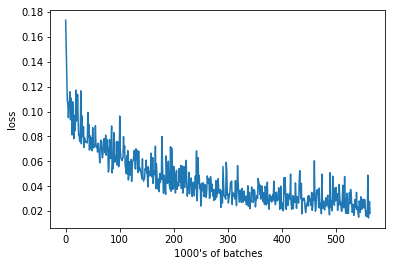

Epoch: 17, Batch: 210, Avg. Loss: 0.03200664706528187
43.95514392852783


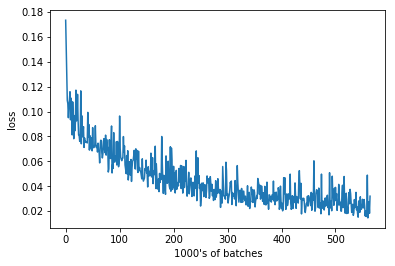

Epoch: 17, Batch: 220, Avg. Loss: 0.019739971775561572
41.47951602935791


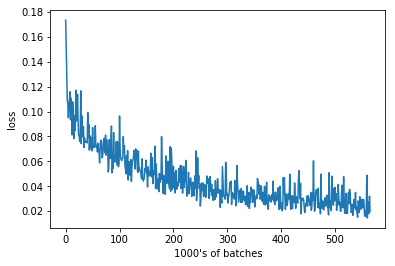

Epoch: 17, Batch: 230, Avg. Loss: 0.018073647376149894
41.37694311141968


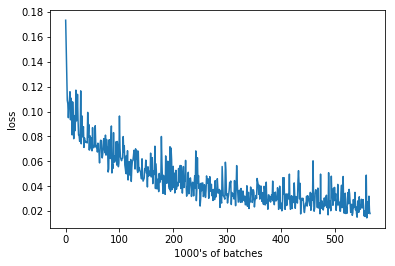

Epoch: 17, Batch: 240, Avg. Loss: 0.0222116872202605
41.450902700424194


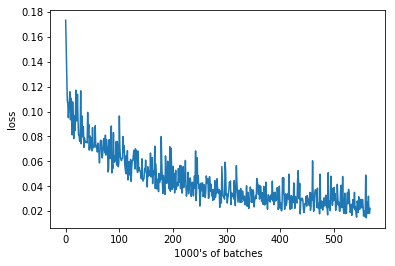

Epoch: 17, Batch: 250, Avg. Loss: 0.043614350352436305
41.82666254043579


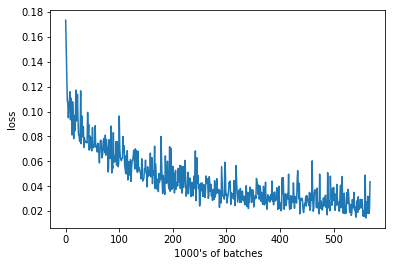

Epoch: 17, Batch: 260, Avg. Loss: 0.026900457311421634
43.66760540008545


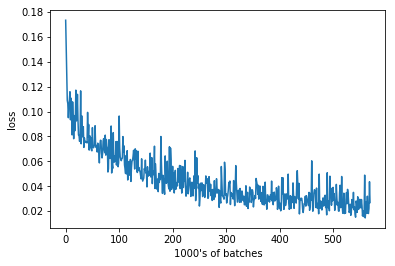

Epoch: 17, Batch: 270, Avg. Loss: 0.03080976428464055
41.318745851516724


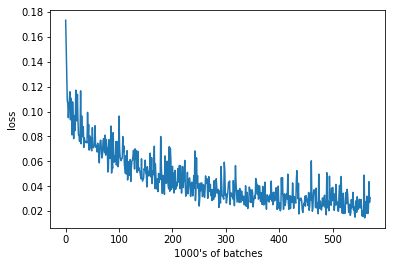

Epoch: 17, Batch: 280, Avg. Loss: 0.029290051013231278
41.34416437149048


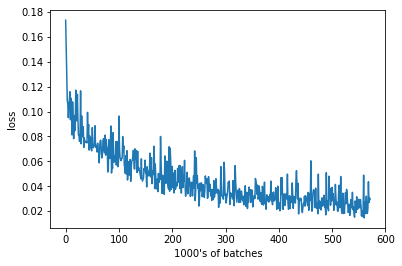

Epoch: 17, Batch: 290, Avg. Loss: 0.029480311460793017
41.52228617668152


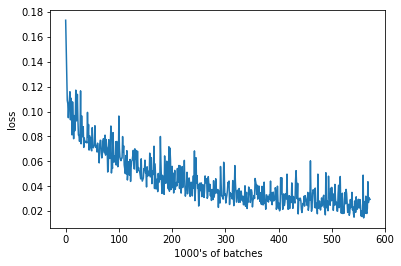

Epoch: 17, Batch: 300, Avg. Loss: 0.03923320909962058
43.88986825942993


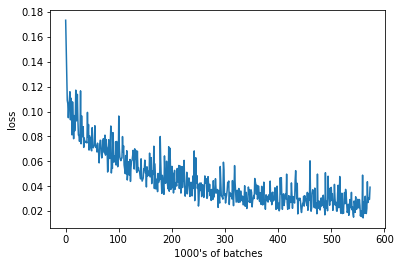

Epoch: 17, Batch: 310, Avg. Loss: 0.021151941549032927
41.15797734260559


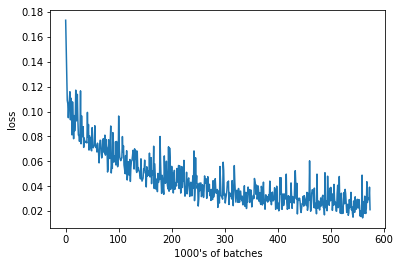

Epoch: 17, Batch: 320, Avg. Loss: 0.03455373151227832
40.90439987182617


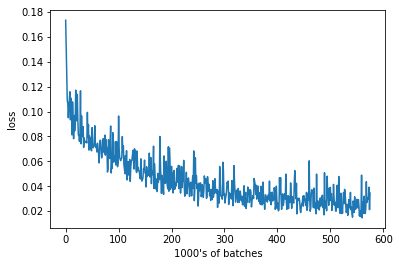

Epoch: 17, Batch: 330, Avg. Loss: 0.01732196444645524
41.18280243873596


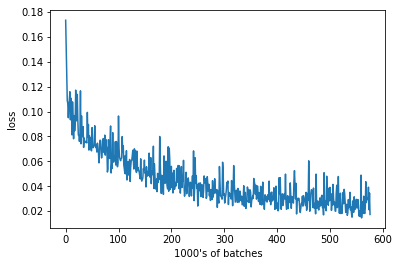

Epoch: 17, Batch: 340, Avg. Loss: 0.018989121355116368
41.262460231781006


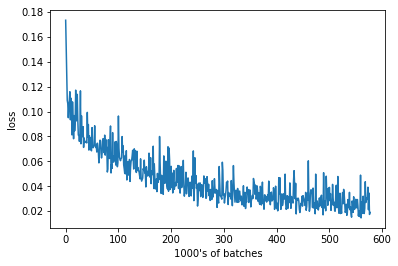

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 18, Batch: 10, Avg. Loss: 0.0212573385797441
47.31265091896057


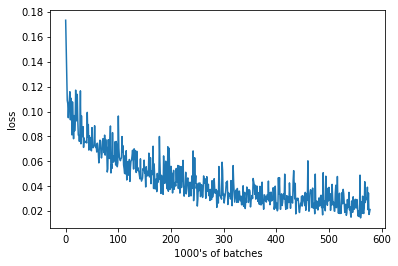

Epoch: 18, Batch: 20, Avg. Loss: 0.030743623850867152
41.760051012039185


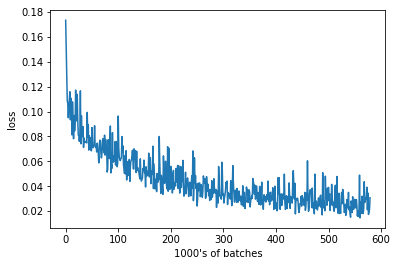

Epoch: 18, Batch: 30, Avg. Loss: 0.017633884586393832
41.43629431724548


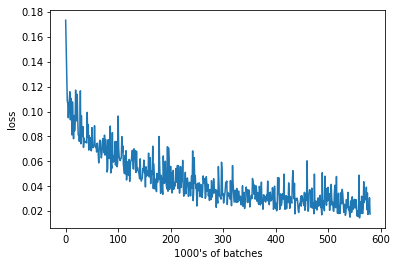

Epoch: 18, Batch: 40, Avg. Loss: 0.026285211183130743
41.49734377861023


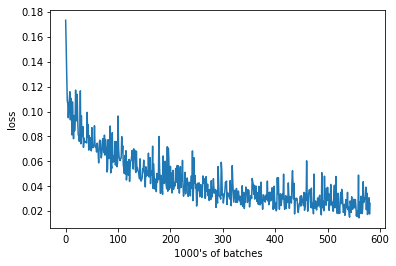

Epoch: 18, Batch: 50, Avg. Loss: 0.028118881303817032
43.59360432624817


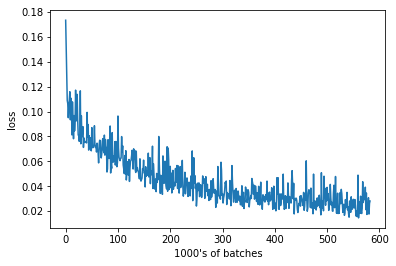

Epoch: 18, Batch: 60, Avg. Loss: 0.024351694714277984
41.73550462722778


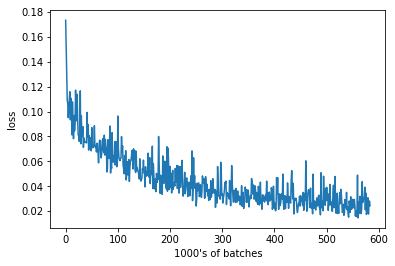

Epoch: 18, Batch: 70, Avg. Loss: 0.02582947527989745
41.93319034576416


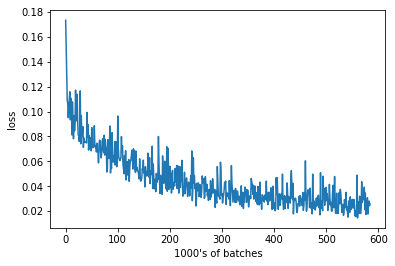

Epoch: 18, Batch: 80, Avg. Loss: 0.017290347162634133
41.61201286315918


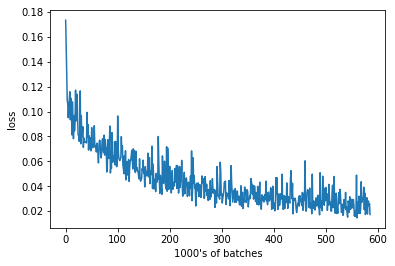

Epoch: 18, Batch: 90, Avg. Loss: 0.020002055540680887
41.61370062828064


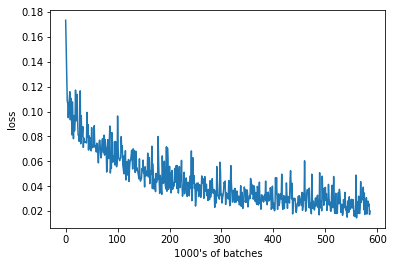

Epoch: 18, Batch: 100, Avg. Loss: 0.019949099607765676
43.34321999549866


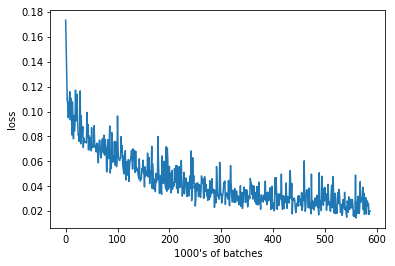

Epoch: 18, Batch: 110, Avg. Loss: 0.017551557440310717
41.25630807876587


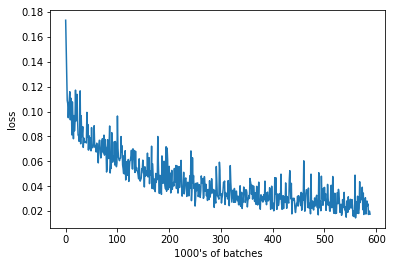

Epoch: 18, Batch: 120, Avg. Loss: 0.022161839157342912
41.47798252105713


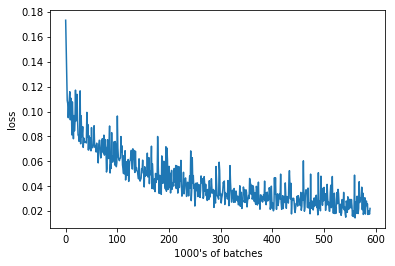

Epoch: 18, Batch: 130, Avg. Loss: 0.032425012718886134
41.60327482223511


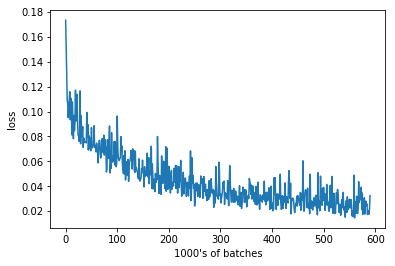

Epoch: 18, Batch: 140, Avg. Loss: 0.023979679122567175
42.654348373413086


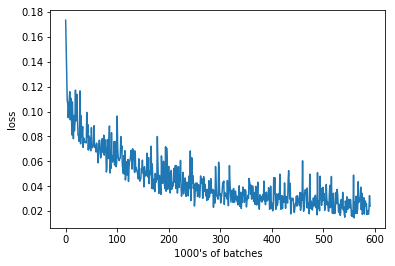

Epoch: 18, Batch: 150, Avg. Loss: 0.018910206388682127
41.85621619224548


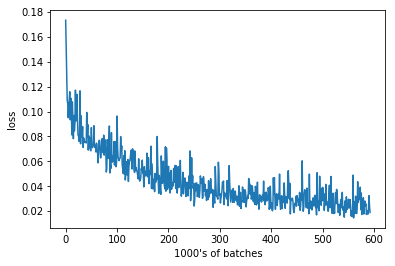

Epoch: 18, Batch: 160, Avg. Loss: 0.01745471702888608
41.1609582901001


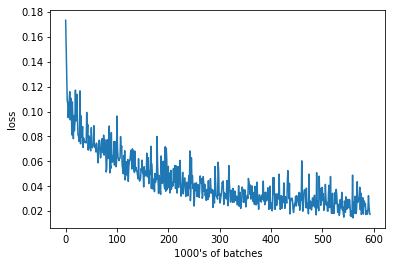

Epoch: 18, Batch: 170, Avg. Loss: 0.0158793767914176
41.475279331207275


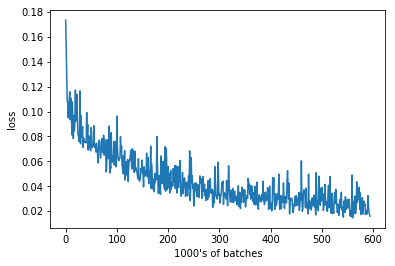

Epoch: 18, Batch: 180, Avg. Loss: 0.023376199696213008
41.32587027549744


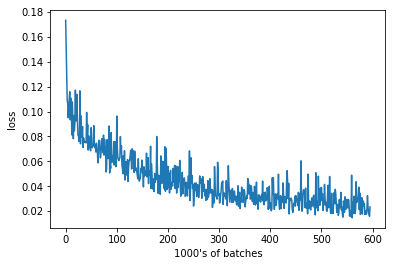

Epoch: 18, Batch: 190, Avg. Loss: 0.024828293826431036
43.35262417793274


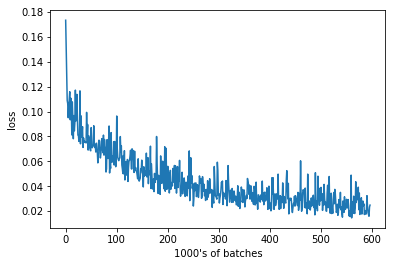

Epoch: 18, Batch: 200, Avg. Loss: 0.02079796763136983
41.127702713012695


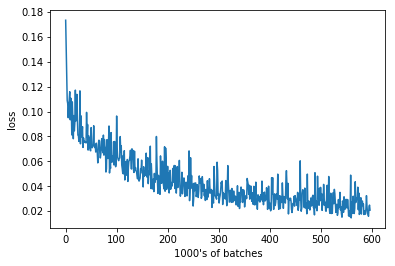

Epoch: 18, Batch: 210, Avg. Loss: 0.022245104797184466
41.65156149864197


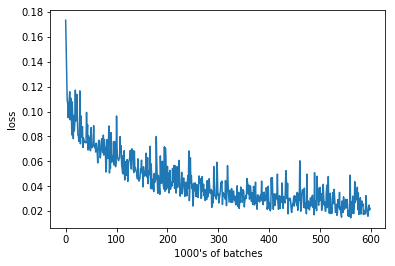

Epoch: 18, Batch: 220, Avg. Loss: 0.024744524713605644
41.106653690338135


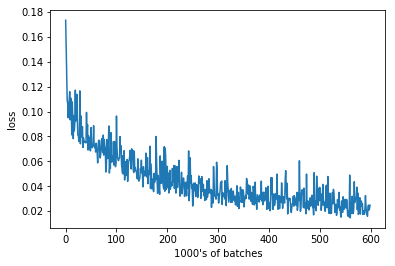

Epoch: 18, Batch: 230, Avg. Loss: 0.030130814481526613
41.56048250198364


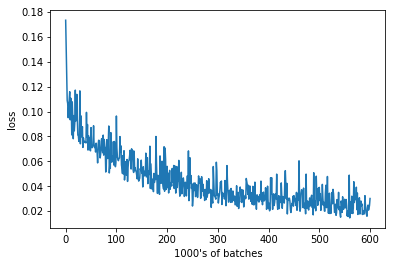

Epoch: 18, Batch: 240, Avg. Loss: 0.016682164371013643
43.594430923461914


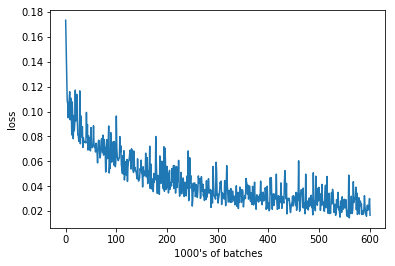

Epoch: 18, Batch: 250, Avg. Loss: 0.02152469214051962
40.925471782684326


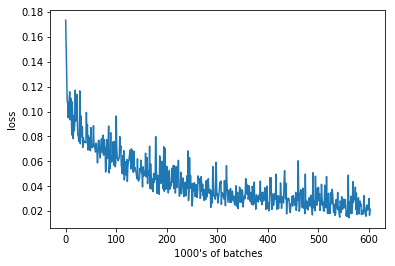

Epoch: 18, Batch: 260, Avg. Loss: 0.019583819340914486
41.38102650642395


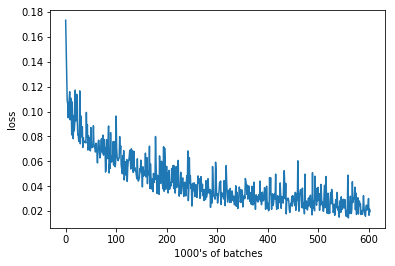

Epoch: 18, Batch: 270, Avg. Loss: 0.020274351071566343
41.51908040046692


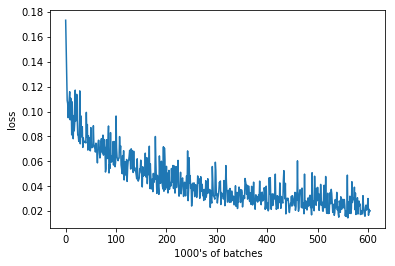

Epoch: 18, Batch: 280, Avg. Loss: 0.02334786979481578
41.0814003944397


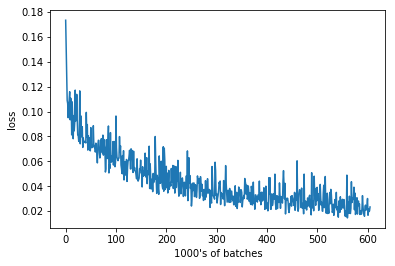

Epoch: 18, Batch: 290, Avg. Loss: 0.029885404370725156
43.64145565032959


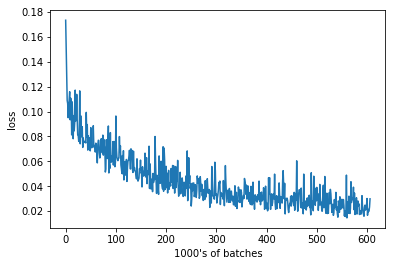

Epoch: 18, Batch: 300, Avg. Loss: 0.031020390149205924
41.919865131378174


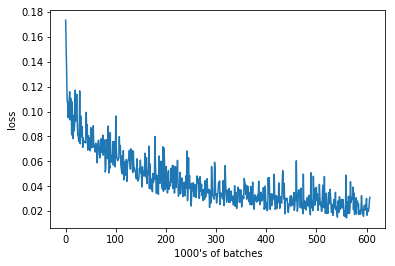

Epoch: 18, Batch: 310, Avg. Loss: 0.01850726092234254
41.264798641204834


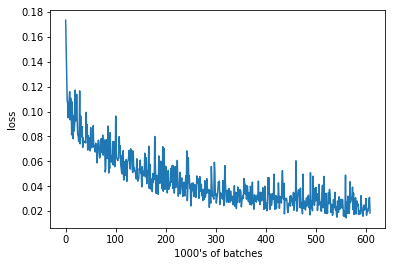

Epoch: 18, Batch: 320, Avg. Loss: 0.02434040643274784
41.32719898223877


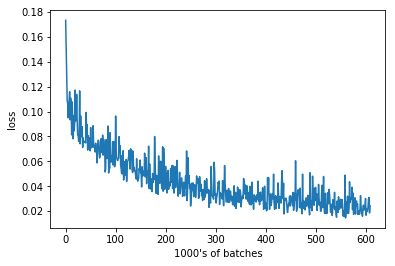

Epoch: 18, Batch: 330, Avg. Loss: 0.02104791412129998
41.32244873046875


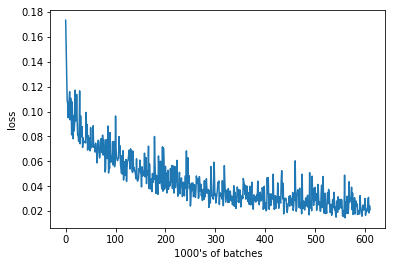

Epoch: 18, Batch: 340, Avg. Loss: 0.03051855256780982
43.04837679862976


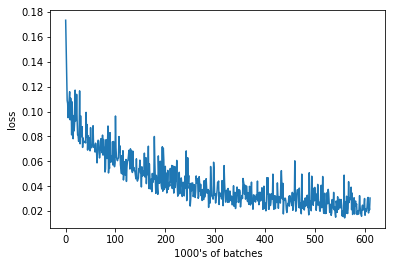

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 19, Batch: 10, Avg. Loss: 0.0248636475764215
47.705416440963745


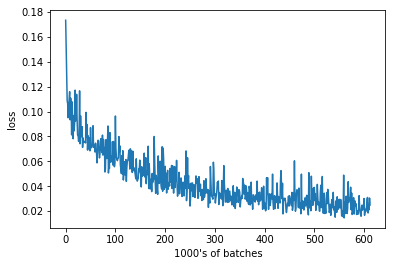

Epoch: 19, Batch: 20, Avg. Loss: 0.015947288367897272
41.78978395462036


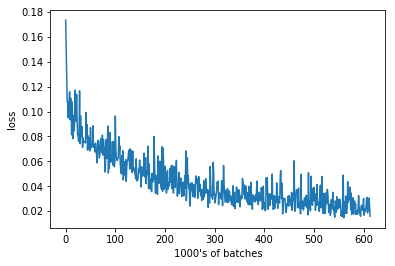

Epoch: 19, Batch: 30, Avg. Loss: 0.016294260509312153
41.470131635665894


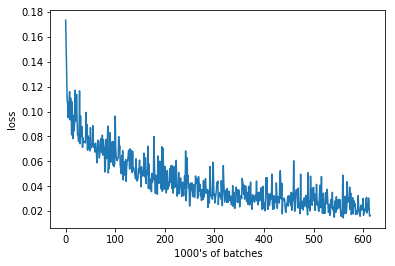

Epoch: 19, Batch: 40, Avg. Loss: 0.02297856854274869
43.622278451919556


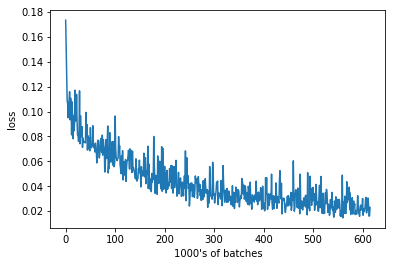

Epoch: 19, Batch: 50, Avg. Loss: 0.016571724135428668
42.20904898643494


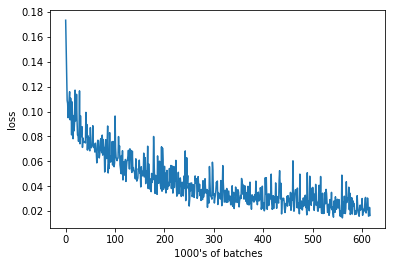

Epoch: 19, Batch: 60, Avg. Loss: 0.022437639348208905
41.33264350891113


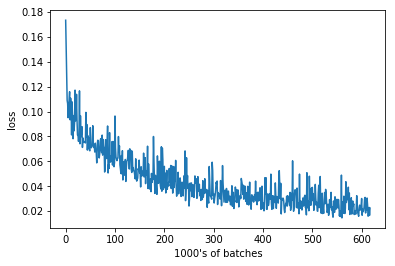

Epoch: 19, Batch: 70, Avg. Loss: 0.02858270313590765
41.63212513923645


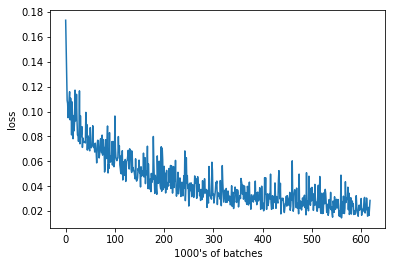

Epoch: 19, Batch: 80, Avg. Loss: 0.017724132630974054
43.38287281990051


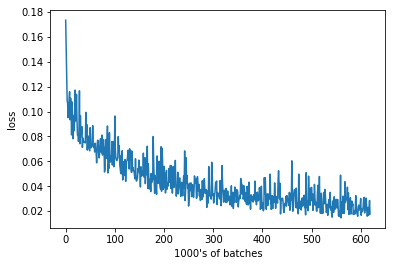

Epoch: 19, Batch: 90, Avg. Loss: 0.020194592699408532
41.53724980354309


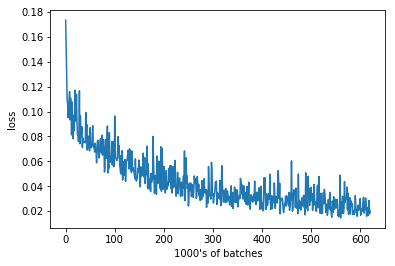

Epoch: 19, Batch: 100, Avg. Loss: 0.02167777381837368
42.172563791275024


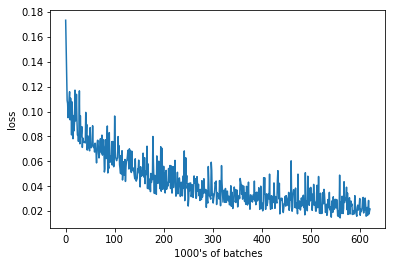

Epoch: 19, Batch: 110, Avg. Loss: 0.02391336103901267
41.220691204071045


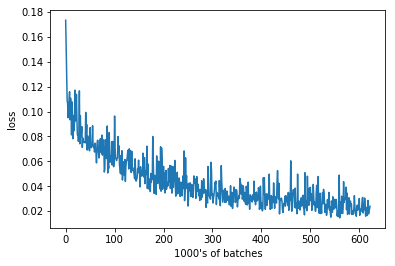

Epoch: 19, Batch: 120, Avg. Loss: 0.025629029795527457
41.337372064590454


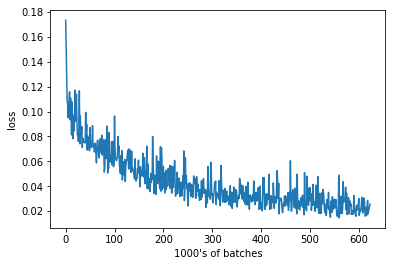

Epoch: 19, Batch: 130, Avg. Loss: 0.01687750923447311
43.26631259918213


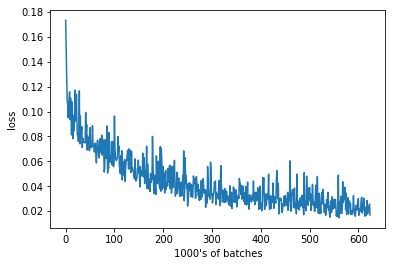

Epoch: 19, Batch: 140, Avg. Loss: 0.027088793087750675
41.66510820388794


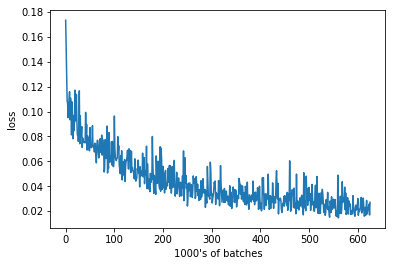

Epoch: 19, Batch: 150, Avg. Loss: 0.035608252976089716
41.77657675743103


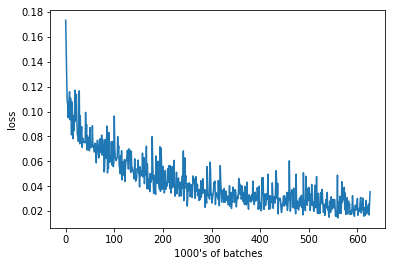

Epoch: 19, Batch: 160, Avg. Loss: 0.017438478581607342
41.40102219581604


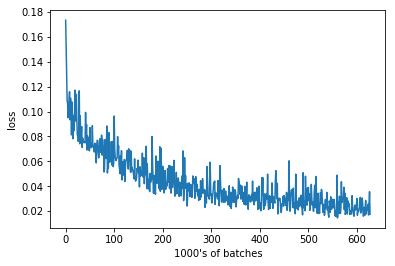

Epoch: 19, Batch: 170, Avg. Loss: 0.029700909834355117
41.56739282608032


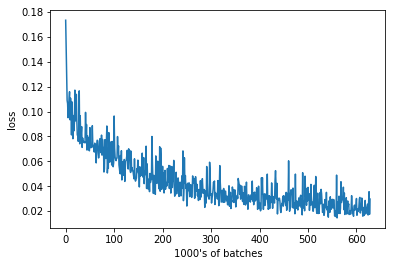

Epoch: 19, Batch: 180, Avg. Loss: 0.03131688954308629
43.59795641899109


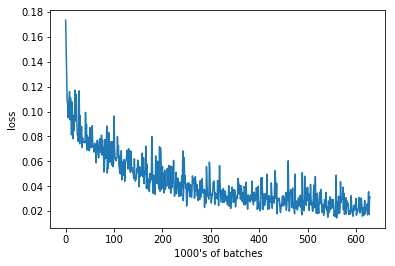

Epoch: 19, Batch: 190, Avg. Loss: 0.019857187662273644
41.541202783584595


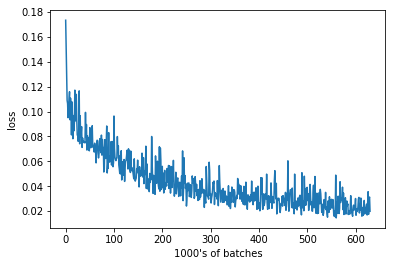

Epoch: 19, Batch: 200, Avg. Loss: 0.02230630926787853
41.41801619529724


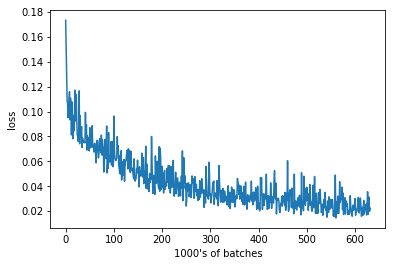

Epoch: 19, Batch: 210, Avg. Loss: 0.023296950943768026
41.77960920333862


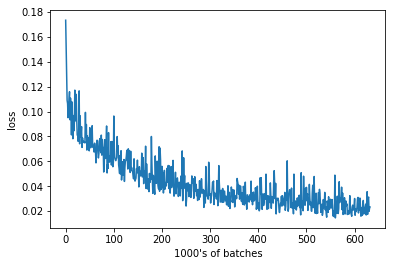

Epoch: 19, Batch: 220, Avg. Loss: 0.020127155352383852
41.59000635147095


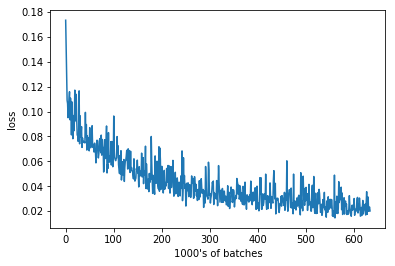

Epoch: 19, Batch: 230, Avg. Loss: 0.035521085001528264
43.84913945198059


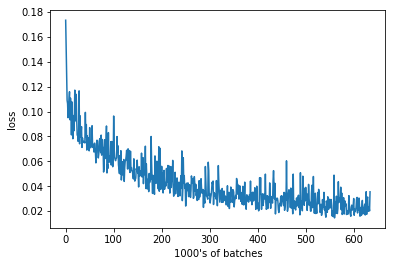

Epoch: 19, Batch: 240, Avg. Loss: 0.05714294370263815
42.11858630180359


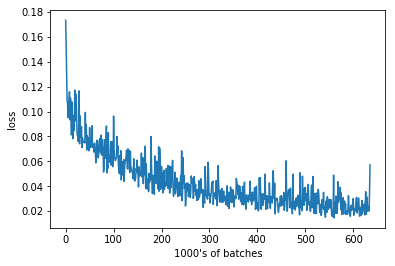

Epoch: 19, Batch: 250, Avg. Loss: 0.02623394560068846
41.968748331069946


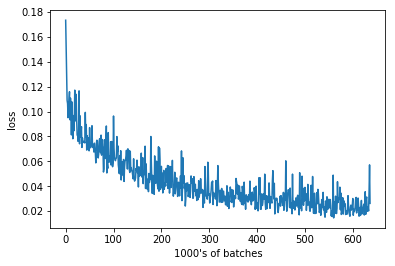

Epoch: 19, Batch: 260, Avg. Loss: 0.019169598538428544
42.00055551528931


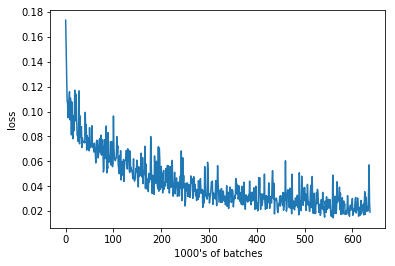

Epoch: 19, Batch: 270, Avg. Loss: 0.022742819134145977
43.56789588928223


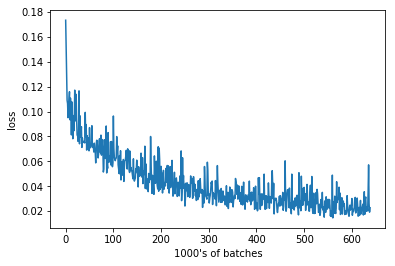

Epoch: 19, Batch: 280, Avg. Loss: 0.02782304910942912
41.568127155303955


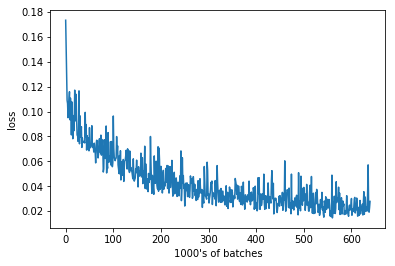

Epoch: 19, Batch: 290, Avg. Loss: 0.016527059674263
42.125367641448975


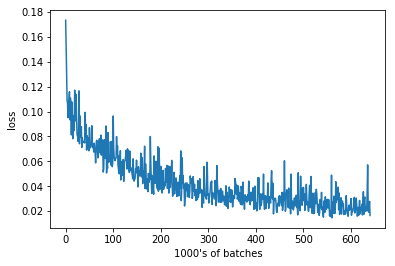

Epoch: 19, Batch: 300, Avg. Loss: 0.02337813745252788
41.81648540496826


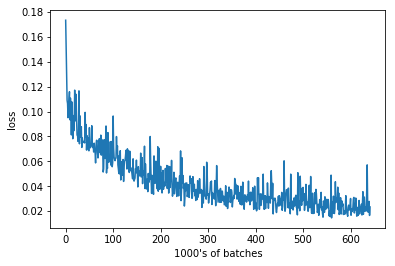

Epoch: 19, Batch: 310, Avg. Loss: 0.022714959736913443
41.83706045150757


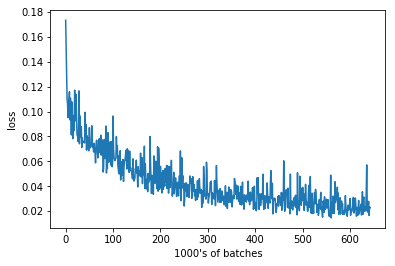

Epoch: 19, Batch: 320, Avg. Loss: 0.024857854843139647
44.148520946502686


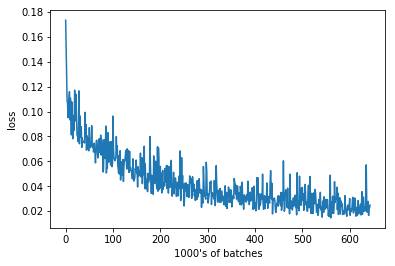

Epoch: 19, Batch: 330, Avg. Loss: 0.019901748560369015
41.65218138694763


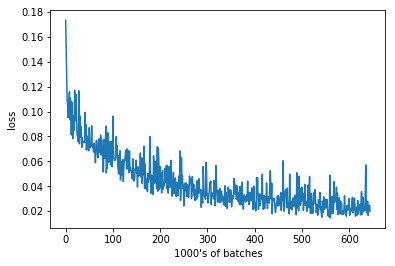

Epoch: 19, Batch: 340, Avg. Loss: 0.018470057286322117
41.15674924850464


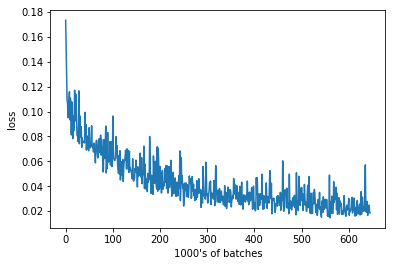

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


Epoch: 20, Batch: 10, Avg. Loss: 0.023032043501734732
48.955886363983154


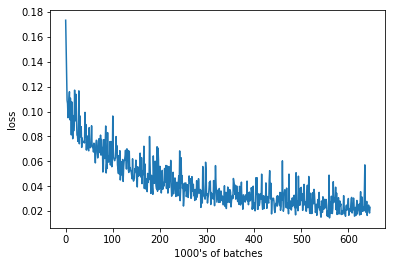

Epoch: 20, Batch: 20, Avg. Loss: 0.022537090908735992
46.01352381706238


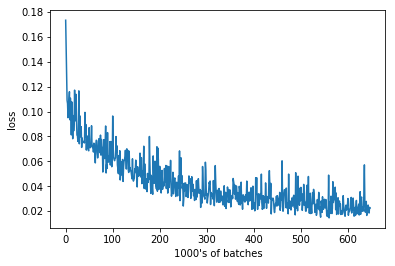

Epoch: 20, Batch: 30, Avg. Loss: 0.025362909212708472
42.22814893722534


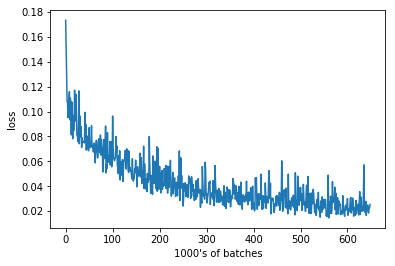

Epoch: 20, Batch: 40, Avg. Loss: 0.03175830258987844
42.14535093307495


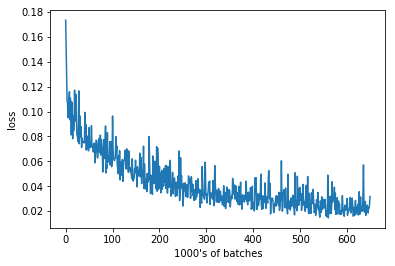

Epoch: 20, Batch: 50, Avg. Loss: 0.02617615181952715
41.96186113357544


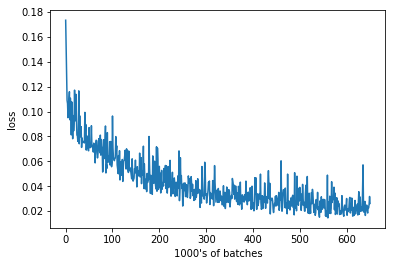

Epoch: 20, Batch: 60, Avg. Loss: 0.018867010064423085
41.96532487869263


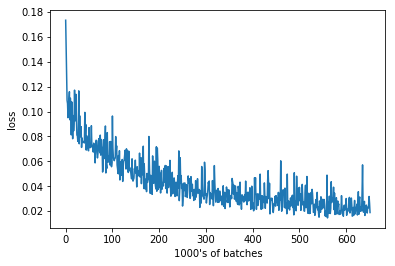

Epoch: 20, Batch: 70, Avg. Loss: 0.019953122921288015
43.68051838874817


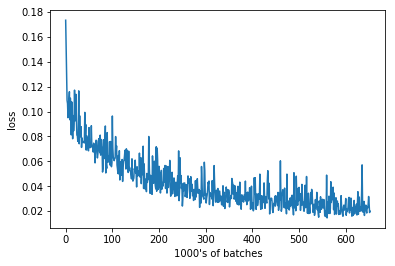

Epoch: 20, Batch: 80, Avg. Loss: 0.02275604838505387
42.14527440071106


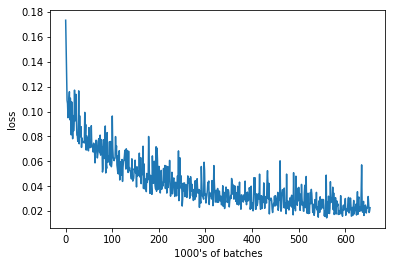

Epoch: 20, Batch: 90, Avg. Loss: 0.030110723059624433
41.641286849975586


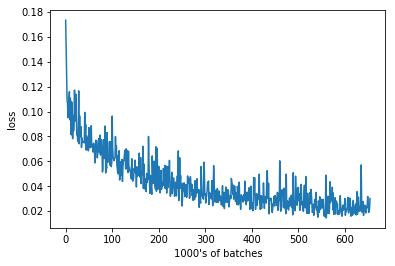

Epoch: 20, Batch: 100, Avg. Loss: 0.023611041158437727
41.63330054283142


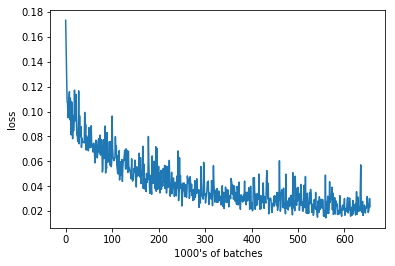

Epoch: 20, Batch: 110, Avg. Loss: 0.02290312172845006
43.78132343292236


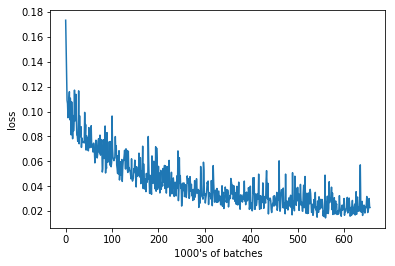

Epoch: 20, Batch: 120, Avg. Loss: 0.019243824016302823
42.0133593082428


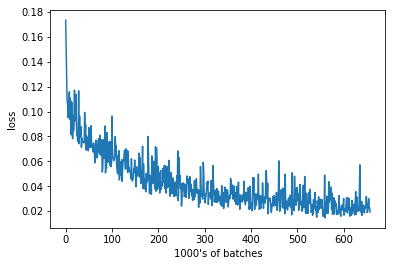

Epoch: 20, Batch: 130, Avg. Loss: 0.02757018180564046
41.67265033721924


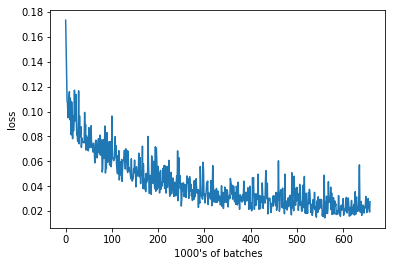

Epoch: 20, Batch: 140, Avg. Loss: 0.03861968321725726
41.67709136009216


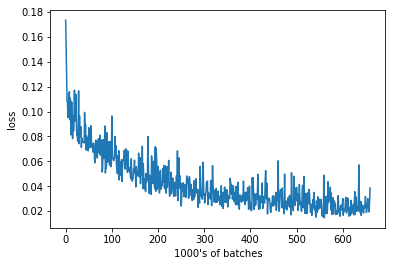

Epoch: 20, Batch: 150, Avg. Loss: 0.017067721392959357
41.355698585510254


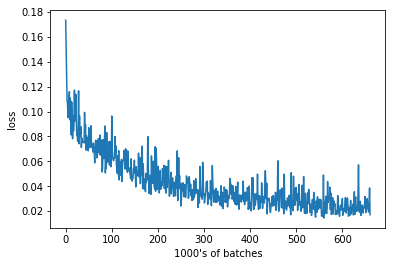

Epoch: 20, Batch: 160, Avg. Loss: 0.018518603453412653
43.51633310317993


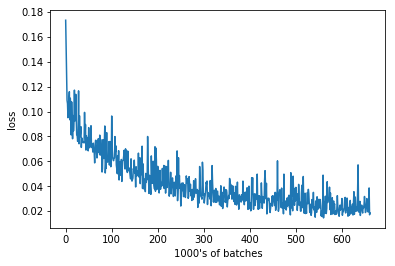

Epoch: 20, Batch: 170, Avg. Loss: 0.0362548278644681
41.92344880104065


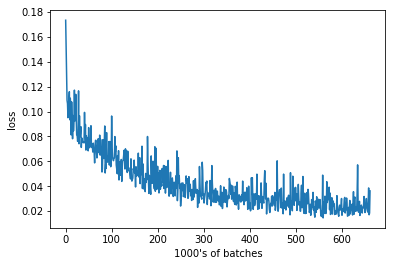

Epoch: 20, Batch: 180, Avg. Loss: 0.017893896764144303
41.607081174850464


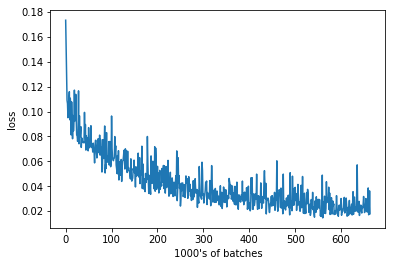

Epoch: 20, Batch: 190, Avg. Loss: 0.01651311116293073
41.529706716537476


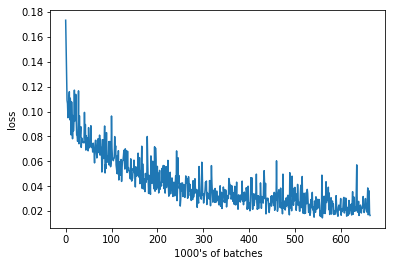

Epoch: 20, Batch: 200, Avg. Loss: 0.02003763122484088
41.37820386886597


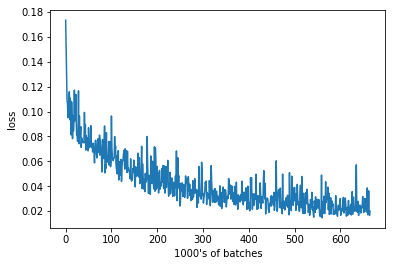

Epoch: 20, Batch: 210, Avg. Loss: 0.025326110795140265
43.61708092689514


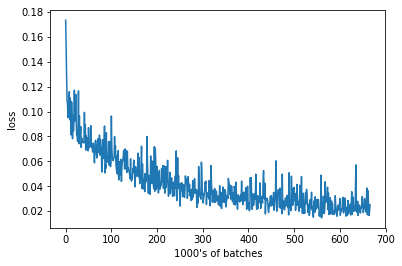

Epoch: 20, Batch: 220, Avg. Loss: 0.03627285985276103
41.44624376296997


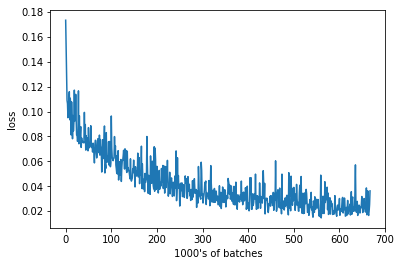

Epoch: 20, Batch: 230, Avg. Loss: 0.016118861734867096
41.356115102767944


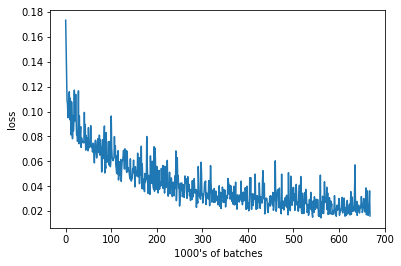

Epoch: 20, Batch: 240, Avg. Loss: 0.014936216175556183
41.64446234703064


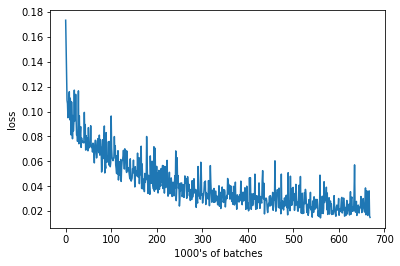

Epoch: 20, Batch: 250, Avg. Loss: 0.022377645783126354
41.389009952545166


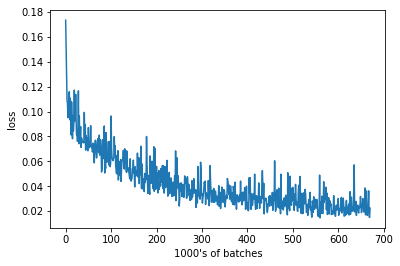

Epoch: 20, Batch: 260, Avg. Loss: 0.02152389120310545
43.78462266921997


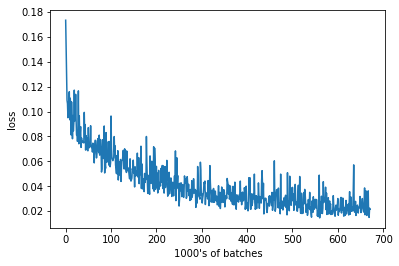

Epoch: 20, Batch: 270, Avg. Loss: 0.026304580084979535
41.530890703201294


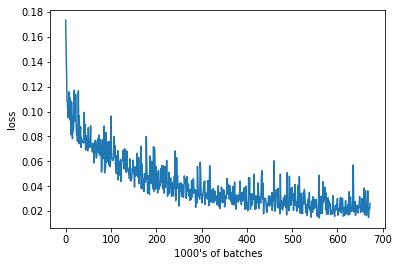

Epoch: 20, Batch: 280, Avg. Loss: 0.03155751433223486
42.30205750465393


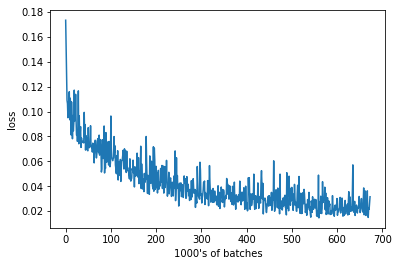

Epoch: 20, Batch: 290, Avg. Loss: 0.021959029138088226
41.86869168281555


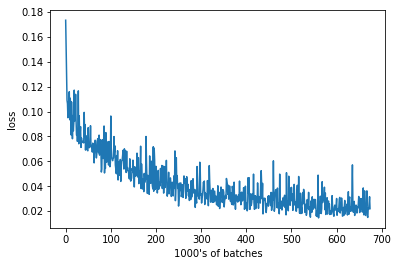

Epoch: 20, Batch: 300, Avg. Loss: 0.01776286866515875
43.63066506385803


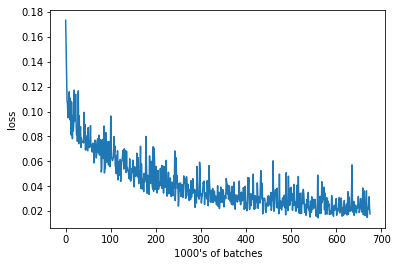

Epoch: 20, Batch: 310, Avg. Loss: 0.015093114506453276
41.28513765335083


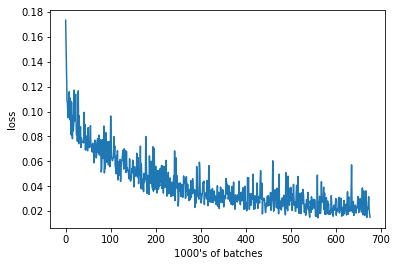

Epoch: 20, Batch: 320, Avg. Loss: 0.01692806500941515
41.92627930641174


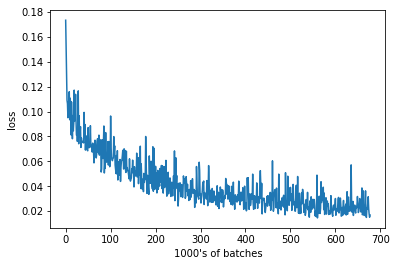

Epoch: 20, Batch: 330, Avg. Loss: 0.01889542806893587
42.00186610221863


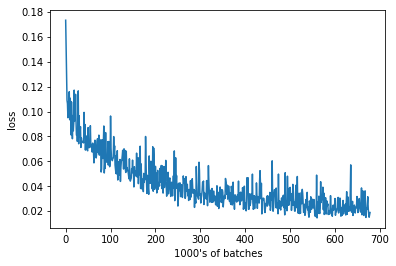

Epoch: 20, Batch: 340, Avg. Loss: 0.017185610253363848
42.27387094497681


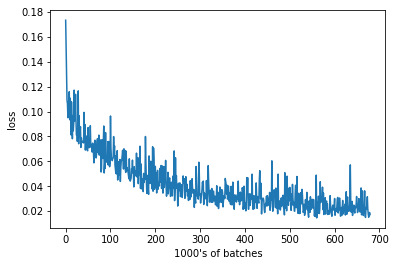

Finished Training


In [15]:
# train your network
n_epochs = 20 # start small, and increase when you've decided on your model structure and hyperparams

# this is a Workspaces-specific context manager to keep the connection
# alive while training your model, not part of pytorch
with active_session():
    training_loss = train_net(n_epochs)

## Test data

See how your model performs on previously unseen, test data. We've already loaded and transformed this data, similar to the training data. Next, run your trained model on these images to see what kind of keypoints are produced. You should be able to see if your model is fitting each new face it sees, if the points are distributed randomly, or if the points have actually overfitted the training data and do not generalize.

In [16]:
# net.load_state_dict(torch.load('saved_models/keypoints_model_1.pt'))
## print out your net and prepare it for testing (uncomment the line below)
# net.eval()

In [17]:
# get a sample of test data again
test_images, test_outputs, gt_pts = net_sample_output()

print(test_images.data.size())
print(test_outputs.data.size())
print(gt_pts.size())

/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()
/home/workspace/data_load.py:39: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  key_pts = self.key_pts_frame.iloc[idx, 1:].as_matrix()


torch.Size([10, 1, 224, 224])
torch.Size([10, 68, 2])
torch.Size([10, 68, 2])


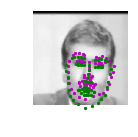

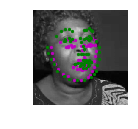

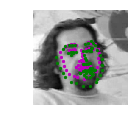

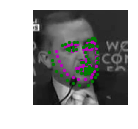

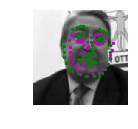

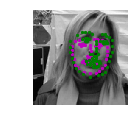

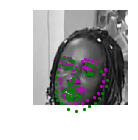

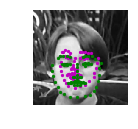

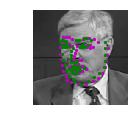

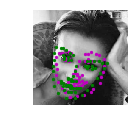

In [18]:
## TODO: visualize your test output
# you can use the same function as before, by un-commenting the line below:

visualize_output(test_images, test_outputs, gt_pts)


Once you've found a good model (or two), save your model so you can load it and use it later!

Save your models but please **delete any checkpoints and saved models before you submit your project** otherwise your workspace may be too large to submit.

In [19]:
## TODO: change the name to something uniqe for each new model
model_dir = 'saved_models/'
model_name = 'kp_l1_smooth.pt'
# model_name = 'keypoints_model_2.pt'

# after training, save your model parameters in the dir 'saved_models'
torch.save(net.state_dict(), model_dir+model_name)

After you've trained a well-performing model, answer the following questions so that we have some insight into your training and architecture selection process. Answering all questions is required to pass this project.

### Question 1: What optimization and loss functions did you choose and why?


A loss function needed to be chosen that helps with regression problems. Loss function Mean Square Error Loss MSE was chosen to minimize the square of distance between points. Squaring the errors helps reduce outliers, it is also a common way of measuring distance. Mean Absolute Error MAE was also examined to see if it would display better performance. MAE can be better than MSE when there significant outliers that are causing over correction. MAE plateaued quickly and never became as good as MSE  

Adam optimizer was chosen over stochastic gradient descent as it natively includes momentum and adjusts the learning rates for parameters automatically. It requires less tuning. Learning rate was decreased from the default of 1e-3 to 1e-4 in order to reduce the chance of moving to a local optimum too quickly

### Question 2: What kind of network architecture did you start with and how did it change as you tried different architectures? Did you decide to add more convolutional layers or any layers to avoid overfitting the data?

I started with a simple set of two convolutional layers, each with 32 convolutions as a base attempt. It did not perform well as measured by average loss. The lowest loss was 0.18
The paper Facial Keypoints using Deep CNN - Namish Net helped shape my network.
Pooling was applied to each Convolutional layer to give the network the ability to learn larger features
A larger number of convolutions was applied at successive levels to help the network learn more complex features 

Dropout was used to avoid overfitting. It was applied between the first and second convolutional layer and applied between the two fully connected layers to avoid overfitting. Adding dropout between the first and second convolutional layer resulted in poor performance initially with a first batch loss of 1.18 as compared to 0.4 without. Likely because the model did not have complete information. Performance recovered quickly by the second batch to 0.2

After getting the model above working I tried the complete model from the paper. One surprising finding to me was that using the complete model resulted in fewer parameters and faster training. This was likely because the reductions from the different convolutional layers resulted in fewer parameters for the fully connected layers to train. However it didn't produce better results so I went back to the previous model

A few useful items I added for model tracking was timing of each group of epochs and a graph showing average loss over time to understand how the model was performing.

### Question 3: How did you decide on the number of epochs and batch_size to train your model?

Number of epochs was chosen by observing how the loss rate progressed and how the model performed on the test data. Models can be overtrained on the train set and have problems with over fitting. A trend line was fit to the data and found that at least to 10 epochs performance continued to improve. 

Initially I tried a batch size of 256 like in the Namish Net paper but it caused memory errors. I reduced batch size to 10 as a default. Batch size was then increased to 16 based on the Namish paper which recommended more efficient training because vector operations are optimized for sizes of powers of 2. This did not improve epoch throughput speed.

When I tried out the full Namish Net model, a batch size of 16 caused memory issues so I reduced batch size to 10.

## Feature Visualization

Sometimes, neural networks are thought of as a black box, given some input, they learn to produce some output. CNN's are actually learning to recognize a variety of spatial patterns and you can visualize what each convolutional layer has been trained to recognize by looking at the weights that make up each convolutional kernel and applying those one at a time to a sample image. This technique is called feature visualization and it's useful for understanding the inner workings of a CNN.

In the cell below, you can see how to extract a single filter (by index) from your first convolutional layer. The filter should appear as a grayscale grid.

[[ 0.14694099 -0.14791363  0.16917095 -0.02415073  0.07025871]
 [ 0.00933702  0.19349672  0.06638704 -0.04823781 -0.0252187 ]
 [ 0.18380523 -0.16114737 -0.03530251 -0.1696506  -0.12388256]
 [-0.0998394  -0.16527687  0.11288927  0.16599964 -0.19908699]
 [-0.07598829  0.09398233 -0.14655355 -0.06906458 -0.05004702]]
(5, 5)


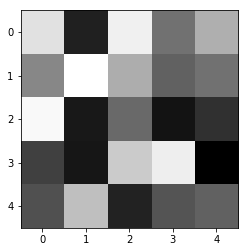

In [20]:
# Get the weights in the first conv layer, "conv1"
# if necessary, change this to reflect the name of your first conv layer
weights1 = net.conv1.weight.data

w = weights1.numpy()

filter_index = 0

print(w[filter_index][0])
print(w[filter_index][0].shape)

# display the filter weights
plt.imshow(w[filter_index][0], cmap='gray')


## Feature maps

Each CNN has at least one convolutional layer that is composed of stacked filters (also known as convolutional kernels). As a CNN trains, it learns what weights to include in it's convolutional kernels and when these kernels are applied to some input image, they produce a set of **feature maps**. So, feature maps are just sets of filtered images; they are the images produced by applying a convolutional kernel to an input image. These maps show us the features that the different layers of the neural network learn to extract. For example, you might imagine a convolutional kernel that detects the vertical edges of a face or another one that detects the corners of eyes. You can see what kind of features each of these kernels detects by applying them to an image. One such example is shown below; from the way it brings out the lines in an the image, you might characterize this as an edge detection filter.

<img src='images/feature_map_ex.png' width=50% height=50%/>


Next, choose a test image and filter it with one of the convolutional kernels in your trained CNN; look at the filtered output to get an idea what that particular kernel detects.

### TODO: Filter an image to see the effect of a convolutional kernel
---

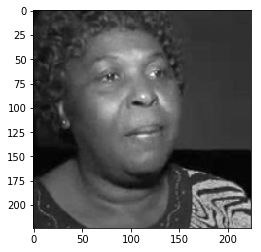

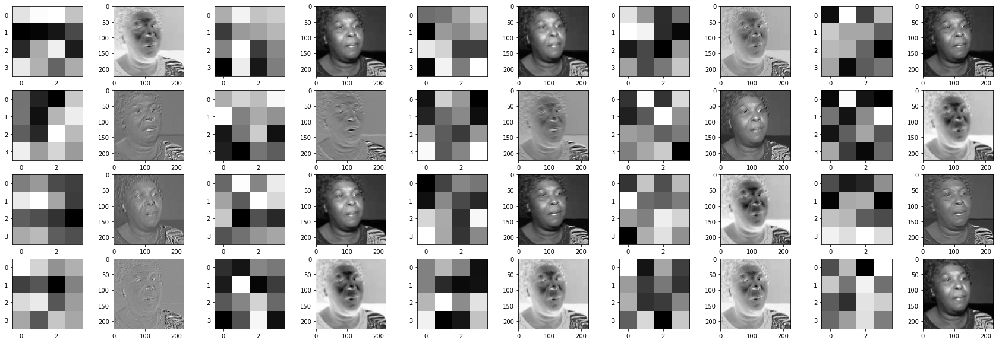

In [21]:
import cv2
##TODO: load in and display any image from the transformed test dataset

## TODO: Using cv's filter2D function,
## apply a specific set of filter weights (like the one displayed above) to the test image
i = 1
image = test_images[i].data   # get the image from it's Variable wrapper
image = image.numpy()   # convert to numpy array from a Tensor
image = np.transpose(image, (1, 2, 0))   # transpose to go from torch to numpy image

plt.imshow(np.squeeze(image), cmap='gray')

# second conv layer, conv2
weights = net.conv2.weight.data
w = weights.numpy()

# 1. first conv layer
# for 20 filters
fig=plt.figure(figsize=(30, 10))
columns = 5*2
rows = 2*2
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    if ((i%2)==0):
        plt.imshow(w[int(i/2)][0], cmap='gray')
    else:
        c = cv2.filter2D(image, -1, w[int((i-1)/2)][0])
        plt.imshow(c, cmap='gray')
plt.show()

### Question 4: Choose one filter from your trained CNN and apply it to a test image; what purpose do you think it plays? What kind of feature do you think it detects?


The bottom left filter appears to highlight dark colors in white like the sweater and eyes. 
The filter in row 3, column 5 help with edge detection to show things like the outline of the head, eyes and nose

---
## Moving on!

Now that you've defined and trained your model (and saved the best model), you are ready to move on to the last notebook, which combines a face detector with your saved model to create a facial keypoint detection system that can predict the keypoints on *any* face in an image!